In [ ]:
import numpy as np
import tensorflow as tf

# Set seed for NumPy
np.random.seed(42)

# Set seed for TensorFlow
tf.random.set_seed(42)


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

!pip install tensorflow
import tensorflow as tf

In [ ]:
import os
import shutil
import textwrap as tw
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.ticker import FuncFormatter
import seaborn as sns

import cv2
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn import svm

from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops

from scipy import ndimage

# tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Activation, BatchNormalization, Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.applications.resnet import preprocess_input

In [ ]:
import warnings
warnings.filterwarnings('ignore')

#ISIC data set from kaggle image dataset in csv

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/ISIC_2019_Training_GroundTruth.csv", header = 0)
data.head(20)

In [ ]:
data.info()

In [ ]:
data.tail()

In [ ]:
data.describe()

In [ ]:
data.corr()

In [ ]:
lesion_type_dict = {
    'NV': 'Melanocytic nevi',
    'MEL': 'Melanoma',
    'BKL': 'Benign keratosis ',
    'BCC': 'Basal cell carcinoma',
    'AK': 'Actinic keratoses',
    'VASC': 'Vascular lesions',
    'DF': 'Dermatofibroma',
    'SCC' : 'Squamous cell carcinoma'
}

In [ ]:
# print all columns
pd.set_option('display.max_columns', None)

# inhibit graphics card runs out of memory
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)### Step 1: Load and preprocess the image within the CNN architecture

### Step 1: Load and preprocess the image within the CNN architecture

In [ ]:
def load_data(path: str):
    dir = Path(path)

    # list of all filepathes
    filepaths = list(dir.glob(r'**/*.jpg'))

    # list of labels extracted from last foldername of filepath
    labels = list(map(lambda l: os.path.split(os.path.split(l)[0])[1], filepaths))

    # series of string filepathes
    filepaths = pd.Series(filepaths, name='FilePaths').astype(str)

    # series of string labels
    labels = pd.Series(labels, name='Labels').astype(str)

    # merge series to dataframe df
    df = pd.merge(filepaths, labels, right_index=True, left_index=True)

    # Resampling complete rows and reset the index
    return df.sample(frac=1).reset_index(drop=True)

df = load_data ("/content/drive/MyDrive/Data/train")

In [ ]:
# total categires
len(os.listdir("/content/drive/MyDrive/Data/train"))

4

In [ ]:
os.listdir("/content/drive/MyDrive/Data/train")

['malignant',
 'benign',
 'train benign augmented_images ',
 'train malignant augmented']

In [ ]:
list_diseases = os.listdir("/content/drive/MyDrive/Data/train")

In [ ]:
results2 = []
for disease in list_diseases:
    dies_name_count = {}
    count_disease = len(os.listdir(("/content/drive/MyDrive/Data/train")))
    dies_name_count['disease'] = disease
    dies_name_count['count_images'] = count_disease
    results2.append(dies_name_count)

In [ ]:
results = pd.DataFrame(results2)
results

,disease,count_images
0,malignant,4
1,benign,4
2,train benign augmented_images,4
3,train malignant augmented,4


In [ ]:
df.head(5)  ####

,FilePaths,Labels
0,/content/drive/MyDrive/Data/train/malignant/72...,malignant
1,/content/drive/MyDrive/Data/train/benign/1043.jpg,benign
2,/content/drive/MyDrive/Data/train/malignant/24...,malignant
3,/content/drive/MyDrive/Data/train/malignant/10...,malignant
4,/content/drive/MyDrive/Data/train/benign/198.jpg,benign


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2843 entries, 0 to 2842
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   FilePaths  2843 non-null   object
 1   Labels     2843 non-null   object
dtypes: object(2)
memory usage: 44.5+ KB


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2843 entries, 0 to 2842
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   FilePaths  2843 non-null   object
 1   Labels     2843 non-null   object
dtypes: object(2)
memory usage: 44.5+ KB


In [ ]:
# Step 1: Inspect DataFrame structure
print(df.head())

# Step 2: Check column names
print(df.columns)

# Step 3: Check for leading/trailing spaces
# You can use strip() to remove extra spaces
df.columns = df.columns.str.strip()

# Step 4: If data is loaded from an external source, check the source file
# Ensure that the column name is correct in the source file


                                           FilePaths     Labels
0  /content/drive/MyDrive/Data/train/malignant/72...  malignant
1  /content/drive/MyDrive/Data/train/benign/1043.jpg     benign
2  /content/drive/MyDrive/Data/train/malignant/24...  malignant
3  /content/drive/MyDrive/Data/train/malignant/10...  malignant
4   /content/drive/MyDrive/Data/train/benign/198.jpg     benign
Index(['FilePaths', 'Labels'], dtype='object')


In [ ]:
print(df.columns)


Index(['FilePaths', 'Labels'], dtype='object')


[Text(0, 0, 'train benign augmented_images '),
 Text(1, 0, 'train malignant augmented'),
 Text(2, 0, 'malignant'),
 Text(3, 0, 'benign')]

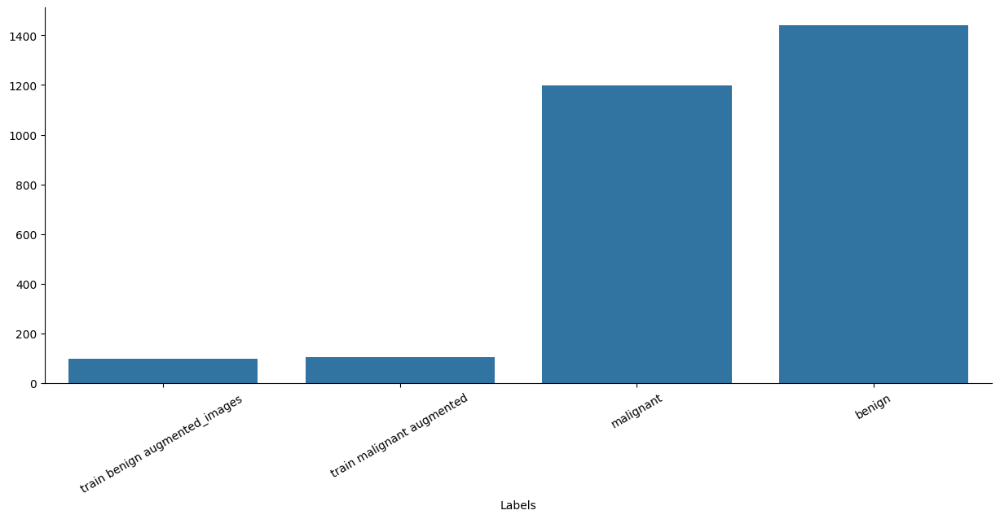

In [ ]:

# ordered count of rows per unique label
labels_count = df['Labels'].value_counts(ascending=True)

f = plt.figure(figsize=(15, 6))
s = sns.barplot(x=labels_count.index, y=labels_count.values)

sns.despine()
s.set_xticklabels(s.get_xticklabels(), rotation = 30)

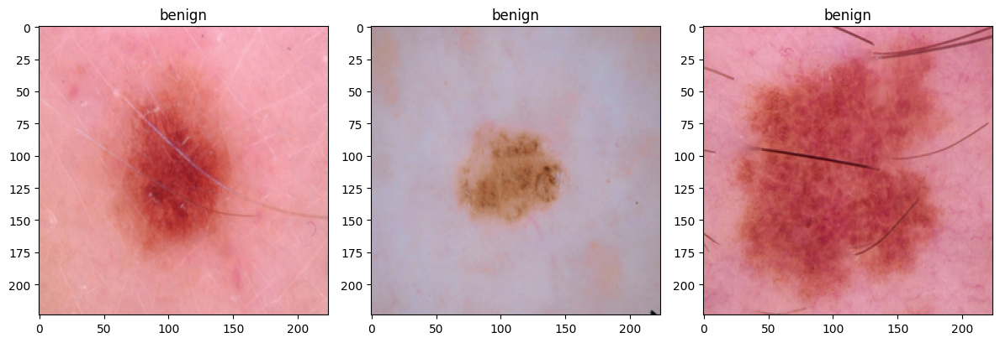

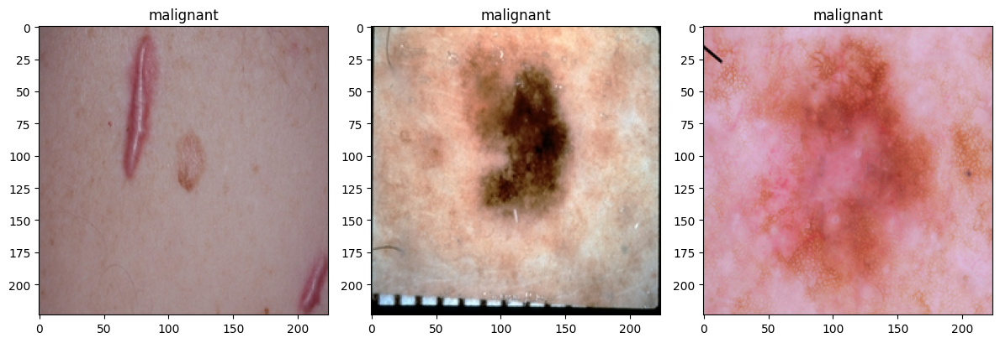

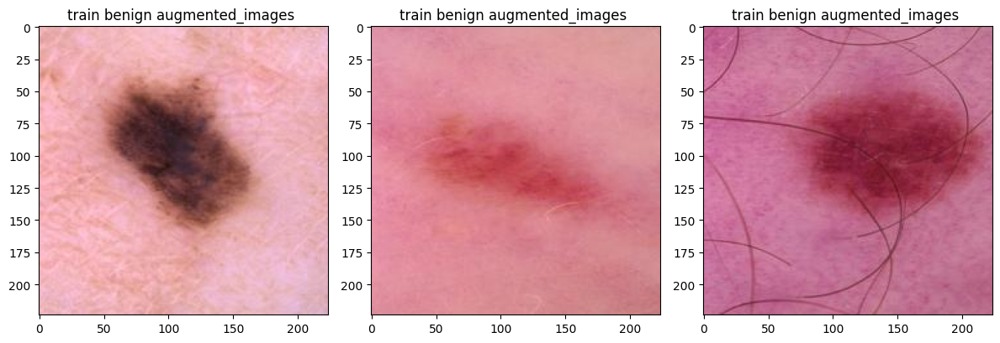

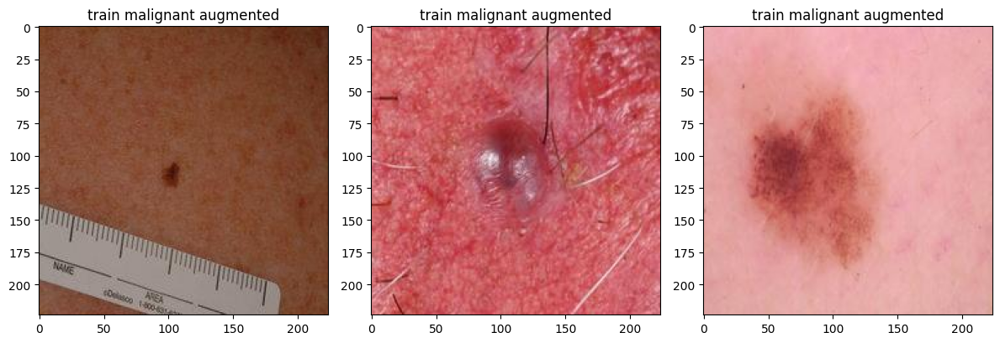

In [ ]:
def plot_images_per_label(df, label, cols: int, size: tuple):
    fig, axs = plt.subplots(nrows=1, ncols=cols, figsize=size)

    cntMax = cols
    cntCur = 0
    for index, row in df.iterrows():
        if(row['Labels'] == label and cntCur < cntMax):
            axs[cntCur].imshow(plt.imread(df.FilePaths[index]))
            axs[cntCur].set_title(df.Labels[index])

            cntCur += 1
        else:
            if(cntCur >= cntMax):
                break

    plt.tight_layout()
    plt.show()


# unique labels
labels = sorted(df['Labels'].unique())
# loop through labels
for label in labels:
    plot_images_per_label(df, label, 3, (12,9))

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load or create your dataset into a DataFrame
# Example: df = pd.read_csv('your_dataset.csv')

# Check if the DataFrame contains data
if not df.empty:
    # Split the data into training and validation sets
    X_train, X_val = train_test_split(df, test_size=0.25, stratify=df['Labels'], random_state=1)

    print('Train Data: ', X_train.shape)
else:
    print('DataFrame is empty. Load or create a dataset before splitting.')

Train Data:  (2132, 2)


In [ ]:
#training data
training_dir=("/content/drive/MyDrive/Data/train")

#increases amount of data by making different forms of image
training_generator = ImageDataGenerator(rescale=1/255,
                                        featurewise_center = True,
                                        samplewise_center=True,
                                        featurewise_std_normalization=False,
                                        samplewise_std_normalization=True,
                                        zca_whitening=False,
                                        rotation_range=30,
                                        zoom_range=0.2,
                                        width_shift_range=0.1,
                                        height_shift_range=0.1,
                                        horizontal_flip=True,
                                        vertical_flip=True)

#creates accessible training data
train_generator=training_generator.flow_from_directory(training_dir,target_size=(224,224),
                                                       batch_size=4,class_mode='binary')

Found 2843 images belonging to 4 classes.


In [ ]:
# Define the batch size
batch_size = 128  # or any other value you want to use

# Now you can use batch_size
# For example:
# data_generator = ImageDataGenerator(..., batch_size=batch_size)


In [ ]:
# number of samples/images per iteration
BATCH_SIZE = 32
# input image size
IMG_SIZE = (224, 224)
 # count of epchos
EPOCHS = 10

# # image preprocessing
img_data_gen = ImageDataGenerator(shear_range=0.2,
                                  zoom_range=0.2,
                                   horizontal_flip=True,
                                   preprocessing_function=preprocess_input)

'''X_train = img_data_gen.flow_from_dataframe(dataframe=X_train,
                                             x_col='FilePaths',
                                             y_col='labels',
                                             target_size=IMG_SIZE,
                                             color_mode='rgb',
                                             class_mode='categorical',
                                             batch_size=BATCH_SIZE,
                                             seed=1)
'''
X_val = img_data_gen.flow_from_dataframe(dataframe=X_val,
                                          x_col='FilePaths',
                                          y_col='Labels',
                                          target_size=IMG_SIZE,
                                          color_mode='rgb',
                                          class_mode='categorical',
                                          batch_size=BATCH_SIZE,
                                          seed=1)

Found 711 validated image filenames belonging to 4 classes.


In [ ]:
import os

folder_path = "/content/drive/MyDrive/Data/test"
total_objects = len(os.listdir(folder_path))
print("Total number of objects in the folder:", total_objects)


Total number of objects in the folder: 4


In [ ]:
import os
import glob

folder_path = "/content/drive/MyDrive/Data/test/benign"
image_extensions = ["jpg", "jpeg", "png", "gif", "bmp"]  # Add more extensions if needed

total_images = sum(len(glob.glob(os.path.join(folder_path, f"*.{ext}"))) for ext in image_extensions)
print("Total number of images in the folder:", total_images)


Total number of images in the folder: 364


In [ ]:
import os
import glob

folder_path = "/content/drive/MyDrive/Data/test/malignant"
image_extensions = ["jpg", "jpeg", "png", "gif", "bmp"]  # Add more extensions if needed

total_images = sum(len(glob.glob(os.path.join(folder_path, f"*.{ext}"))) for ext in image_extensions)
print("Total number of images in the folder:", total_images)


Total number of images in the folder: 300


In [ ]:
#validation data
validation_dir=("/content/drive/MyDrive/Data")

#increases amount of data by making different forms of image
validation_generator=ImageDataGenerator(rescale=1/255)
val_generator=validation_generator.flow_from_directory(validation_dir,target_size=(224,224), batch_size=4, class_mode='binary')

Found 3691 images belonging to 4 classes.


In [ ]:
### for testing dataset

In [ ]:
import os

folder_path = "/content/drive/MyDrive/Data/test"
total_objects = len(os.listdir(folder_path))
print("Total number of objects in the folder:", total_objects)


Total number of objects in the folder: 4


In [ ]:
import os
import glob

folder_path = "/content/drive/MyDrive/Data/test/benign"
image_extensions = ["jpg", "jpeg", "png", "gif", "bmp"]  # Add more extensions if needed

total_images = sum(len(glob.glob(os.path.join(folder_path, f"*.{ext}"))) for ext in image_extensions)
print("Total number of images in the folder:", total_images)


Total number of images in the folder: 364


In [ ]:
import os
import glob

folder_path = "/content/drive/MyDrive/Data/test/malignant"
image_extensions = ["jpg", "jpeg", "png", "gif", "bmp"]  # Add more extensions if needed

total_images = sum(len(glob.glob(os.path.join(folder_path, f"*.{ext}"))) for ext in image_extensions)
print("Total number of images in the folder:", total_images)


Total number of images in the folder: 300


In [ ]:
#testing data
testing_dir=("/content/drive/MyDrive/Data/test")

#increases amount of data by making different forms of image
testing_generator = ImageDataGenerator(rescale=1/255,
                                        featurewise_center = False,
                                        samplewise_center=False,
                                        featurewise_std_normalization=False,
                                        samplewise_std_normalization=False,
                                        zca_whitening=False,
                                        rotation_range=30,
                                        zoom_range=0.2,
                                        width_shift_range=0.1,
                                        height_shift_range=0.1,
                                        horizontal_flip=False,
                                        vertical_flip=False)

#creates accessible testing data
test_generator=training_generator.flow_from_directory(testing_dir,target_size=(224,224),
                                                       batch_size=4,class_mode='binary')

Found 720 images belonging to 4 classes.


In [ ]:
# #model sequelling
model = Sequential()

model.add(layers.Conv2D(32, (3,3), input_shape = (224,224,3), activation = 'relu'))
model.add(layers.MaxPooling2D(2,2))

model.add(layers.Conv2D(64, (3,3), activation = 'relu'))
model.add(layers.MaxPooling2D(2,2))

model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(128, (3,3), activation = 'relu'))
model.add(layers.MaxPooling2D(2,2))
model.add(layers.Dropout(0.2))

model.add(layers.Conv2D(256, (3,3), activation = 'relu'))
model.add(layers.MaxPooling2D(2,2))

model.add(layers.Flatten())
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 54, 54, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       7

In [ ]:
# Compile the model with RMSprop optimizer
model.compile(optimizer='RMSprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])


In [ ]:
#compiling the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['acc'])

In [ ]:


# Compile the model with eager execution enabled
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'],
              run_eagerly=True)



In [ ]:
# Train the model
history = model.fit(train_generator,
                    epochs=5,
                    validation_data=val_generator,
                    verbose=1)


Epoch 1/5
711/711 [==============================] - 941s 1s/step - loss: 1.4979 - accuracy: 0.5652 - val_loss: 0.2279 - val_accuracy: 0.1948
Epoch 2/5
711/711 [==============================] - 195s 274ms/step - loss: 1.0515 - accuracy: 0.5582 - val_loss: -5.2465 - val_accuracy: 0.1951
Epoch 3/5
711/711 [==============================] - 198s 278ms/step - loss: 0.1021 - accuracy: 0.4221 - val_loss: 0.5533 - val_accuracy: 0.1951
Epoch 4/5
711/711 [==============================] - 198s 278ms/step - loss: -0.6172 - accuracy: 0.4207 - val_loss: 0.4694 - val_accuracy: 0.1951
Epoch 5/5
711/711 [==============================] - 197s 277ms/step - loss: 0.6764 - accuracy: 0.4210 - val_loss: 0.3496 - val_accuracy: 0.1951


In [223]:
import joblib

# Save the model using joblib
joblib.dump(model, 'skin_cancer_model.pkl')

['skin_cancer_model.pkl']

In [224]:
pip install joblib

In [225]:
pip install scikit-learn

In [226]:
import sklearn
print(sklearn.__version__)

from sklearn.svm import SVC

# Create an instance of the SVC model
model = SVC()
print(model)


1.2.2
SVC()


In [227]:
import joblib
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import numpy as np

# Example data (replace with your actual data)
train_generator = np.random.rand(100, 224*224*3)  # Example training data
train_labels = np.random.randint(2, size=100)     # Example training labels

# Define and train the model
model = SVC()
scaler = StandardScaler()

# Fit the scaler on the training data and transform the data
train_generator_scaled = scaler.fit_transform(train_generator)
model.fit(train_generator_scaled, train_labels)

# Save the model and the scaler
joblib.dump(model, 'skin_cancer_model.pkl')
joblib.dump(scaler, 'scaler.pkl')


['scaler.pkl']

In [228]:
import joblib

# Load the model and the scaler
model = joblib.load('skin_cancer_model.pkl')
scaler = joblib.load('scaler.pkl')


In [229]:
import tkinter as tk
print("tkinter is installed and available.")


tkinter is installed and available.


In [230]:
!sudo apt-get install xvfb

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libfontenc1 libxfont2 libxkbfile1 x11-xkb-utils xfonts-base xfonts-encodings
  xfonts-utils xserver-common
The following NEW packages will be installed:
  libfontenc1 libxfont2 libxkbfile1 x11-xkb-utils xfonts-base xfonts-encodings
  xfonts-utils xserver-common xvfb
0 upgraded, 9 newly installed, 0 to remove and 0 not upgraded.
Need to get 7,813 kB of archives.
After this operation, 11.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfontenc1 amd64 1:1.1.4-1build3 [14.7 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxfont2 amd64 1:2.0.5-1build1 [94.5 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxkbfile1 amd64 1:1.1.0-1build3 [71.8 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/main amd64 x11-xkb-utils amd64 7.7+5build4 [172 kB]
Get:5 http://archive

In [231]:
!sudo yum install Xvfb

sudo: yum: command not found


In [232]:
!xvfb-run python your_script.py

python3: can't open file '/content/your_script.py': [Errno 2] No such file or directory


In [7]:
import tkinter as tk
from tkinter import filedialog
from tkinter import Label
from PIL import Image, ImageTk
import numpy as np
import joblib
import tensorflow as tf

# Load the trained model and scaler
model = joblib.load('/content/drive/MyDrive/skin_cancer_model.pkl')
scaler = joblib.load('/content/drive/MyDrive/scaler.pkl')

# Function to preprocess the image
def preprocess_image(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array.reshape(1, -1)  # Flatten the image
    img_array = scaler.transform(img_array)  # Scale the image
    return img_array

# Function to make prediction
def predict(image_path):
    img_array = preprocess_image(image_path)
    prediction = model.predict(img_array)
    return prediction

# Function to load image
def load_image():
    file_path = filedialog.askopenfilename()
    if file_path:
        img = Image.open(file_path)
        img = img.resize((250, 250), Image.ANTIALIAS)
        img = ImageTk.PhotoImage(img)
        panel = Label(root, image=img)
        panel.image = img
        panel.grid(row=2, column=0, columnspan=2)

        prediction = predict(file_path)
        result_label.config(text=f'Prediction: {prediction[0]}')



In [9]:
!apt-get install -y xvfb # Install Xvfb

import os
os.system('Xvfb :1 -screen 0 1024x768x24 &')  # Start Xvfb server
os.environ['DISPLAY'] = ':1'  # Set DISPLAY environment variable

import tkinter as tk
from tkinter import filedialog
from tkinter import Label
from PIL import Image, ImageTk
import numpy as np
import joblib
import tensorflow as tf

# ... (rest of your code)

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libfontenc1 libxfont2 libxkbfile1 x11-xkb-utils xfonts-base xfonts-encodings xfonts-utils
  xserver-common
The following NEW packages will be installed:
  libfontenc1 libxfont2 libxkbfile1 x11-xkb-utils xfonts-base xfonts-encodings xfonts-utils
  xserver-common xvfb
0 upgraded, 9 newly installed, 0 to remove and 45 not upgraded.
Need to get 7,813 kB of archives.
After this operation, 11.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfontenc1 amd64 1:1.1.4-1build3 [14.7 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxfont2 amd64 1:2.0.5-1build1 [94.5 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxkbfile1 amd64 1:1.1.0-1build3 [71.8 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/main amd64 x11-xkb-utils amd64 7.7+5build4 [172 kB]
Get:5 http://archiv

In [ ]:
# Create the main window
root = tk.Tk()
root.title('Skin Cancer Detection')

# Create a button to load the image
btn_load = tk.Button(root, text='Load Image', command=load_image)
btn_load.grid(row=0, column=0, padx=10, pady=10)

# Label to display the prediction result
result_label = Label(root, text='Prediction: ')
result_label.grid(row=1, column=0, padx=10, pady=10)

# Run the application
root.mainloop()


In [222]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
model.compile(optimizer='adam', loss='mse')


AttributeError: 'SVC' object has no attribute 'compile'

In [172]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
model.compile(optimizer='adam', loss='mse')


AttributeError: 'SVC' object has no attribute 'compile'

In [ ]:

# Define the early stopping callback
cb = tf.keras.callbacks.EarlyStopping(monitor='acc', patience=3)

# Train the model with early stopping
# history = model.fit(X_train, validation_data=X_val, epochs=EPOCHS, callbacks=cb)

#Save weights and params
#model.save()

In [ ]:
!pip install matplotlib
!pip install keras
import matplotlib.pyplot as plt
import keras
# Rename the variable hst to history:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.plot(epochs,acc,'r', label = 'Training accuracy')
plt.plot(epochs, val_acc, 'b', label = 'validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc= 0)
plt.figure()


In [ ]:
X_test = load_data("/content/drive/MyDrive/Data/test"
)

X_test.head(15)

In [ ]:
print('Test Data: ', X_test.shape)

# ordered count of rows per unique label
X_test['Labels'].value_counts(ascending=True)

#### Image Preprocessing

In [ ]:
X_test = img_data_gen.flow_from_dataframe(dataframe=X_test,
                                          x_col='FilePaths',
                                          y_col='Labels',
                                          target_size=IMG_SIZE,
                                          color_mode='rgb',
                                          class_mode='categorical',
                                          batch_size=BATCH_SIZE,
                                          shuffle=False, # necessary fpr confusion matrix
                                          seed=1)

In [ ]:
res = model.evaluate(X_test)

#### Accuracy and loss

Change the line:print(f'Test Accuracy: {res[1] * 100:.2f}') to print(f'Test Accuracy: {res * 100:.2f}')

In [ ]:
pip install scikit-image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD
from sklearn.model_selection import train_test_split

# Example data
X = np.random.rand(100, 5)  # Example features
y = np.random.randint(2, size=(100,))  # Example labels

# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define your model
model = Sequential()
model.add(Dense(10, input_dim=5, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer=SGD(lr=0.01), metrics=['accuracy'])

# Train the model and save the history
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val), verbose=0)

# Plotting training and validation accuracy
plt.scatter(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'], label='Train Accuracy')
plt.scatter(range(1, len(history.history['val_accuracy']) + 1), history.history['val_accuracy'], label='Validation Accuracy')
for i in range(len(history.history['accuracy']) - 1):
    plt.plot([i + 1, i + 2], [history.history['accuracy'][i], history.history['accuracy'][i + 1]], color='blue')
    plt.plot([i + 1, i + 2], [history.history['val_accuracy'][i], history.history['val_accuracy'][i + 1]], color='orange')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.ylim(0, 1.1)  # Set y-axis limits to move the graph further down
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

# Plotting training and validation loss
plt.scatter(range(1, len(history.history['loss']) + 1), history.history['loss'], label='Train Loss')
plt.scatter(range(1, len(history.history['val_loss']) + 1), history.history['val_loss'], label='Validation Loss')
for i in range(len(history.history['loss']) - 1):
    plt.plot([i + 1, i + 2], [history.history['loss'][i], history.history['loss'][i + 1]], color='blue')
    plt.plot([i + 1, i + 2], [history.history['val_loss'][i], history.history['val_loss'][i + 1]], color='orange')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

# After training, you can access `history` to print accuracies and losses
# Printing accuracies
train_accuracy = history.history["accuracy"][-1] * 100
val_accuracy = history.history["val_accuracy"][-1] * 100
print(f'Train Accuracy: {train_accuracy:.2f}%')
print(f'Validation Accuracy: {val_accuracy:.2f}%')

# Printing losses
train_loss = history.history["loss"][-1]
val_loss = history.history["val_loss"][-1]
print(f'Train Loss: {train_loss:.4f}')
print(f'Validation Loss: {val_loss:.4f}')



#### Predicted Labels and Rounded Labels

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Assume you have already defined your test data X_test with its appropriate shape
# X_test = ...

# For demonstration purposes, let's assume a shape for X_test
X_test = np.random.rand(100, 20)  # Example: 100 samples with 20 features each

# Define input shape based on your test data
input_shape = X_test.shape[1]

# Define a simple Sequential model
model = Sequential([
    Dense(64, activation='relu', input_shape=(input_shape,)),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Assuming X_test is your test data
Y_pred = model.predict(X_test)
print("Y_pred", Y_pred.shape)

y_pred = np.argmax(Y_pred, axis=1)
print("y_pred", y_pred.size)


#### True Labels and Label Classes

In [ ]:
import pandas as pd

# Assuming y_pred is a list or array of predicted classes
# and y_true is a list or array of true classes

try:
    # Add 'classes' attribute to X_test DataFrame
    X_test['classes'] = y_pred  # or y_true depending on your requirement

    print("y_pred", len(y_pred))

    class_labels = list(set(y_pred))  # Assuming y_pred contains unique class labels
    print("labels", len(class_labels))

except Exception as e:
    print(f"An error occurred: {e}")



In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from matplotlib.ticker import FuncFormatter

# Sample data initialization (replace with your actual data)
# For demonstration purposes, I am using placeholder values.
y_true = [0, 1, 0, 1, 0, 1, 1, 0, 1, 0]  # True labels
y_pred = [0, 1, 0, 1, 0, 0, 1, 1, 1, 0]  # Predicted labels
class_labels = [0, 1]  # Class labels

try:
    # Compute confusion matrix
    cfm = confusion_matrix(y_true, y_pred, normalize='true')

    # Plot size
    fig, ax = plt.subplots(figsize=(15, 15))

    # Print confusion matrix
    s = sns.heatmap(cfm,
                    annot=True,
                    cmap=['#ff0001', '#09AA11'],
                    center=0.8,
                    fmt='.1%',
                    linewidths=.5,
                    cbar_kws={'format': FuncFormatter(lambda x, pos: '{:.0%}'.format(x))},
                    linecolor='Black',
                    ax=ax)

    # Set labels
    s.set(xlabel='Predict', ylabel='True')
    s.set(title='Confusion Matrix')
    s.set_yticklabels([str(e) for e in class_labels])
    s.set_xticklabels([str(e) for e in class_labels])

    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")




In [ ]:
from sklearn.metrics import accuracy_score

# Assuming y_true contains the actual values and y_pred contains the predicted values
accuracy = accuracy_score(y_true, y_pred)
print("Accuracy:", accuracy)

In [ ]:
# Read Sample Image
import matplotlib.pyplot as plt

image_path = ("/content/drive/MyDrive/Data/test/benign/1.jpg")
image = plt.imread(image_path)

plt.title("Sample Image")
plt.imshow(image)

In [ ]:
# preprocessed_image = model.output
# preprocessed_image = model.predict(np.expand_dims(image, axis=0))[0]


### Step 1: Preprocessing
#### Step 1.1: Apply Hough's transform to remove hair

In [ ]:
# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:

# Apply Canny edge detection
edges = cv2.Canny(gray, 50, 150)

In [ ]:
# Apply Hough's transform to detect lines representing hair
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=100, maxLineGap=10)


In [ ]:
# Create a mask image to draw the detected lines
mask = np.zeros_like(image)

In [ ]:
import cv2
import numpy as np
# # Check if lines is None:

if lines is None:
     print("Error: 'lines' variable is None.")
     # Exit the program or handle the error accordingly.


In [ ]:
!pip install opencv-python
!pip install matplotlib
import cv2
import matplotlib.pyplot as plt
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
minLineLength = 50  # minimum number of pixels making up a line
maxLineGap = 20  # maximum gap in pixels between connectable line segments

In [ ]:
# Load the input image
image = cv2.imread("/content/drive/MyDrive/Data/test/benign/1.jpg")

# Convert the input image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Perform Hough Line Transform on the grayscale image
lines = cv2.HoughLinesP(gray_image, rho, theta, threshold, minLineLength, maxLineGap)

# Show the results
plt.imshow(image)
for line in lines:
    x1, y1, x2, y2 = line[0]
    plt.plot([x1, x2], [y1, y2], 'r-')
plt.show()

In [ ]:
import cv2

# Load the input image
image = cv2.imread("/content/drive/MyDrive/Data/test/benign/1.jpg")

# Convert the input image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Perform Hough Line Transform on the grayscale image
lines = cv2.HoughLinesP(gray_image, rho, theta, threshold, minLineLength, maxLineGap)




In [ ]:
# Draw the detected lines on the mask image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), thickness=2)

In [ ]:
# Apply bitwise AND operation to remove hair from the original image
hair_removed = cv2.bitwise_and(image, cv2.bitwise_not(mask))

plt.title("Hair Removal")
plt.imshow(hair_removed)

## #### Step 1.2: Apply MATLAB filters to remove shade and glare

In [ ]:
# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
# Apply shading correction filter (e.g., morphological opening)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
shading_corrected = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)

#### Step 1.3: Perform contrast enhancement

In [ ]:
# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
# Apply contrast enhancement algorithm (e.g., histogram equalization)
enhanced = cv2.equalizeHist(gray)

In [ ]:
# Convert the enhanced grayscale image back to the original color space if needed
if len(image.shape) == 3:
    enhanced = cv2.cvtColor(enhanced, cv2.COLOR_GRAY2BGR)

plt.title("Contrast Enhancement")
plt.imshow(enhanced)

### Step 2: Perform segmentation using Otsu's thresholding

In [ ]:
# Convert the image to grayscale
gray_image = rgb2gray(image)

plt.title("Grayscaled Image")
plt.imshow(gray_image)

In [ ]:
# Apply histogram equalization
equalized_image = cv2.equalizeHist((gray_image * 255).astype(np.uint8))

plt.title("Histogram Equalization")
plt.imshow(equalized_image)

In [ ]:
# Perform Otsu's thresholding
threshold_value = threshold_otsu(equalized_image)
binary_image = (equalized_image > threshold_value).astype(np.uint8)

plt.title("Binarized Image")
plt.imshow(binary_image)

### Step 3: Extract features

In [ ]:
# Compute the area of the segmented region
area = np.sum(binary_image)

# Compute the mean, variance, and standard deviation of the segmented region
masked_image = gray_image * binary_image
mean = np.mean(masked_image)
variance = np.var(masked_image)
std_dev = np.std(masked_image)

features = [mean, variance, std_dev, area]

print(f"mean: {mean}\nvariance: {variance}\nstandard deviation: {std_dev}\narea: {area}")

### Step 4: Process image to get mean value of red, blue, and green pixels

In [ ]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the pixel data of the image
pixels = image[0:image.shape[0], 0:image.shape[1], 0:4]

# Initialize variables for accumulating the total sum of red, green, and blue values
total_red = 0
total_green = 0
total_blue = 0

# Iterate over each pixel in the image
for y in range(image.shape[1]):
    for x in range(image.shape[0]):
        # Get the RGB values of the current pixel
        r, g, b = pixels[x, y]

        # Accumulate the RGB values
        total_red += r
        total_green += g
        total_blue += b

# Calculate the mean values
num_pixels = image.shape[0] * image.shape[1]
mean_red = total_red / num_pixels
mean_green = total_green / num_pixels
mean_blue = total_blue / num_pixels

# Calculate the mean color distance threshold
threshold = 60

# Iterate over each pixel again to check and discard portions based on mean color distance
for y in range(image.shape[1]):
  for x in range(image.shape[0]):
      # Get the RGB values of the current pixel
      r, g, b = pixels[x, y]

      # Calculate the Euclidean distance between the pixel's color and the mean color
      distance = ((r - mean_red) ** 2 + (g - mean_green) ** 2 + (b - mean_blue) ** 2) ** 0.5

      # Discard the pixel if the mean color distance is less than the threshold
      if distance < threshold:
          pixels[x, y] = (0, 0, 0)  # Set the pixel to black

plt.title("RGB Thresholding")
plt.imshow(image)

### Step 5: Perform border extraction to segment the image into lesion and background skin

In [ ]:

# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
# Apply edge detection (e.g., Canny edge detector)
edges = cv2.Canny(gray, 100, 200)

In [ ]:
# Apply threshold to obtain a binary image
_, thresholded = cv2.threshold(edges, 128, 255, cv2.THRESH_BINARY)

In [ ]:
# Perform morphological operations (e.g., dilation) if needed
kernel = np.ones((3, 3), np.uint8)
dilated = cv2.dilate(thresholded, kernel, iterations=1)

In [ ]:
# Create a segmented image by masking the original image with the extracted borders
segmented = cv2.bitwise_and(image, image, mask=dilated)

In [ ]:
plt.title("Image Borders")
plt.imshow(segmented)


### Step 6: Classify the image using Support Vector Machines (SVM)

In [ ]:
train,test = train_test_split(data, test_size = 100)
print(train.shape)
print(test.shape)

prediction_var = ['MEL', 'NV', 'BCC', 'AK', 'BKL','DF','VASC','SCC']

train_X = train[prediction_var]
train_Y = train.MEL
test_X = test[prediction_var]
test_Y = test.MEL

model = svm.SVC()
model.fit(train_X, train_Y)

prediction = model.predict(test_X)

print(prediction)

In [ ]:
from sklearn import metrics
metrics.accuracy_score(prediction, test_Y)


In [ ]:
from sklearn.metrics import accuracy_score

# Assuming y_true contains the actual values and y_pred contains the predicted values
accuracy = accuracy_score(y_true, y_pred)
print("Accuracy:", accuracy)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255  # rescale images to [0, 1]
)

# Load your images using the generator
# Assume 'image_paths' is a list containing paths to your images
# 'batch_size' is the number of images to augment at once
image_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Data',  # Directory containing your images
    target_size=(224, 224),  # Target size of the images
    batch_size=4,  # Number of images to augment at once
    class_mode='binary'  # Set according to your task
)

# Generate augmented images
augmented_images, _ = image_generator.next()

# Display augmented images

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(4):  # Assuming batch_size = 4
    plt.subplot(2, 2, i+1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.show()

In [ ]:
# Read Sample Image
import matplotlib.pyplot as plt

image_path = ("/content/drive/MyDrive/Data/test/benign/10.jpg")
image = plt.imread(image_path)

plt.title("Sample Image")
plt.imshow(image)



In [ ]:

### Step 1: Preprocessing
#### Step 1.1: Apply Hough's transform to remove hair
# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


# Apply Canny edge detection
edges = cv2.Canny(gray, 50, 150)

# Apply Hough's transform to detect lines representing hair
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=100, maxLineGap=10)

# Create a mask image to draw the detected lines
mask = np.zeros_like(image)

import cv2
import numpy as np
# # Check if lines is None:

if lines is None:
     print("Error: 'lines' variable is None.")
     # Exit the program or handle the error accordingly.

     !pip install opencv-python
!pip install matplotlib
import cv2
import matplotlib.pyplot as plt
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
minLineLength = 50  # minimum number of pixels making up a line
maxLineGap = 20  # maximum gap in pixels between connectable line segments


# Load the input image
image = cv2.imread("/content/drive/MyDrive/Data/test/benign/10.jpg")

# Convert the input image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Perform Hough Line Transform on the grayscale image
lines = cv2.HoughLinesP(gray_image, rho, theta, threshold, minLineLength, maxLineGap)

# Show the results
plt.imshow(image)
for line in lines:
    x1, y1, x2, y2 = line[0]
    plt.plot([x1, x2], [y1, y2], 'r-')
plt.show()

In [ ]:
import cv2

# Load the input image
image = cv2.imread("/content/drive/MyDrive/Data/test/benign/10.jpg")

# Convert the input image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Perform Hough Line Transform on the grayscale image
lines = cv2.HoughLinesP(gray_image, rho, theta, threshold, minLineLength, maxLineGap)

# Draw the detected lines on the mask image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), thickness=2)

    # Apply bitwise AND operation to remove hair from the original image
hair_removed = cv2.bitwise_and(image, cv2.bitwise_not(mask))

plt.title("Hair Removal")
plt.imshow(hair_removed)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255  # rescale images to [0, 1]
)

# Load your images using the generator
# Assume 'image_paths' is a list containing paths to your images
# 'batch_size' is the number of images to augment at once
image_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Data',  # Directory containing your images
    target_size=(224, 224),  # Target size of the images
    batch_size=32,  # Number of images to augment at once
    class_mode='binary'  # Set according to your task
)

# Generate augmented images
augmented_images, _ = image_generator.next()

# Display augmented images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(32):  # Assuming batch_size = 32
    plt.subplot(4, 8, i+1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.show()


start


In [ ]:
# import os
# import random
# from PIL import Image

# # Define the folder path containing your images
# folder_path = "/content/drive/MyDrive/Data"

# # List all files in the folder
# image_files = [f for f in os.listdir( "/content/drive/MyDrive/Data") if os.path.isfile(os.path.join( "/content/drive/MyDrive/Data", f))]

# # Display the list of image files
# print("List of image files in the folder:")
# for file_name in image_files:
#     print(file_name)

#  # Number of images to select and augment
# num_images = 3
# # Randomly select 'num_images' images
# selected_images = random.sample("/content/drive/MyDrive/Data/test/benign", 3)

#     # Define augmentation pipeline
# seq = iaa.Sequential([
#     iaa.Fliplr(0.5),                     # horizontal flips
#     iaa.Affine(rotate=(-10, 10)),        # random rotations
#     iaa.GaussianBlur(sigma=(0, 1.0)),    # blur images with a sigma of 0 to 1.0
#     iaa.AdditiveGaussianNoise(scale=(0, 0.1*255)),  # add gaussian noise
#     iaa.Multiply((0.8, 1.2), per_channel=0.2),        # change brightness of images (80-120% of original value)
#     iaa.ContrastNormalization((0.8, 1.2))             # improve or worsen the contrast
# ])
# # Augment selected images
# for image_name in selected_images:
#     image_path = os.path.join( "/content/drive/MyDrive/Data", "/content/drive/MyDrive/Data/test/benign/1.jpg")
#     image = Image.open( "/content/drive/MyDrive/Data/test/benign/1.jpg")

# # Apply augmentation
#     augmented_image = seq(image=np.array(image))
#     # Save augmented image
#     augmented_image_path = os.path.join(folder_path, f"augmented_{image_name}")
#     Image.fromarray("/content/drive/MyDrive/Data/test/benign/1.jpg").save("/content/drive/MyDrive/Data/test/benign/1.jpg")


# import matplotlib.pyplot as plt

# # Show the image
# plt.imshow(image)
# plt.axis('off')  # Turn off axis
# plt.show()



In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255  # rescale images to [0, 1]
)

# Load your images using the generator
# Assume 'image_paths' is a list containing paths to your images
# 'batch_size' is the number of images to augment at once
image_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Data',  # Directory containing your images
    target_size=(224, 224),  # Target size of the images
    batch_size=32,  # Number of images to augment at once
    class_mode='binary'  # Set according to your task
)

# Generate augmented images
augmented_images, _ = image_generator.next()

# Display augmented images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(32):  # Assuming batch_size = 32
    plt.subplot(4, 8, i+1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.show()

import numpy as np
import matplotlib.pyplot as plt
import cv2
from keras.preprocessing.image import ImageDataGenerator

# Function to remove hair using Hough's transform
def remove_hair(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=100, maxLineGap=10)
    mask = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), thickness=2)
    hair_removed = cv2.bitwise_and(image, cv2.bitwise_not(mask))
    return hair_removed

# Define augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255
)

# Function to plot original and augmented images
def plot_images_with_augmentation(image_path):

    original_image = plt.imread(image_path)

    # Remove hair from original image
    hair_removed_image = remove_hair(original_image)

    # Display original image with hair removal
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original Image (Hair Removed)")
    plt.imshow(hair_removed_image)
    plt.axis('off')

    # Load and augment the image
    img = np.expand_dims(original_image, axis=0)
    augmented_images = datagen.flow(img, batch_size=1)

    # Display augmented images
    for i in range(4):
        augmented_image = augmented_images.next()[0]
        plt.subplot(2, 4, i+5)
        plt.title("Augmented Image")
        plt.imshow(augmented_image)
        plt.axis('off')

# Example usage
image_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Data',  # Directory containing your images
    target_size=(224, 224),  # Target size of the images
    batch_size=32,  # Number of images to augment at once
    class_mode='binary'  # Set according to your task
)

#image_path = "/content/drive/MyDrive/Data/test/benign/1.jpg"
plot_images_with_augmentation(image_path)
plt.show()




start combine


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
# Function to remove hair using Hough's transform
def remove_hair(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=100, maxLineGap=10)
    mask = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), thickness=2)
    hair_removed = cv2.bitwise_and(image, cv2.bitwise_not(mask))
    return hair_removed

# Function to plot original and augmented images
def plot_images_with_augmentation(image_paths):

    # Create ImageDataGenerator for augmentation
    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        rescale=1./255
    )

# Load images, remove hair, and apply augmentation
image_paths = [
    '/content/drive/MyDrive/Data/test/benign/1.jpg',
    '/content/drive/MyDrive/Data/test/benign/10.jpg',
    '/content/drive/MyDrive/Data/test/benign/1003.jpg'
]

images = []
for path in image_paths:
    original_image = plt.imread(path)
    hair_removed_image = remove_hair(original_image)
    images.append(np.expand_dims(hair_removed_image, axis=0))

augmented_images = datagen.flow(np.concatenate(images), batch_size=len(images))
image_paths = [
    '/content/drive/MyDrive/Data/test/benign/1.jpg',
    '/content/drive/MyDrive/Data/test/benign/10.jpg',
    '/content/drive/MyDrive/Data/test/benign/1003.jpg'
]

original_images = [plt.imread(path) for path in image_paths]

# Display original images with hair removal and augmented images
plt.figure(figsize=(16, 8))
if len(image_paths) > 0:
    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)
        hair_removed_image = remove_hair(original_image)
        augmented_image = augmented_images.next()[i]
        plt.subplot(4, len(image_paths), i+1)  # Use len(image_paths) instead of multiple strings
        plt.title("Original Image (Hair Removed)")
        plt.imshow(original_image)
        plt.axis('off')
else:
    print("No images found in the list.")
plt.subplot(4, len(image_paths), i+1)  # Use len(image_paths) instead of multiple strings
plt.title("Original Image (Hair Removed)")
plt.imshow(original_image)
plt.axis('off')

augmented_image = augmented_images.next()[i]

plt.subplot(4, len(image_paths), len(image_paths) + i+1)  # Use len(image_paths) instead of multiple strings
plt.title("Augmented Image")
plt.imshow(augmented_image)
plt.axis('off')

In [ ]:
plt.subplot(4, len(image_paths), i+1)  # Use len(image_paths) instead of multiple strings
plt.title("Original Image (Hair Removed)")
plt.imshow(original_image)
plt.axis('off')

augmented_image = augmented_images.next()[i]

plt.subplot(4, len(image_paths), len(image_paths) + i+1)  # Use len(image_paths) instead of multiple strings
plt.title("Augmented Image")
plt.imshow(augmented_image)
plt.axis('off')

In [ ]:
import matplotlib.pyplot as plt

# Ensure at least one image path
image_paths = ['/content/drive/MyDrive/Data/test/benign/1.jpg']

plt.figure(figsize=(16, 8))
num_columns = max(len(image_paths) // 4, 1)  # Ensure at least 1 column
for i, image_path in enumerate(image_paths):
    original_image = plt.imread(image_path)
    augmented_image = augmented_images.next()[i]

    plt.subplot(4, num_columns, i+1)
    plt.title("Original Image (Hair Removed)")
    plt.imshow(original_image)
    plt.axis('off')

    plt.subplot(4, num_columns, num_columns + i+1)
    plt.title("Augmented Image")
    plt.imshow(augmented_image)
    plt.axis('off')

plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Example image paths
image_paths = ['/content/drive/MyDrive/Data/test/benign/1.jpg',
               '/content/drive/MyDrive/Data/test/benign/10.jpg',
               '/content/drive/MyDrive/Data/test/benign/1003.jpg']

plt.figure(figsize=(16, 8))

num_images = len(image_paths)
num_rows = 2  # Number of rows

# Calculate number of columns
num_cols = (num_images + 1) // num_rows if num_images % num_rows != 0 else num_images // num_rows

for i, image_path in enumerate(image_paths):
    original_image = plt.imread(image_path)
    augmented_image = augmented_images.next()[i]

    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plt.title("Original Image (Hair Removed)")
    plt.imshow(original_image)
    plt.axis('off')

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plt.title("Augmented Image")
    plt.imshow(augmented_image)
    plt.axis('off')

plt.tight_layout()
plt.show()
# Example usage
image_paths = [
    '/content/drive/MyDrive/Data/test/benign/1.jpg',
    '/content/drive/MyDrive/Data/test/benign/10.jpg',
    '/content/drive/MyDrive/Data/test/benign/1003.jpg'
    # Add more image paths as needed
]

plot_images_with_augmentation(image_paths)
plt.show()


In [ ]:
import matplotlib.pyplot as plt

def plot_images_with_augmentation(image_paths):
    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

# Example usage
image_paths = [
    '/content/drive/MyDrive/Data/test/benign/1.jpg',
    '/content/drive/MyDrive/Data/test/benign/10.jpg',
    '/content/drive/MyDrive/Data/test/benign/1003.jpg'
    # Add more image paths as needed
]

plot_images_with_augmentation(image_paths)
plt.show()


In [ ]:

# import numpy as np
# import matplotlib.pyplot as plt
# import cv2
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# # Function to remove hair using Hough's transform
# def remove_hair(image):
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     edges = cv2.Canny(gray, 50, 150)
#     lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=50, minLineLength=100, maxLineGap=10)
#     mask = np.zeros_like(image)
#     if lines is not None:
#         for line in lines:
#             x1, y1, x2, y2 = line[0]
#             cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), thickness=2)
#     hair_removed = cv2.bitwise_and(image, cv2.bitwise_not(mask))
#     return hair_removed

# # Function to plot original and augmented images
# def plot_images_with_augmentation(image_paths):

#     # Create ImageDataGenerator for augmentation
#     datagen = ImageDataGenerator(
#         rotation_range=30,
#         width_shift_range=0.1,
#         height_shift_range=0.1,
#         zoom_range=0.2,
#         horizontal_flip=True,
#         vertical_flip=True,
#         rescale=1./255
#     )

#     # Load images, remove hair, and apply augmentation
#     images = []
#     for path in image_paths:
#         original_image = plt.imread(path)
#         hair_removed_image = remove_hair(original_image)
#         images.append(hair_removed_image)

#     augmented_images = datagen.flow(np.array(images), batch_size=len(images))

#     # Display original images with hair removal and augmented images
#     plt.figure(figsize=(16, 8))
#     for i, image_path in enumerate(image_paths):
#         original_image = plt.imread(image_path)
#         augmented_image = augmented_images.next()[i]

#         plt.subplot(4, len(image_paths)//4, i+1)
#         plt.title("Original Image (Hair Removed)")
#         plt.imshow(original_image)
#         plt.axis('off')

#         plt.subplot(4, len(image_paths)//4, len(image_paths)//4 + i+1)
#         plt.title("Augmented Image")
#         plt.imshow(augmented_image)
#         plt.axis('off')

# # Example usage
# image_paths = [
#     "/content/drive/MyDrive/Data/test/benign/1.jpg",
#     "/content/drive/MyDrive/Data/test/benign/2.jpg",
#     "/content/drive/MyDrive/Data/test/benign/3.jpg",
#     # Add more image paths as needed
# ]

# plot_images_with_augmentation(image_paths)
# plt.show()


original code ◀

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()

# Example usage
image_paths = [
    '/content/drive/MyDrive/Data/test/benign/1.jpg',
    '/content/drive/MyDrive/Data/test/benign/10.jpg',
    '/content/drive/MyDrive/Data/test/benign/1003.jpg',
    '/content/drive/MyDrive/Data/test/benign/1006.jpg',
    '/content/drive/MyDrive/Data/test/benign/1013.jpg',
    '/content/drive/MyDrive/Data/test/benign/1018.jpg',
    '/content/drive/MyDrive/Data/test/benign/1019.jpg',
    '/content/drive/MyDrive/Data/test/benign/1023.jpg',
    '/content/drive/MyDrive/Data/test/benign/1025.jpg',
    '/content/drive/MyDrive/Data/test/benign/1029.jpg',
    '/content/drive/MyDrive/Data/test/benign/1033.jpg',
    '/content/drive/MyDrive/Data/test/benign/1034.jpg',
    '/content/drive/MyDrive/Data/test/benign/1042.jpg',
    '/content/drive/MyDrive/Data/test/benign/1044.jpg'








    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/augmented_images'
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()

# Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/100.jpg',
    '/content/drive/MyDrive/Data/train/benign/1000.jpg',
    '/content/drive/MyDrive/Data/train/benign/1001.jpg',
    '/content/drive/MyDrive/Data/train/benign/1002.jpg',
    '/content/drive/MyDrive/Data/train/benign/1004.jpg',
    '/content/drive/MyDrive/Data/train/benign/1005.jpg',
    '/content/drive/MyDrive/Data/train/benign/1007.jpg',
    '/content/drive/MyDrive/Data/train/benign/1008.jpg',
    '/content/drive/MyDrive/Data/train/benign/1009.jpg',
    '/content/drive/MyDrive/Data/train/benign/101.jpg',
    '/content/drive/MyDrive/Data/train/benign/1010.jpg',










    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()

# Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1011.jpg',
    '/content/drive/MyDrive/Data/train/benign/1012.jpg',
    '/content/drive/MyDrive/Data/train/benign/1014.jpg',
    '/content/drive/MyDrive/Data/train/benign/1015.jpg',
    '/content/drive/MyDrive/Data/train/benign/1016.jpg',
    '/content/drive/MyDrive/Data/train/benign/1017.jpg',
    '/content/drive/MyDrive/Data/train/benign/102.jpg',
    '/content/drive/MyDrive/Data/train/benign/1020.jpg',
    '/content/drive/MyDrive/Data/train/benign/1021.jpg',
    '/content/drive/MyDrive/Data/train/benign/1022.jpg',
    '/content/drive/MyDrive/Data/train/benign/1024.jpg',
    '/content/drive/MyDrive/Data/train/benign/1026.jpg',
    '/content/drive/MyDrive/Data/train/benign/1027.jpg',
    '/content/drive/MyDrive/Data/train/benign/1028.jpg',

        # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)





In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/103.jpg',
    '/content/drive/MyDrive/Data/train/benign/1030.jpg',
    '/content/drive/MyDrive/Data/train/benign/1031.jpg',
    '/content/drive/MyDrive/Data/train/benign/1032.jpg',
    '/content/drive/MyDrive/Data/train/benign/1035.jpg',
    '/content/drive/MyDrive/Data/train/benign/1036.jpg',
    '/content/drive/MyDrive/Data/train/benign/1037.jpg',
    '/content/drive/MyDrive/Data/train/benign/1038.jpg',
    '/content/drive/MyDrive/Data/train/benign/1039.jpg',
    '/content/drive/MyDrive/Data/train/benign/104.jpg',
    '/content/drive/MyDrive/Data/train/benign/1040.jpg',
    '/content/drive/MyDrive/Data/train/benign/1041.jpg',
    '/content/drive/MyDrive/Data/train/benign/1043.jpg',
    '/content/drive/MyDrive/Data/train/benign/1045.jpg',
    '/content/drive/MyDrive/Data/train/benign/1046.jpg',
    '/content/drive/MyDrive/Data/train/benign/1047.jpg',
    '/content/drive/MyDrive/Data/train/benign/1048.jpg',
    '/content/drive/MyDrive/Data/train/benign/1049.jpg',

            # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)








In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1050.jpg',
    '/content/drive/MyDrive/Data/train/benign/1051.jpg',
    '/content/drive/MyDrive/Data/train/benign/1052.jpg',
    '/content/drive/MyDrive/Data/train/benign/1053.jpg',
    '/content/drive/MyDrive/Data/train/benign/1054.jpg',
    '/content/drive/MyDrive/Data/train/benign/1056.jpg',
    '/content/drive/MyDrive/Data/train/benign/1057.jpg',
    '/content/drive/MyDrive/Data/train/benign/1058.jpg',
    '/content/drive/MyDrive/Data/train/benign/1059.jpg',
    '/content/drive/MyDrive/Data/train/benign/106.jpg',
    '/content/drive/MyDrive/Data/train/benign/1060.jpg',
    '/content/drive/MyDrive/Data/train/benign/1062.jpg',
    '/content/drive/MyDrive/Data/train/benign/1063.jpg',
    '/content/drive/MyDrive/Data/train/benign/1064.jpg',
    '/content/drive/MyDrive/Data/train/benign/1065.jpg',
    '/content/drive/MyDrive/Data/train/benign/1066.jpg',
    '/content/drive/MyDrive/Data/train/benign/1067.jpg',
    '/content/drive/MyDrive/Data/train/benign/1068.jpg',
    '/content/drive/MyDrive/Data/train/benign/1069.jpg',
    '/content/drive/MyDrive/Data/train/benign/107.jpg',
    '/content/drive/MyDrive/Data/train/benign/1071.jpg',
    '/content/drive/MyDrive/Data/train/benign/1072.jpg',
    '/content/drive/MyDrive/Data/train/benign/1073.jpg',
    '/content/drive/MyDrive/Data/train/benign/1075.jpg',
    '/content/drive/MyDrive/Data/train/benign/1076.jpg',
    '/content/drive/MyDrive/Data/train/benign/1078.jpg',
    '/content/drive/MyDrive/Data/train/benign/1079.jpg',
    '/content/drive/MyDrive/Data/train/benign/108.jpg',

                # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1081.jpg',
    '/content/drive/MyDrive/Data/train/benign/1082.jpg',
    '/content/drive/MyDrive/Data/train/benign/1083.jpg',
    '/content/drive/MyDrive/Data/train/benign/1084.jpg',
    '/content/drive/MyDrive/Data/train/benign/1085.jpg',
    '/content/drive/MyDrive/Data/train/benign/1086.jpg',
    '/content/drive/MyDrive/Data/train/benign/1089.jpg',
    '/content/drive/MyDrive/Data/train/benign/109.jpg',
    '/content/drive/MyDrive/Data/train/benign/1090.jpg',
    '/content/drive/MyDrive/Data/train/benign/1091.jpg',
    '/content/drive/MyDrive/Data/train/benign/1093.jpg',
    '/content/drive/MyDrive/Data/train/benign/1094.jpg',
    '/content/drive/MyDrive/Data/train/benign/1095.jpg',
    '/content/drive/MyDrive/Data/train/benign/1096.jpg',
    '/content/drive/MyDrive/Data/train/benign/1097.jpg',
    '/content/drive/MyDrive/Data/train/benign/1098.jpg',
    '/content/drive/MyDrive/Data/train/benign/1099.jpg',
    '/content/drive/MyDrive/Data/train/benign/110.jpg',
    '/content/drive/MyDrive/Data/train/benign/1100.jpg',
    '/content/drive/MyDrive/Data/train/benign/1101.jpg',
    '/content/drive/MyDrive/Data/train/benign/1102.jpg',
    '/content/drive/MyDrive/Data/train/benign/1103.jpg',
    '/content/drive/MyDrive/Data/train/benign/1104.jpg',
    '/content/drive/MyDrive/Data/train/benign/1105.jpg',
    '/content/drive/MyDrive/Data/train/benign/1106.jpg',
    '/content/drive/MyDrive/Data/train/benign/1107.jpg',
    '/content/drive/MyDrive/Data/train/benign/1108.jpg',
    '/content/drive/MyDrive/Data/train/benign/1109.jpg',
    '/content/drive/MyDrive/Data/train/benign/111.jpg',
    '/content/drive/MyDrive/Data/train/benign/1111.jpg',
    '/content/drive/MyDrive/Data/train/benign/1113.jpg',
    '/content/drive/MyDrive/Data/train/benign/1114.jpg',
    '/content/drive/MyDrive/Data/train/benign/1116.jpg',
    '/content/drive/MyDrive/Data/train/benign/1117.jpg',
    '/content/drive/MyDrive/Data/train/benign/1119.jpg',
    '/content/drive/MyDrive/Data/train/benign/112.jpg',

                    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1120.jpg',
    '/content/drive/MyDrive/Data/train/benign/1121.jpg',
    '/content/drive/MyDrive/Data/train/benign/1122.jpg',
    '/content/drive/MyDrive/Data/train/benign/1123.jpg',
    '/content/drive/MyDrive/Data/train/benign/1124.jpg',
    '/content/drive/MyDrive/Data/train/benign/1127.jpg',
    '/content/drive/MyDrive/Data/train/benign/1128.jpg',
    '/content/drive/MyDrive/Data/train/benign/1129.jpg',
    '/content/drive/MyDrive/Data/train/benign/113.jpg',
    '/content/drive/MyDrive/Data/train/benign/1131.jpg',
    '/content/drive/MyDrive/Data/train/benign/1132.jpg',
    '/content/drive/MyDrive/Data/train/benign/1133.jpg',
    '/content/drive/MyDrive/Data/train/benign/1136.jpg',
    '/content/drive/MyDrive/Data/train/benign/1137.jpg',
    '/content/drive/MyDrive/Data/train/benign/1138.jpg',
    '/content/drive/MyDrive/Data/train/benign/114.jpg',
    '/content/drive/MyDrive/Data/train/benign/1140.jpg',
    '/content/drive/MyDrive/Data/train/benign/1141.jpg',
    '/content/drive/MyDrive/Data/train/benign/1142.jpg',
    '/content/drive/MyDrive/Data/train/benign/1144.jpg',
    '/content/drive/MyDrive/Data/train/benign/1145.jpg',
    '/content/drive/MyDrive/Data/train/benign/1147.jpg',
    '/content/drive/MyDrive/Data/train/benign/1148.jpg',
    '/content/drive/MyDrive/Data/train/benign/1149.jpg',
    '/content/drive/MyDrive/Data/train/benign/115.jpg',

                        # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1150.jpg',
    '/content/drive/MyDrive/Data/train/benign/1152.jpg',
    '/content/drive/MyDrive/Data/train/benign/1153.jpg',
    '/content/drive/MyDrive/Data/train/benign/1154.jpg',
    '/content/drive/MyDrive/Data/train/benign/1156.jpg',
    '/content/drive/MyDrive/Data/train/benign/1157.jpg',
    '/content/drive/MyDrive/Data/train/benign/1158.jpg',
    '/content/drive/MyDrive/Data/train/benign/1159.jpg',
    '/content/drive/MyDrive/Data/train/benign/116.jpg',
    '/content/drive/MyDrive/Data/train/benign/1160.jpg',
    '/content/drive/MyDrive/Data/train/benign/1161.jpg',
    '/content/drive/MyDrive/Data/train/benign/1162.jpg',
    '/content/drive/MyDrive/Data/train/benign/1163.jpg',
    '/content/drive/MyDrive/Data/train/benign/1164.jpg',
    '/content/drive/MyDrive/Data/train/benign/1165.jpg',
    '/content/drive/MyDrive/Data/train/benign/1167.jpg',
    '/content/drive/MyDrive/Data/train/benign/1168.jpg',
    '/content/drive/MyDrive/Data/train/benign/1169.jpg',
    '/content/drive/MyDrive/Data/train/benign/117.jpg',
    '/content/drive/MyDrive/Data/train/benign/1171.jpg',
    '/content/drive/MyDrive/Data/train/benign/1172.jpg',
    '/content/drive/MyDrive/Data/train/benign/1174.jpg',
    '/content/drive/MyDrive/Data/train/benign/1175.jpg',
    '/content/drive/MyDrive/Data/train/benign/1176.jpg',
    '/content/drive/MyDrive/Data/train/benign/1178.jpg',
    '/content/drive/MyDrive/Data/train/benign/1179.jpg',
    '/content/drive/MyDrive/Data/train/benign/118.jpg',

                            # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1181.jpg',
    '/content/drive/MyDrive/Data/train/benign/1182.jpg',
    '/content/drive/MyDrive/Data/train/benign/1184.jpg',
    '/content/drive/MyDrive/Data/train/benign/1185.jpg',
    '/content/drive/MyDrive/Data/train/benign/1186.jpg',
    '/content/drive/MyDrive/Data/train/benign/1187.jpg',
    '/content/drive/MyDrive/Data/train/benign/1188.jpg',
    '/content/drive/MyDrive/Data/train/benign/1189.jpg',
    '/content/drive/MyDrive/Data/train/benign/1190.jpg',
    '/content/drive/MyDrive/Data/train/benign/1192.jpg',
    '/content/drive/MyDrive/Data/train/benign/1193.jpg',
    '/content/drive/MyDrive/Data/train/benign/1194.jpg',
    '/content/drive/MyDrive/Data/train/benign/1195.jpg',
    '/content/drive/MyDrive/Data/train/benign/1196.jpg',
    '/content/drive/MyDrive/Data/train/benign/1197.jpg',
    '/content/drive/MyDrive/Data/train/benign/1198.jpg',
    '/content/drive/MyDrive/Data/train/benign/1199.jpg',
    '/content/drive/MyDrive/Data/train/benign/12.jpg',
    '/content/drive/MyDrive/Data/train/benign/120.jpg',
    '/content/drive/MyDrive/Data/train/benign/1201.jpg',
    '/content/drive/MyDrive/Data/train/benign/1202.jpg',
    '/content/drive/MyDrive/Data/train/benign/1204.jpg',
    '/content/drive/MyDrive/Data/train/benign/1205.jpg',
    '/content/drive/MyDrive/Data/train/benign/1206.jpg',
    '/content/drive/MyDrive/Data/train/benign/1207.jpg',
    '/content/drive/MyDrive/Data/train/benign/1209.jpg',
    '/content/drive/MyDrive/Data/train/benign/121.jpg',
    '/content/drive/MyDrive/Data/train/benign/1210.jpg',
    '/content/drive/MyDrive/Data/train/benign/1211.jpg',
    '/content/drive/MyDrive/Data/train/benign/1212.jpg',
    '/content/drive/MyDrive/Data/train/benign/1213.jpg',
    '/content/drive/MyDrive/Data/train/benign/1216.jpg',
    '/content/drive/MyDrive/Data/train/benign/1217.jpg',
    '/content/drive/MyDrive/Data/train/benign/1218.jpg',
    '/content/drive/MyDrive/Data/train/benign/1219.jpg',
    '/content/drive/MyDrive/Data/train/benign/1220.jpg',

                                # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)




In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1221.jpg',
    '/content/drive/MyDrive/Data/train/benign/1222.jpg',
    '/content/drive/MyDrive/Data/train/benign/1223.jpg',
    '/content/drive/MyDrive/Data/train/benign/1224.jpg',
    '/content/drive/MyDrive/Data/train/benign/1225.jpg',
    '/content/drive/MyDrive/Data/train/benign/1227.jpg',
    '/content/drive/MyDrive/Data/train/benign/1228.jpg',
    '/content/drive/MyDrive/Data/train/benign/1229.jpg',
    '/content/drive/MyDrive/Data/train/benign/123.jpg',
    '/content/drive/MyDrive/Data/train/benign/1230.jpg',
    '/content/drive/MyDrive/Data/train/benign/1232.jpg',
    '/content/drive/MyDrive/Data/train/benign/1233.jpg',
    '/content/drive/MyDrive/Data/train/benign/1234.jpg',
    '/content/drive/MyDrive/Data/train/benign/1235.jpg',
    '/content/drive/MyDrive/Data/train/benign/1236.jpg',
    '/content/drive/MyDrive/Data/train/benign/1237.jpg',
    '/content/drive/MyDrive/Data/train/benign/1238.jpg',
    '/content/drive/MyDrive/Data/train/benign/1239.jpg',
    '/content/drive/MyDrive/Data/train/benign/124.jpg',
    '/content/drive/MyDrive/Data/train/benign/1240.jpg',
    '/content/drive/MyDrive/Data/train/benign/1241.jpg',
    '/content/drive/MyDrive/Data/train/benign/1245.jpg',
    '/content/drive/MyDrive/Data/train/benign/1246.jpg',
    '/content/drive/MyDrive/Data/train/benign/1247.jpg',
    '/content/drive/MyDrive/Data/train/benign/1248.jpg',
    '/content/drive/MyDrive/Data/train/benign/1249.jpg',
    '/content/drive/MyDrive/Data/train/benign/125.jpg',
    '/content/drive/MyDrive/Data/train/benign/1250.jpg',
    '/content/drive/MyDrive/Data/train/benign/1251.jpg',
    '/content/drive/MyDrive/Data/train/benign/1252.jpg',
    '/content/drive/MyDrive/Data/train/benign/1254.jpg',
    '/content/drive/MyDrive/Data/train/benign/1255.jpg',
    '/content/drive/MyDrive/Data/train/benign/1256.jpg',
    '/content/drive/MyDrive/Data/train/benign/1257.jpg',
    '/content/drive/MyDrive/Data/train/benign/1258.jpg',
    '/content/drive/MyDrive/Data/train/benign/1259.jpg',
    '/content/drive/MyDrive/Data/train/benign/126.jpg',

                                    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1260.jpg',
    '/content/drive/MyDrive/Data/train/benign/1262.jpg',
    '/content/drive/MyDrive/Data/train/benign/1263.jpg',
    '/content/drive/MyDrive/Data/train/benign/1264.jpg',
    '/content/drive/MyDrive/Data/train/benign/1267.jpg',
    '/content/drive/MyDrive/Data/train/benign/1268.jpg',
    '/content/drive/MyDrive/Data/train/benign/1270.jpg',
    '/content/drive/MyDrive/Data/train/benign/1271.jpg',
    '/content/drive/MyDrive/Data/train/benign/1272.jpg',
    '/content/drive/MyDrive/Data/train/benign/1274.jpg',
    '/content/drive/MyDrive/Data/train/benign/1275.jpg',
    '/content/drive/MyDrive/Data/train/benign/1279.jpg',
    '/content/drive/MyDrive/Data/train/benign/128.jpg',
    '/content/drive/MyDrive/Data/train/benign/1280.jpg',
    '/content/drive/MyDrive/Data/train/benign/1281.jpg',
    '/content/drive/MyDrive/Data/train/benign/1282.jpg',
    '/content/drive/MyDrive/Data/train/benign/1283.jpg',
    '/content/drive/MyDrive/Data/train/benign/1284.jpg',
    '/content/drive/MyDrive/Data/train/benign/1285.jpg',
    '/content/drive/MyDrive/Data/train/benign/1286.jpg',
    '/content/drive/MyDrive/Data/train/benign/1287.jpg',
    '/content/drive/MyDrive/Data/train/benign/1289.jpg',
    '/content/drive/MyDrive/Data/train/benign/129.jpg',
    '/content/drive/MyDrive/Data/train/benign/1291.jpg',
    '/content/drive/MyDrive/Data/train/benign/1292.jpg',
    '/content/drive/MyDrive/Data/train/benign/1293.jpg',
    '/content/drive/MyDrive/Data/train/benign/1294.jpg',
    '/content/drive/MyDrive/Data/train/benign/1295.jpg',
    '/content/drive/MyDrive/Data/train/benign/1296.jpg',
    '/content/drive/MyDrive/Data/train/benign/1298.jpg',
    '/content/drive/MyDrive/Data/train/benign/13.jpg',
    '/content/drive/MyDrive/Data/train/benign/130.jpg',


                                    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1300.jpg',
    '/content/drive/MyDrive/Data/train/benign/1301.jpg',
    '/content/drive/MyDrive/Data/train/benign/1302.jpg',
    '/content/drive/MyDrive/Data/train/benign/1303.jpg',
    '/content/drive/MyDrive/Data/train/benign/1304.jpg',
    '/content/drive/MyDrive/Data/train/benign/1305.jpg',
    '/content/drive/MyDrive/Data/train/benign/1306.jpg',
    '/content/drive/MyDrive/Data/train/benign/1307.jpg',
    '/content/drive/MyDrive/Data/train/benign/1308.jpg',
    '/content/drive/MyDrive/Data/train/benign/1309.jpg',
    '/content/drive/MyDrive/Data/train/benign/131.jpg',
    '/content/drive/MyDrive/Data/train/benign/1311.jpg',
    '/content/drive/MyDrive/Data/train/benign/1312.jpg',
    '/content/drive/MyDrive/Data/train/benign/1313.jpg',
    '/content/drive/MyDrive/Data/train/benign/1314.jpg',
    '/content/drive/MyDrive/Data/train/benign/1315.jpg',
    '/content/drive/MyDrive/Data/train/benign/1316.jpg',
    '/content/drive/MyDrive/Data/train/benign/1317.jpg',
    '/content/drive/MyDrive/Data/train/benign/1318.jpg',
    '/content/drive/MyDrive/Data/train/benign/132.jpg',
    '/content/drive/MyDrive/Data/train/benign/1320.jpg',
    '/content/drive/MyDrive/Data/train/benign/1323.jpg',
    '/content/drive/MyDrive/Data/train/benign/1324.jpg',
    '/content/drive/MyDrive/Data/train/benign/1325.jpg',
    '/content/drive/MyDrive/Data/train/benign/1326.jpg',
    '/content/drive/MyDrive/Data/train/benign/1327.jpg',
    '/content/drive/MyDrive/Data/train/benign/1328.jpg',
    '/content/drive/MyDrive/Data/train/benign/1329.jpg',
    '/content/drive/MyDrive/Data/train/benign/133.jpg',
    '/content/drive/MyDrive/Data/train/benign/1330.jpg',
    '/content/drive/MyDrive/Data/train/benign/1331.jpg',
    '/content/drive/MyDrive/Data/train/benign/1332.jpg',
    '/content/drive/MyDrive/Data/train/benign/1333.jpg',
    '/content/drive/MyDrive/Data/train/benign/1335.jpg',
    '/content/drive/MyDrive/Data/train/benign/1336.jpg',
    '/content/drive/MyDrive/Data/train/benign/1337.jpg',
    '/content/drive/MyDrive/Data/train/benign/1338.jpg',
    '/content/drive/MyDrive/Data/train/benign/1339.jpg',
    '/content/drive/MyDrive/Data/train/benign/134.jpg',
    '/content/drive/MyDrive/Data/train/benign/1340.jpg',
    '/content/drive/MyDrive/Data/train/benign/1341.jpg',
    '/content/drive/MyDrive/Data/train/benign/1344.jpg',
    '/content/drive/MyDrive/Data/train/benign/1345.jpg',
    '/content/drive/MyDrive/Data/train/benign/1346.jpg',
    '/content/drive/MyDrive/Data/train/benign/1347.jpg',
    '/content/drive/MyDrive/Data/train/benign/1348.jpg',
    '/content/drive/MyDrive/Data/train/benign/1349.jpg',
    '/content/drive/MyDrive/Data/train/benign/135.jpg',

                                    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)







In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1351.jpg',
    '/content/drive/MyDrive/Data/train/benign/1352.jpg',
    '/content/drive/MyDrive/Data/train/benign/1353.jpg',
    '/content/drive/MyDrive/Data/train/benign/1355.jpg',
    '/content/drive/MyDrive/Data/train/benign/1356.jpg',
    '/content/drive/MyDrive/Data/train/benign/1358.jpg',
    '/content/drive/MyDrive/Data/train/benign/136.jpg',
    '/content/drive/MyDrive/Data/train/benign/1360.jpg',
    '/content/drive/MyDrive/Data/train/benign/1361.jpg',
    '/content/drive/MyDrive/Data/train/benign/1363.jpg',
    '/content/drive/MyDrive/Data/train/benign/1364.jpg',
    '/content/drive/MyDrive/Data/train/benign/1366.jpg',
    '/content/drive/MyDrive/Data/train/benign/1368.jpg',
    '/content/drive/MyDrive/Data/train/benign/1369.jpg',
    '/content/drive/MyDrive/Data/train/benign/137.jpg',
    '/content/drive/MyDrive/Data/train/benign/1370.jpg',
    '/content/drive/MyDrive/Data/train/benign/1371.jpg',
    '/content/drive/MyDrive/Data/train/benign/1372.jpg',
    '/content/drive/MyDrive/Data/train/benign/1374.jpg',
    '/content/drive/MyDrive/Data/train/benign/1375.jpg',
    '/content/drive/MyDrive/Data/train/benign/1379.jpg',
    '/content/drive/MyDrive/Data/train/benign/138.jpg',
    '/content/drive/MyDrive/Data/train/benign/1380.jpg',
    '/content/drive/MyDrive/Data/train/benign/1383.jpg',
    '/content/drive/MyDrive/Data/train/benign/1382.jpg',
    '/content/drive/MyDrive/Data/train/benign/1384.jpg',
    '/content/drive/MyDrive/Data/train/benign/1385.jpg',
    '/content/drive/MyDrive/Data/train/benign/1386.jpg',
    '/content/drive/MyDrive/Data/train/benign/1387.jpg',
    '/content/drive/MyDrive/Data/train/benign/1388.jpg',
    '/content/drive/MyDrive/Data/train/benign/1389.jpg',
    '/content/drive/MyDrive/Data/train/benign/139.jpg',

                                        # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1390.jpg',
    '/content/drive/MyDrive/Data/train/benign/1391.jpg',
    '/content/drive/MyDrive/Data/train/benign/1392.jpg',
    '/content/drive/MyDrive/Data/train/benign/1394.jpg',
    '/content/drive/MyDrive/Data/train/benign/1395.jpg',
    '/content/drive/MyDrive/Data/train/benign/1396.jpg',
    '/content/drive/MyDrive/Data/train/benign/1397.jpg',
    '/content/drive/MyDrive/Data/train/benign/1398.jpg',
    '/content/drive/MyDrive/Data/train/benign/1399.jpg',
    '/content/drive/MyDrive/Data/train/benign/14.jpg',
    '/content/drive/MyDrive/Data/train/benign/1402.jpg',
    '/content/drive/MyDrive/Data/train/benign/1403.jpg',
    '/content/drive/MyDrive/Data/train/benign/1404.jpg',
    '/content/drive/MyDrive/Data/train/benign/1405.jpg',
    '/content/drive/MyDrive/Data/train/benign/1406.jpg',
    '/content/drive/MyDrive/Data/train/benign/1407.jpg',
    '/content/drive/MyDrive/Data/train/benign/1408.jpg',
    '/content/drive/MyDrive/Data/train/benign/141.jpg',
    '/content/drive/MyDrive/Data/train/benign/1410.jpg',
    '/content/drive/MyDrive/Data/train/benign/1411.jpg',
    '/content/drive/MyDrive/Data/train/benign/1413.jpg',
    '/content/drive/MyDrive/Data/train/benign/1414.jpg',
    '/content/drive/MyDrive/Data/train/benign/1416.jpg',
    '/content/drive/MyDrive/Data/train/benign/1417.jpg',
    '/content/drive/MyDrive/Data/train/benign/1418.jpg',
    '/content/drive/MyDrive/Data/train/benign/1419.jpg',
    '/content/drive/MyDrive/Data/train/benign/142.jpg',
    '/content/drive/MyDrive/Data/train/benign/1420.jpg',
    '/content/drive/MyDrive/Data/train/benign/1421.jpg',
    '/content/drive/MyDrive/Data/train/benign/1422.jpg',
    '/content/drive/MyDrive/Data/train/benign/1423.jpg',
    '/content/drive/MyDrive/Data/train/benign/1424.jpg',
    '/content/drive/MyDrive/Data/train/benign/1425.jpg',
    '/content/drive/MyDrive/Data/train/benign/1426.jpg',
    '/content/drive/MyDrive/Data/train/benign/1427.jpg',
    '/content/drive/MyDrive/Data/train/benign/1428.jpg',
    '/content/drive/MyDrive/Data/train/benign/1429.jpg',
    '/content/drive/MyDrive/Data/train/benign/143.jpg',
    '/content/drive/MyDrive/Data/train/benign/1430.jpg',


                                                      # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1431.jpg',
    '/content/drive/MyDrive/Data/train/benign/1432.jpg',
    '/content/drive/MyDrive/Data/train/benign/1433.jpg',
    '/content/drive/MyDrive/Data/train/benign/1434.jpg',
    '/content/drive/MyDrive/Data/train/benign/1435.jpg',
    '/content/drive/MyDrive/Data/train/benign/1436.jpg',
    '/content/drive/MyDrive/Data/train/benign/1437.jpg',
    '/content/drive/MyDrive/Data/train/benign/1438.jpg',
    '/content/drive/MyDrive/Data/train/benign/1439.jpg',
    '/content/drive/MyDrive/Data/train/benign/1440.jpg',
    '/content/drive/MyDrive/Data/train/benign/1442.jpg',
    '/content/drive/MyDrive/Data/train/benign/1444.jpg',
    '/content/drive/MyDrive/Data/train/benign/1446.jpg',
    '/content/drive/MyDrive/Data/train/benign/1447.jpg',
    '/content/drive/MyDrive/Data/train/benign/1450.jpg',
    '/content/drive/MyDrive/Data/train/benign/1449.jpg',
    '/content/drive/MyDrive/Data/train/benign/145.jpg',
    '/content/drive/MyDrive/Data/train/benign/1451.jpg',
    '/content/drive/MyDrive/Data/train/benign/1452.jpg',
    '/content/drive/MyDrive/Data/train/benign/1453.jpg',
    '/content/drive/MyDrive/Data/train/benign/1454.jpg',
    '/content/drive/MyDrive/Data/train/benign/1455.jpg',
    '/content/drive/MyDrive/Data/train/benign/1456.jpg',
    '/content/drive/MyDrive/Data/train/benign/1457.jpg',
    '/content/drive/MyDrive/Data/train/benign/1458.jpg',
    '/content/drive/MyDrive/Data/train/benign/1459.jpg',
    '/content/drive/MyDrive/Data/train/benign/146.jpg',
    '/content/drive/MyDrive/Data/train/benign/1460.jpg',
    '/content/drive/MyDrive/Data/train/benign/1461.jpg',
    '/content/drive/MyDrive/Data/train/benign/1462.jpg',
    '/content/drive/MyDrive/Data/train/benign/1463.jpg',
    '/content/drive/MyDrive/Data/train/benign/1464.jpg',
    '/content/drive/MyDrive/Data/train/benign/1465.jpg',
    '/content/drive/MyDrive/Data/train/benign/1467.jpg',
    '/content/drive/MyDrive/Data/train/benign/1469.jpg',
    '/content/drive/MyDrive/Data/train/benign/1470.jpg',


                                                                       # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1472.jpg',
    '/content/drive/MyDrive/Data/train/benign/1474.jpg',
    '/content/drive/MyDrive/Data/train/benign/1475.jpg',
    '/content/drive/MyDrive/Data/train/benign/1476.jpg',
    '/content/drive/MyDrive/Data/train/benign/1477.jpg',
    '/content/drive/MyDrive/Data/train/benign/1478.jpg',
    '/content/drive/MyDrive/Data/train/benign/148.jpg',
    '/content/drive/MyDrive/Data/train/benign/1480.jpg',
    '/content/drive/MyDrive/Data/train/benign/1482.jpg',
    '/content/drive/MyDrive/Data/train/benign/1484.jpg',
    '/content/drive/MyDrive/Data/train/benign/1486.jpg',
    '/content/drive/MyDrive/Data/train/benign/1487.jpg',
    '/content/drive/MyDrive/Data/train/benign/149.jpg',
    '/content/drive/MyDrive/Data/train/benign/1489.jpg',
    '/content/drive/MyDrive/Data/train/benign/1490.jpg',
    '/content/drive/MyDrive/Data/train/benign/1491.jpg',
    '/content/drive/MyDrive/Data/train/benign/1493.jpg',
    '/content/drive/MyDrive/Data/train/benign/1494.jpg',
    '/content/drive/MyDrive/Data/train/benign/1495.jpg',
    '/content/drive/MyDrive/Data/train/benign/1496.jpg',
    '/content/drive/MyDrive/Data/train/benign/1497.jpg',
    '/content/drive/MyDrive/Data/train/benign/1498.jpg',
    '/content/drive/MyDrive/Data/train/benign/150.jpg',
    '/content/drive/MyDrive/Data/train/benign/1500.jpg',
    '/content/drive/MyDrive/Data/train/benign/1501.jpg',
    '/content/drive/MyDrive/Data/train/benign/1503.jpg',
    '/content/drive/MyDrive/Data/train/benign/1504.jpg',
    '/content/drive/MyDrive/Data/train/benign/1505.jpg',
    '/content/drive/MyDrive/Data/train/benign/1506.jpg',
    '/content/drive/MyDrive/Data/train/benign/1507.jpg',
    '/content/drive/MyDrive/Data/train/benign/1508.jpg',
    '/content/drive/MyDrive/Data/train/benign/1509.jpg',
    '/content/drive/MyDrive/Data/train/benign/151.jpg',
    '/content/drive/MyDrive/Data/train/benign/1510.jpg',
    '/content/drive/MyDrive/Data/train/benign/1511.jpg',
    '/content/drive/MyDrive/Data/train/benign/1512.jpg',
    '/content/drive/MyDrive/Data/train/benign/1513.jpg',
    '/content/drive/MyDrive/Data/train/benign/1515.jpg',
    '/content/drive/MyDrive/Data/train/benign/1517.jpg',
    '/content/drive/MyDrive/Data/train/benign/1518.jpg',
    '/content/drive/MyDrive/Data/train/benign/152.jpg',
    '/content/drive/MyDrive/Data/train/benign/1520.jpg',


                                                                           # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1522.jpg',
    '/content/drive/MyDrive/Data/train/benign/1523.jpg',
    '/content/drive/MyDrive/Data/train/benign/1524.jpg',
    '/content/drive/MyDrive/Data/train/benign/1525.jpg',
    '/content/drive/MyDrive/Data/train/benign/1526.jpg',
    '/content/drive/MyDrive/Data/train/benign/1527.jpg',
    '/content/drive/MyDrive/Data/train/benign/1528.jpg',
    '/content/drive/MyDrive/Data/train/benign/1529.jpg',
    '/content/drive/MyDrive/Data/train/benign/153.jpg',
    '/content/drive/MyDrive/Data/train/benign/1531.jpg',
    '/content/drive/MyDrive/Data/train/benign/1532.jpg',
    '/content/drive/MyDrive/Data/train/benign/1533.jpg',
    '/content/drive/MyDrive/Data/train/benign/1534.jpg',
    '/content/drive/MyDrive/Data/train/benign/1535.jpg',
    '/content/drive/MyDrive/Data/train/benign/1536.jpg',
    '/content/drive/MyDrive/Data/train/benign/1539.jpg',
    '/content/drive/MyDrive/Data/train/benign/1540.jpg',
    '/content/drive/MyDrive/Data/train/benign/1541.jpg',
    '/content/drive/MyDrive/Data/train/benign/1542.jpg',
    '/content/drive/MyDrive/Data/train/benign/1543.jpg',
    '/content/drive/MyDrive/Data/train/benign/1544.jpg',
    '/content/drive/MyDrive/Data/train/benign/1546.jpg',
    '/content/drive/MyDrive/Data/train/benign/1547.jpg',
    '/content/drive/MyDrive/Data/train/benign/1548.jpg',
    '/content/drive/MyDrive/Data/train/benign/1549.jpg',
    '/content/drive/MyDrive/Data/train/benign/155.jpg',
    '/content/drive/MyDrive/Data/train/benign/1550.jpg',
    '/content/drive/MyDrive/Data/train/benign/1551.jpg',
    '/content/drive/MyDrive/Data/train/benign/1552.jpg',
    '/content/drive/MyDrive/Data/train/benign/1553.jpg',
    '/content/drive/MyDrive/Data/train/benign/1554.jpg',
    '/content/drive/MyDrive/Data/train/benign/1555.jpg',
    '/content/drive/MyDrive/Data/train/benign/1556.jpg',
    '/content/drive/MyDrive/Data/train/benign/1557.jpg',
    '/content/drive/MyDrive/Data/train/benign/1558.jpg',
    '/content/drive/MyDrive/Data/train/benign/156.jpg',
    '/content/drive/MyDrive/Data/train/benign/1560.jpg',
                                                                               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


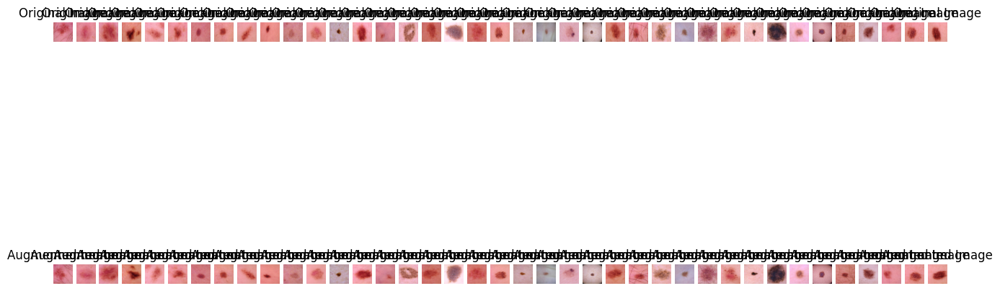

In [173]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1561.jpg',
    '/content/drive/MyDrive/Data/train/benign/1562.jpg',
    '/content/drive/MyDrive/Data/train/benign/1563.jpg',
    '/content/drive/MyDrive/Data/train/benign/1564.jpg',
    '/content/drive/MyDrive/Data/train/benign/1565.jpg',
    '/content/drive/MyDrive/Data/train/benign/1566.jpg',
    '/content/drive/MyDrive/Data/train/benign/1567.jpg',
    '/content/drive/MyDrive/Data/train/benign/1568.jpg',
    '/content/drive/MyDrive/Data/train/benign/1569.jpg',
    '/content/drive/MyDrive/Data/train/benign/157.jpg',
    '/content/drive/MyDrive/Data/train/benign/1570.jpg',
    '/content/drive/MyDrive/Data/train/benign/1571.jpg',
    '/content/drive/MyDrive/Data/train/benign/1572.jpg',
    '/content/drive/MyDrive/Data/train/benign/1573.jpg',
    '/content/drive/MyDrive/Data/train/benign/1574.jpg',
    '/content/drive/MyDrive/Data/train/benign/1575.jpg',
    '/content/drive/MyDrive/Data/train/benign/1577.jpg',
    '/content/drive/MyDrive/Data/train/benign/158.jpg',
    '/content/drive/MyDrive/Data/train/benign/1580.jpg',
    '/content/drive/MyDrive/Data/train/benign/1581.jpg',
    '/content/drive/MyDrive/Data/train/benign/1582.jpg',
    '/content/drive/MyDrive/Data/train/benign/1583.jpg',
    '/content/drive/MyDrive/Data/train/benign/1584.jpg',
    '/content/drive/MyDrive/Data/train/benign/1585.jpg',
    '/content/drive/MyDrive/Data/train/benign/1586.jpg',
    '/content/drive/MyDrive/Data/train/benign/1587.jpg',
    '/content/drive/MyDrive/Data/train/benign/1588.jpg',
    '/content/drive/MyDrive/Data/train/benign/1589.jpg',
    '/content/drive/MyDrive/Data/train/benign/159.jpg',
    '/content/drive/MyDrive/Data/train/benign/1590.jpg',
    '/content/drive/MyDrive/Data/train/benign/1591.jpg',
    '/content/drive/MyDrive/Data/train/benign/1593.jpg',
    '/content/drive/MyDrive/Data/train/benign/1594.jpg',
    '/content/drive/MyDrive/Data/train/benign/1595.jpg',
    '/content/drive/MyDrive/Data/train/benign/1596.jpg',
    '/content/drive/MyDrive/Data/train/benign/1597.jpg',
    '/content/drive/MyDrive/Data/train/benign/1598.jpg',
    '/content/drive/MyDrive/Data/train/benign/1599.jpg',
    '/content/drive/MyDrive/Data/train/benign/160.jpg',



                                                                                   # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



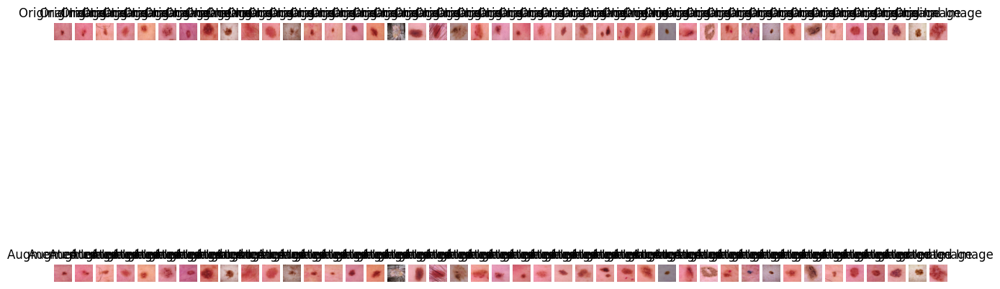

In [174]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1600.jpg',
    '/content/drive/MyDrive/Data/train/benign/1601.jpg',
    '/content/drive/MyDrive/Data/train/benign/1603.jpg',
    '/content/drive/MyDrive/Data/train/benign/1604.jpg',
    '/content/drive/MyDrive/Data/train/benign/1605.jpg',
    '/content/drive/MyDrive/Data/train/benign/1606.jpg',
    '/content/drive/MyDrive/Data/train/benign/1609.jpg',
    '/content/drive/MyDrive/Data/train/benign/1608.jpg',
    '/content/drive/MyDrive/Data/train/benign/1612.jpg',
    '/content/drive/MyDrive/Data/train/benign/1613.jpg',
    '/content/drive/MyDrive/Data/train/benign/1614.jpg',
    '/content/drive/MyDrive/Data/train/benign/1615.jpg',
    '/content/drive/MyDrive/Data/train/benign/1616.jpg',
    '/content/drive/MyDrive/Data/train/benign/1617.jpg',
    '/content/drive/MyDrive/Data/train/benign/1618.jpg',
    '/content/drive/MyDrive/Data/train/benign/1619.jpg',
    '/content/drive/MyDrive/Data/train/benign/162.jpg',
    '/content/drive/MyDrive/Data/train/benign/1620.jpg',
    '/content/drive/MyDrive/Data/train/benign/1621.jpg',
    '/content/drive/MyDrive/Data/train/benign/1622.jpg',
    '/content/drive/MyDrive/Data/train/benign/1623.jpg',
    '/content/drive/MyDrive/Data/train/benign/1624.jpg',
    '/content/drive/MyDrive/Data/train/benign/1625.jpg',
    '/content/drive/MyDrive/Data/train/benign/1626.jpg',
    '/content/drive/MyDrive/Data/train/benign/1627.jpg',
    '/content/drive/MyDrive/Data/train/benign/163.jpg',
    '/content/drive/MyDrive/Data/train/benign/1629.jpg',
    '/content/drive/MyDrive/Data/train/benign/1630.jpg',
    '/content/drive/MyDrive/Data/train/benign/1631.jpg',
    '/content/drive/MyDrive/Data/train/benign/1635.jpg',
    '/content/drive/MyDrive/Data/train/benign/1636.jpg',
    '/content/drive/MyDrive/Data/train/benign/1639.jpg',
    '/content/drive/MyDrive/Data/train/benign/1638.jpg',
    '/content/drive/MyDrive/Data/train/benign/164.jpg',
    '/content/drive/MyDrive/Data/train/benign/1640.jpg',
    '/content/drive/MyDrive/Data/train/benign/1641.jpg',
    '/content/drive/MyDrive/Data/train/benign/1644.jpg',
    '/content/drive/MyDrive/Data/train/benign/1643.jpg',
    '/content/drive/MyDrive/Data/train/benign/1645.jpg',
    '/content/drive/MyDrive/Data/train/benign/1647.jpg',
    '/content/drive/MyDrive/Data/train/benign/165.jpg',
    '/content/drive/MyDrive/Data/train/benign/1649.jpg',
    '/content/drive/MyDrive/Data/train/benign/1650.jpg',



    # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



In [175]:
from sklearn.metrics import accuracy_score

# Assuming y_true contains the actual values and y_pred contains the predicted values
accuracy = accuracy_score(y_true, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8


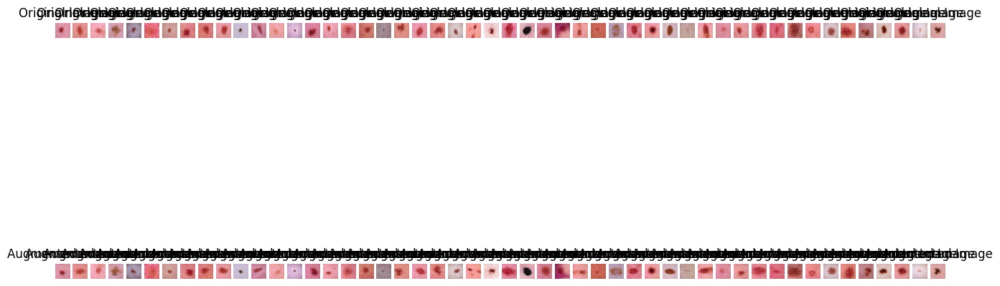

In [176]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1651.jpg',
    '/content/drive/MyDrive/Data/train/benign/1652.jpg',
    '/content/drive/MyDrive/Data/train/benign/1653.jpg',
    '/content/drive/MyDrive/Data/train/benign/1654.jpg',
    '/content/drive/MyDrive/Data/train/benign/1656.jpg',
    '/content/drive/MyDrive/Data/train/benign/1658.jpg',
    '/content/drive/MyDrive/Data/train/benign/1659.jpg',
    '/content/drive/MyDrive/Data/train/benign/166.jpg',
    '/content/drive/MyDrive/Data/train/benign/1660.jpg',
    '/content/drive/MyDrive/Data/train/benign/1661.jpg',
    '/content/drive/MyDrive/Data/train/benign/1662.jpg',
    '/content/drive/MyDrive/Data/train/benign/1663.jpg',
    '/content/drive/MyDrive/Data/train/benign/1664.jpg',
    '/content/drive/MyDrive/Data/train/benign/1665.jpg',
    '/content/drive/MyDrive/Data/train/benign/1666.jpg',
    '/content/drive/MyDrive/Data/train/benign/1667.jpg',
    '/content/drive/MyDrive/Data/train/benign/1668.jpg',
    '/content/drive/MyDrive/Data/train/benign/1669.jpg',
    '/content/drive/MyDrive/Data/train/benign/167.jpg',
    '/content/drive/MyDrive/Data/train/benign/1670.jpg',
    '/content/drive/MyDrive/Data/train/benign/1671.jpg',
    '/content/drive/MyDrive/Data/train/benign/1673.jpg',
    '/content/drive/MyDrive/Data/train/benign/1674.jpg',
    '/content/drive/MyDrive/Data/train/benign/1675.jpg',
    '/content/drive/MyDrive/Data/train/benign/1676.jpg',
    '/content/drive/MyDrive/Data/train/benign/1677.jpg',
    '/content/drive/MyDrive/Data/train/benign/1678.jpg',
    '/content/drive/MyDrive/Data/train/benign/1679.jpg',
    '/content/drive/MyDrive/Data/train/benign/168.jpg',
    '/content/drive/MyDrive/Data/train/benign/1680.jpg',
    '/content/drive/MyDrive/Data/train/benign/1681.jpg',
    '/content/drive/MyDrive/Data/train/benign/1683.jpg',
    '/content/drive/MyDrive/Data/train/benign/1684.jpg',
    '/content/drive/MyDrive/Data/train/benign/1685.jpg',
    '/content/drive/MyDrive/Data/train/benign/1686.jpg',
    '/content/drive/MyDrive/Data/train/benign/1688.jpg',
    '/content/drive/MyDrive/Data/train/benign/1689.jpg',
    '/content/drive/MyDrive/Data/train/benign/169.jpg',
    '/content/drive/MyDrive/Data/train/benign/1690.jpg',
    '/content/drive/MyDrive/Data/train/benign/1691.jpg',
    '/content/drive/MyDrive/Data/train/benign/1692.jpg',
    '/content/drive/MyDrive/Data/train/benign/1693.jpg',
    '/content/drive/MyDrive/Data/train/benign/1694.jpg',
    '/content/drive/MyDrive/Data/train/benign/1695.jpg',
    '/content/drive/MyDrive/Data/train/benign/1697.jpg',
    '/content/drive/MyDrive/Data/train/benign/1698.jpg',
    '/content/drive/MyDrive/Data/train/benign/1699.jpg',
    '/content/drive/MyDrive/Data/train/benign/17.jpg',
    '/content/drive/MyDrive/Data/train/benign/170.jpg',
    '/content/drive/MyDrive/Data/train/benign/1700.jpg',



                   # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



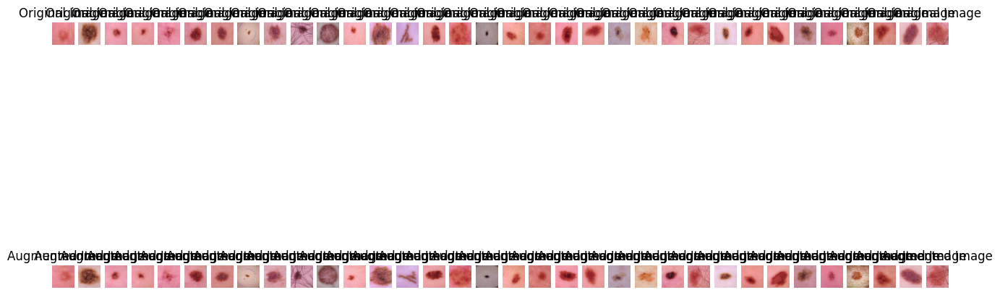

In [177]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1702.jpg',
    '/content/drive/MyDrive/Data/train/benign/1703.jpg',
    '/content/drive/MyDrive/Data/train/benign/1705.jpg',
    '/content/drive/MyDrive/Data/train/benign/1706.jpg',
    '/content/drive/MyDrive/Data/train/benign/1707.jpg',
    '/content/drive/MyDrive/Data/train/benign/1708.jpg',
    '/content/drive/MyDrive/Data/train/benign/1709.jpg',
    '/content/drive/MyDrive/Data/train/benign/171.jpg',
    '/content/drive/MyDrive/Data/train/benign/1712.jpg',
    '/content/drive/MyDrive/Data/train/benign/1713.jpg',
    '/content/drive/MyDrive/Data/train/benign/1715.jpg',
    '/content/drive/MyDrive/Data/train/benign/1716.jpg',
    '/content/drive/MyDrive/Data/train/benign/1717.jpg',
    '/content/drive/MyDrive/Data/train/benign/1718.jpg',
    '/content/drive/MyDrive/Data/train/benign/172.jpg',
    '/content/drive/MyDrive/Data/train/benign/1720.jpg',
    '/content/drive/MyDrive/Data/train/benign/1722.jpg',
    '/content/drive/MyDrive/Data/train/benign/1723.jpg',
    '/content/drive/MyDrive/Data/train/benign/1724.jpg',
    '/content/drive/MyDrive/Data/train/benign/1725.jpg',
    '/content/drive/MyDrive/Data/train/benign/1726.jpg',
    '/content/drive/MyDrive/Data/train/benign/1727.jpg',
    '/content/drive/MyDrive/Data/train/benign/1728.jpg',
    '/content/drive/MyDrive/Data/train/benign/1729.jpg',
    '/content/drive/MyDrive/Data/train/benign/173.jpg',
    '/content/drive/MyDrive/Data/train/benign/1730.jpg',
    '/content/drive/MyDrive/Data/train/benign/1732.jpg',
    '/content/drive/MyDrive/Data/train/benign/1733.jpg',
    '/content/drive/MyDrive/Data/train/benign/1734.jpg',
    '/content/drive/MyDrive/Data/train/benign/1735.jpg',
    '/content/drive/MyDrive/Data/train/benign/1736.jpg',
    '/content/drive/MyDrive/Data/train/benign/1738.jpg',
    '/content/drive/MyDrive/Data/train/benign/1739.jpg',
    '/content/drive/MyDrive/Data/train/benign/174.jpg',



                               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


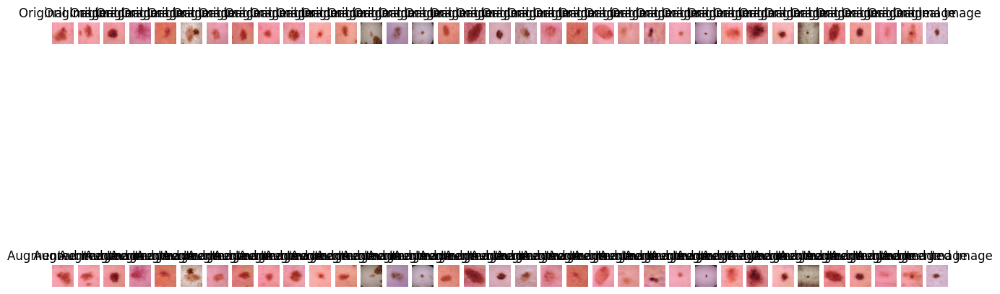

In [178]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1740.jpg',
    '/content/drive/MyDrive/Data/train/benign/1741.jpg',
    '/content/drive/MyDrive/Data/train/benign/1742.jpg',
    '/content/drive/MyDrive/Data/train/benign/1743.jpg',
    '/content/drive/MyDrive/Data/train/benign/1744.jpg',
    '/content/drive/MyDrive/Data/train/benign/1746.jpg',
    '/content/drive/MyDrive/Data/train/benign/1749.jpg',
    '/content/drive/MyDrive/Data/train/benign/175.jpg',
    '/content/drive/MyDrive/Data/train/benign/1750.jpg',
    '/content/drive/MyDrive/Data/train/benign/1751.jpg',
    '/content/drive/MyDrive/Data/train/benign/1752.jpg',
    '/content/drive/MyDrive/Data/train/benign/1753.jpg',
    '/content/drive/MyDrive/Data/train/benign/1754.jpg',
    '/content/drive/MyDrive/Data/train/benign/1755.jpg',
    '/content/drive/MyDrive/Data/train/benign/1759.jpg',
    '/content/drive/MyDrive/Data/train/benign/176.jpg',
    '/content/drive/MyDrive/Data/train/benign/1760.jpg',
    '/content/drive/MyDrive/Data/train/benign/1761.jpg',
    '/content/drive/MyDrive/Data/train/benign/1762.jpg',
    '/content/drive/MyDrive/Data/train/benign/1763.jpg',
    '/content/drive/MyDrive/Data/train/benign/1765.jpg',
    '/content/drive/MyDrive/Data/train/benign/1766.jpg',
    '/content/drive/MyDrive/Data/train/benign/1767.jpg',
    '/content/drive/MyDrive/Data/train/benign/1769.jpg',
    '/content/drive/MyDrive/Data/train/benign/177.jpg',
    '/content/drive/MyDrive/Data/train/benign/1770.jpg',
    '/content/drive/MyDrive/Data/train/benign/1771.jpg',
    '/content/drive/MyDrive/Data/train/benign/1772.jpg',
    '/content/drive/MyDrive/Data/train/benign/1774.jpg',
    '/content/drive/MyDrive/Data/train/benign/1775.jpg',
    '/content/drive/MyDrive/Data/train/benign/1776.jpg',
    '/content/drive/MyDrive/Data/train/benign/1777.jpg',
    '/content/drive/MyDrive/Data/train/benign/1778.jpg',
    '/content/drive/MyDrive/Data/train/benign/1779.jpg',
    '/content/drive/MyDrive/Data/train/benign/178.jpg' ,


               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


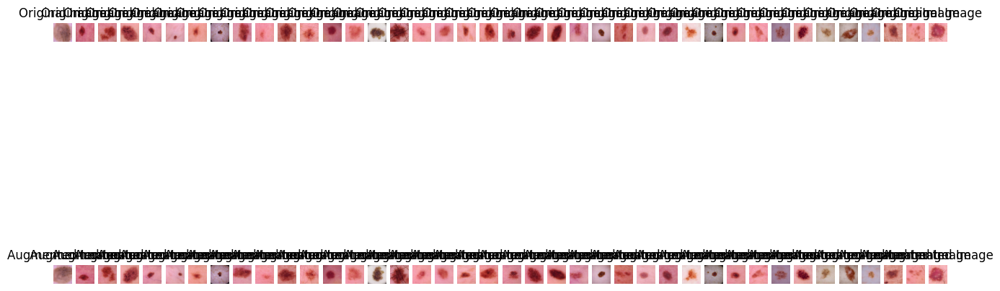

In [179]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/1780.jpg',
    '/content/drive/MyDrive/Data/train/benign/1781.jpg',
    '/content/drive/MyDrive/Data/train/benign/1782.jpg',
    '/content/drive/MyDrive/Data/train/benign/1783.jpg',
    '/content/drive/MyDrive/Data/train/benign/1784.jpg',
    '/content/drive/MyDrive/Data/train/benign/1785.jpg',
    '/content/drive/MyDrive/Data/train/benign/1786.jpg',
    '/content/drive/MyDrive/Data/train/benign/1787.jpg',
    '/content/drive/MyDrive/Data/train/benign/1788.jpg',
    '/content/drive/MyDrive/Data/train/benign/1789.jpg',
    '/content/drive/MyDrive/Data/train/benign/179.jpg',
    '/content/drive/MyDrive/Data/train/benign/1790.jpg',
    '/content/drive/MyDrive/Data/train/benign/1791.jpg',
    '/content/drive/MyDrive/Data/train/benign/1792.jpg',
    '/content/drive/MyDrive/Data/train/benign/1793.jpg',
    '/content/drive/MyDrive/Data/train/benign/1794.jpg',
    '/content/drive/MyDrive/Data/train/benign/1795.jpg',
    '/content/drive/MyDrive/Data/train/benign/1796.jpg',
    '/content/drive/MyDrive/Data/train/benign/1799.jpg',
    '/content/drive/MyDrive/Data/train/benign/180.jpg',
    '/content/drive/MyDrive/Data/train/benign/181.jpg',
    '/content/drive/MyDrive/Data/train/benign/182.jpg',
    '/content/drive/MyDrive/Data/train/benign/183.jpg',
    '/content/drive/MyDrive/Data/train/benign/184.jpg',
    '/content/drive/MyDrive/Data/train/benign/187.jpg',
    '/content/drive/MyDrive/Data/train/benign/188.jpg',
    '/content/drive/MyDrive/Data/train/benign/189.jpg',
    '/content/drive/MyDrive/Data/train/benign/19.jpg',
    '/content/drive/MyDrive/Data/train/benign/190.jpg',
    '/content/drive/MyDrive/Data/train/benign/191.jpg',
    '/content/drive/MyDrive/Data/train/benign/192.jpg',
    '/content/drive/MyDrive/Data/train/benign/193.jpg',
    '/content/drive/MyDrive/Data/train/benign/194.jpg',
    '/content/drive/MyDrive/Data/train/benign/195.jpg',
    '/content/drive/MyDrive/Data/train/benign/196.jpg',
    '/content/drive/MyDrive/Data/train/benign/197.jpg',
    '/content/drive/MyDrive/Data/train/benign/198.jpg',
    '/content/drive/MyDrive/Data/train/benign/199.jpg',
    '/content/drive/MyDrive/Data/train/benign/20.jpg',
    '/content/drive/MyDrive/Data/train/benign/200.jpg',


                              # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


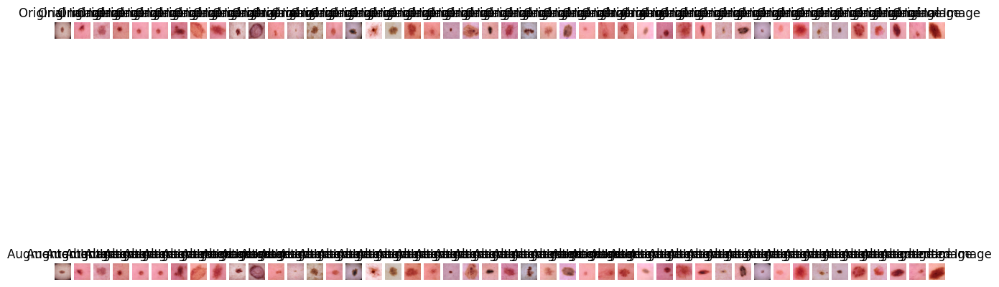

In [180]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/201.jpg',
    '/content/drive/MyDrive/Data/train/benign/202.jpg',
    '/content/drive/MyDrive/Data/train/benign/203.jpg',
    '/content/drive/MyDrive/Data/train/benign/204.jpg',
    '/content/drive/MyDrive/Data/train/benign/207.jpg',
    '/content/drive/MyDrive/Data/train/benign/207.jpg',
    '/content/drive/MyDrive/Data/train/benign/208.jpg',
    '/content/drive/MyDrive/Data/train/benign/209.jpg',
    '/content/drive/MyDrive/Data/train/benign/21.jpg',
    '/content/drive/MyDrive/Data/train/benign/210.jpg',
    '/content/drive/MyDrive/Data/train/benign/212.jpg',
    '/content/drive/MyDrive/Data/train/benign/213.jpg',
    '/content/drive/MyDrive/Data/train/benign/214.jpg',
    '/content/drive/MyDrive/Data/train/benign/217.jpg',
    '/content/drive/MyDrive/Data/train/benign/218.jpg',
    '/content/drive/MyDrive/Data/train/benign/219.jpg',
    '/content/drive/MyDrive/Data/train/benign/22.jpg',
    '/content/drive/MyDrive/Data/train/benign/220.jpg',
    '/content/drive/MyDrive/Data/train/benign/221.jpg',
    '/content/drive/MyDrive/Data/train/benign/222.jpg',
    '/content/drive/MyDrive/Data/train/benign/223.jpg',
    '/content/drive/MyDrive/Data/train/benign/225.jpg',
    '/content/drive/MyDrive/Data/train/benign/227.jpg',
    '/content/drive/MyDrive/Data/train/benign/228.jpg',
    '/content/drive/MyDrive/Data/train/benign/229.jpg',
    '/content/drive/MyDrive/Data/train/benign/23.jpg',
    '/content/drive/MyDrive/Data/train/benign/230.jpg',
    '/content/drive/MyDrive/Data/train/benign/231.jpg',
    '/content/drive/MyDrive/Data/train/benign/232.jpg',
    '/content/drive/MyDrive/Data/train/benign/233.jpg',
    '/content/drive/MyDrive/Data/train/benign/234.jpg',
    '/content/drive/MyDrive/Data/train/benign/235.jpg',
    '/content/drive/MyDrive/Data/train/benign/236.jpg',
    '/content/drive/MyDrive/Data/train/benign/238.jpg',
    '/content/drive/MyDrive/Data/train/benign/239.jpg',
    '/content/drive/MyDrive/Data/train/benign/24.jpg',
    '/content/drive/MyDrive/Data/train/benign/240.jpg',
    '/content/drive/MyDrive/Data/train/benign/241.jpg',
    '/content/drive/MyDrive/Data/train/benign/242.jpg',
    '/content/drive/MyDrive/Data/train/benign/243.jpg',
    '/content/drive/MyDrive/Data/train/benign/244.jpg',
    '/content/drive/MyDrive/Data/train/benign/246.jpg',
    '/content/drive/MyDrive/Data/train/benign/247.jpg',
    '/content/drive/MyDrive/Data/train/benign/248.jpg',
    '/content/drive/MyDrive/Data/train/benign/249.jpg',
    '/content/drive/MyDrive/Data/train/benign/25.jpg',


               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)


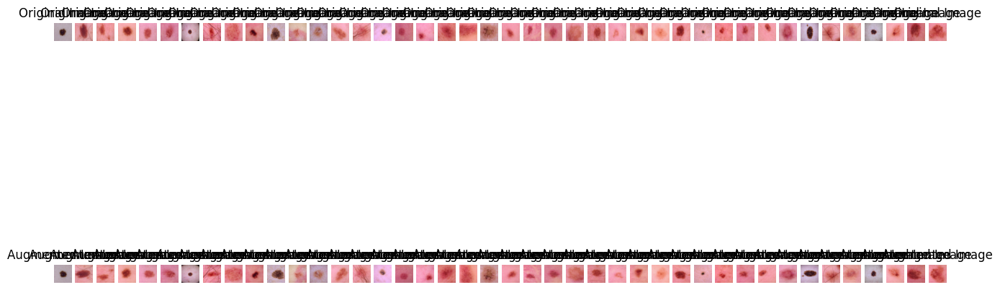

In [181]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/252.jpg',
    '/content/drive/MyDrive/Data/train/benign/254.jpg',
    '/content/drive/MyDrive/Data/train/benign/255.jpg',
    '/content/drive/MyDrive/Data/train/benign/257.jpg',
    '/content/drive/MyDrive/Data/train/benign/258.jpg',
    '/content/drive/MyDrive/Data/train/benign/26.jpg',
    '/content/drive/MyDrive/Data/train/benign/260.jpg',
    '/content/drive/MyDrive/Data/train/benign/261.jpg',
    '/content/drive/MyDrive/Data/train/benign/262.jpg',
    '/content/drive/MyDrive/Data/train/benign/263.jpg',
    '/content/drive/MyDrive/Data/train/benign/264.jpg',
    '/content/drive/MyDrive/Data/train/benign/265.jpg',
    '/content/drive/MyDrive/Data/train/benign/266.jpg',
    '/content/drive/MyDrive/Data/train/benign/269.jpg',
    '/content/drive/MyDrive/Data/train/benign/27.jpg',
    '/content/drive/MyDrive/Data/train/benign/270.jpg',
    '/content/drive/MyDrive/Data/train/benign/271.jpg',
    '/content/drive/MyDrive/Data/train/benign/272.jpg',
    '/content/drive/MyDrive/Data/train/benign/274.jpg',
    '/content/drive/MyDrive/Data/train/benign/275.jpg',
    '/content/drive/MyDrive/Data/train/benign/276.jpg',
    '/content/drive/MyDrive/Data/train/benign/277.jpg',
    '/content/drive/MyDrive/Data/train/benign/278.jpg',
    '/content/drive/MyDrive/Data/train/benign/279.jpg',
    '/content/drive/MyDrive/Data/train/benign/28.jpg',
    '/content/drive/MyDrive/Data/train/benign/280.jpg',
    '/content/drive/MyDrive/Data/train/benign/281.jpg',
    '/content/drive/MyDrive/Data/train/benign/282.jpg',
    '/content/drive/MyDrive/Data/train/benign/283.jpg',
    '/content/drive/MyDrive/Data/train/benign/285.jpg',
    '/content/drive/MyDrive/Data/train/benign/286.jpg',
    '/content/drive/MyDrive/Data/train/benign/288.jpg',
    '/content/drive/MyDrive/Data/train/benign/29.jpg',
    '/content/drive/MyDrive/Data/train/benign/290.jpg',
    '/content/drive/MyDrive/Data/train/benign/292.jpg',
    '/content/drive/MyDrive/Data/train/benign/293.jpg',
    '/content/drive/MyDrive/Data/train/benign/294.jpg',
    '/content/drive/MyDrive/Data/train/benign/295.jpg',
    '/content/drive/MyDrive/Data/train/benign/296.jpg',
    '/content/drive/MyDrive/Data/train/benign/297.jpg',
    '/content/drive/MyDrive/Data/train/benign/298.jpg',
    '/content/drive/MyDrive/Data/train/benign/299.jpg',



               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



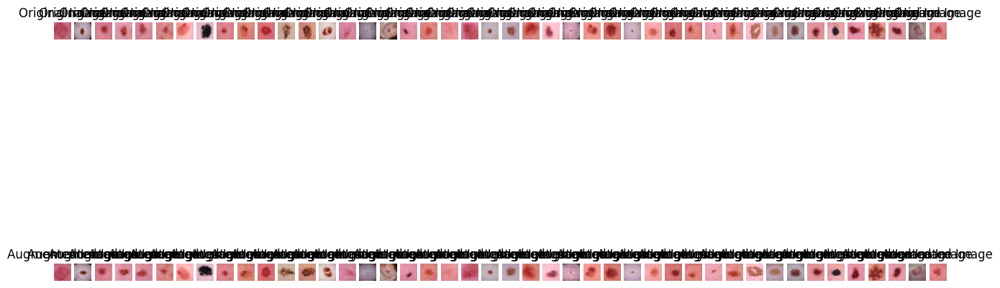

In [182]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/3.jpg',
    '/content/drive/MyDrive/Data/train/benign/30.jpg',
    '/content/drive/MyDrive/Data/train/benign/301.jpg',
    '/content/drive/MyDrive/Data/train/benign/302.jpg',
    '/content/drive/MyDrive/Data/train/benign/305.jpg',
    '/content/drive/MyDrive/Data/train/benign/306.jpg',
    '/content/drive/MyDrive/Data/train/benign/307.jpg',
    '/content/drive/MyDrive/Data/train/benign/308.jpg',
    '/content/drive/MyDrive/Data/train/benign/309.jpg',
    '/content/drive/MyDrive/Data/train/benign/310.jpg',
    '/content/drive/MyDrive/Data/train/benign/312.jpg',
    '/content/drive/MyDrive/Data/train/benign/314.jpg',
    '/content/drive/MyDrive/Data/train/benign/315.jpg',
    '/content/drive/MyDrive/Data/train/benign/316.jpg',
    '/content/drive/MyDrive/Data/train/benign/318.jpg',
    '/content/drive/MyDrive/Data/train/benign/319.jpg',
    '/content/drive/MyDrive/Data/train/benign/32.jpg',
    '/content/drive/MyDrive/Data/train/benign/320.jpg',
    '/content/drive/MyDrive/Data/train/benign/321.jpg',
    '/content/drive/MyDrive/Data/train/benign/324.jpg',
    '/content/drive/MyDrive/Data/train/benign/325.jpg',
    '/content/drive/MyDrive/Data/train/benign/326.jpg',
    '/content/drive/MyDrive/Data/train/benign/327.jpg',
    '/content/drive/MyDrive/Data/train/benign/328.jpg',
    '/content/drive/MyDrive/Data/train/benign/329.jpg',
    '/content/drive/MyDrive/Data/train/benign/33.jpg',
    '/content/drive/MyDrive/Data/train/benign/331.jpg',
    '/content/drive/MyDrive/Data/train/benign/333.jpg',
    '/content/drive/MyDrive/Data/train/benign/334.jpg',
    '/content/drive/MyDrive/Data/train/benign/336.jpg',
    '/content/drive/MyDrive/Data/train/benign/337.jpg',
    '/content/drive/MyDrive/Data/train/benign/338.jpg',
    '/content/drive/MyDrive/Data/train/benign/339.jpg',
    '/content/drive/MyDrive/Data/train/benign/34.jpg',
    '/content/drive/MyDrive/Data/train/benign/340.jpg',
    '/content/drive/MyDrive/Data/train/benign/341.jpg',
    '/content/drive/MyDrive/Data/train/benign/342.jpg',
    '/content/drive/MyDrive/Data/train/benign/343.jpg',
    '/content/drive/MyDrive/Data/train/benign/345.jpg',
    '/content/drive/MyDrive/Data/train/benign/346.jpg',
    '/content/drive/MyDrive/Data/train/benign/347.jpg',
    '/content/drive/MyDrive/Data/train/benign/349.jpg',
    '/content/drive/MyDrive/Data/train/benign/35.jpg',
    '/content/drive/MyDrive/Data/train/benign/350.jpg',



               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



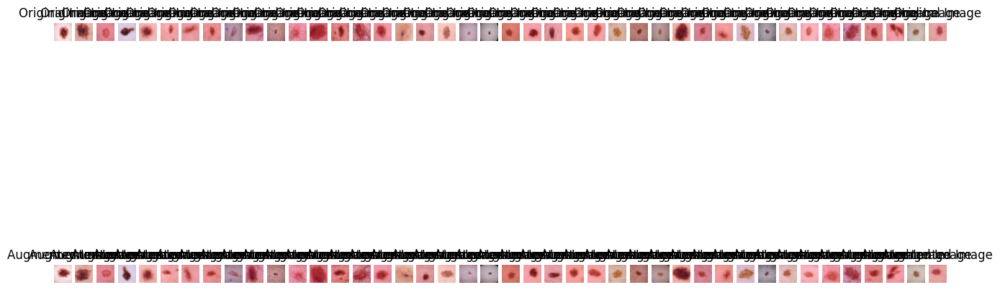

In [183]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/351.jpg',
    '/content/drive/MyDrive/Data/train/benign/352.jpg',
    '/content/drive/MyDrive/Data/train/benign/353.jpg',
    '/content/drive/MyDrive/Data/train/benign/355.jpg',
    '/content/drive/MyDrive/Data/train/benign/357.jpg',
    '/content/drive/MyDrive/Data/train/benign/358.jpg',
    '/content/drive/MyDrive/Data/train/benign/359.jpg',
    '/content/drive/MyDrive/Data/train/benign/36.jpg',
    '/content/drive/MyDrive/Data/train/benign/360.jpg',
    '/content/drive/MyDrive/Data/train/benign/361.jpg',
    '/content/drive/MyDrive/Data/train/benign/362.jpg',
    '/content/drive/MyDrive/Data/train/benign/363.jpg',
    '/content/drive/MyDrive/Data/train/benign/364.jpg',
    '/content/drive/MyDrive/Data/train/benign/365.jpg',
    '/content/drive/MyDrive/Data/train/benign/366.jpg',
    '/content/drive/MyDrive/Data/train/benign/368.jpg',
    '/content/drive/MyDrive/Data/train/benign/370.jpg',
    '/content/drive/MyDrive/Data/train/benign/371.jpg',
    '/content/drive/MyDrive/Data/train/benign/372.jpg',
    '/content/drive/MyDrive/Data/train/benign/373.jpg',
    '/content/drive/MyDrive/Data/train/benign/374.jpg',
    '/content/drive/MyDrive/Data/train/benign/375.jpg',
    '/content/drive/MyDrive/Data/train/benign/376.jpg',
    '/content/drive/MyDrive/Data/train/benign/377.jpg',
    '/content/drive/MyDrive/Data/train/benign/38.jpg',
    '/content/drive/MyDrive/Data/train/benign/380.jpg',
    '/content/drive/MyDrive/Data/train/benign/381.jpg',
    '/content/drive/MyDrive/Data/train/benign/382.jpg',
    '/content/drive/MyDrive/Data/train/benign/383.jpg',
    '/content/drive/MyDrive/Data/train/benign/384.jpg',
    '/content/drive/MyDrive/Data/train/benign/386.jpg',
    '/content/drive/MyDrive/Data/train/benign/387.jpg',
    '/content/drive/MyDrive/Data/train/benign/39.jpg',
    '/content/drive/MyDrive/Data/train/benign/390.jpg',
    '/content/drive/MyDrive/Data/train/benign/391.jpg',
    '/content/drive/MyDrive/Data/train/benign/392.jpg',
    '/content/drive/MyDrive/Data/train/benign/393.jpg',
    '/content/drive/MyDrive/Data/train/benign/395.jpg',
    '/content/drive/MyDrive/Data/train/benign/396.jpg',
    '/content/drive/MyDrive/Data/train/benign/397.jpg',
    '/content/drive/MyDrive/Data/train/benign/398.jpg',
    '/content/drive/MyDrive/Data/train/benign/399.jpg',


                #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



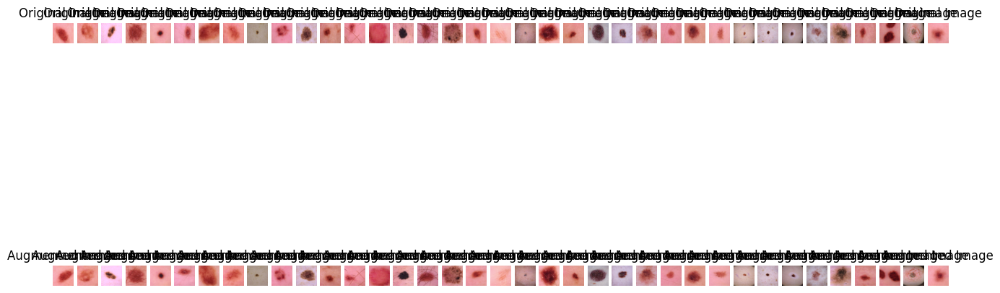

In [184]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/4.jpg',
    '/content/drive/MyDrive/Data/train/benign/40.jpg',
    '/content/drive/MyDrive/Data/train/benign/400.jpg',
    '/content/drive/MyDrive/Data/train/benign/401.jpg',
    '/content/drive/MyDrive/Data/train/benign/402.jpg',
    '/content/drive/MyDrive/Data/train/benign/403.jpg',
    '/content/drive/MyDrive/Data/train/benign/405.jpg',
    '/content/drive/MyDrive/Data/train/benign/406.jpg',
    '/content/drive/MyDrive/Data/train/benign/408.jpg',
    '/content/drive/MyDrive/Data/train/benign/409.jpg',
    '/content/drive/MyDrive/Data/train/benign/41.jpg',
    '/content/drive/MyDrive/Data/train/benign/410.jpg',
    '/content/drive/MyDrive/Data/train/benign/411.jpg',
    '/content/drive/MyDrive/Data/train/benign/412.jpg',
    '/content/drive/MyDrive/Data/train/benign/413.jpg',
    '/content/drive/MyDrive/Data/train/benign/415.jpg',
    '/content/drive/MyDrive/Data/train/benign/416.jpg',
    '/content/drive/MyDrive/Data/train/benign/417.jpg',
    '/content/drive/MyDrive/Data/train/benign/418.jpg',
    '/content/drive/MyDrive/Data/train/benign/42.jpg',
    '/content/drive/MyDrive/Data/train/benign/420.jpg',
    '/content/drive/MyDrive/Data/train/benign/421.jpg',
    '/content/drive/MyDrive/Data/train/benign/422.jpg',
    '/content/drive/MyDrive/Data/train/benign/423.jpg',
    '/content/drive/MyDrive/Data/train/benign/424.jpg',
    '/content/drive/MyDrive/Data/train/benign/425.jpg',
    '/content/drive/MyDrive/Data/train/benign/426.jpg',
    '/content/drive/MyDrive/Data/train/benign/429.jpg',
    '/content/drive/MyDrive/Data/train/benign/43.jpg',
    '/content/drive/MyDrive/Data/train/benign/430.jpg',
    '/content/drive/MyDrive/Data/train/benign/431.jpg',
    '/content/drive/MyDrive/Data/train/benign/432.jpg',
    '/content/drive/MyDrive/Data/train/benign/434.jpg',
    '/content/drive/MyDrive/Data/train/benign/435.jpg',
    '/content/drive/MyDrive/Data/train/benign/438.jpg',
    '/content/drive/MyDrive/Data/train/benign/439.jpg',
    '/content/drive/MyDrive/Data/train/benign/440.jpg',



               # Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



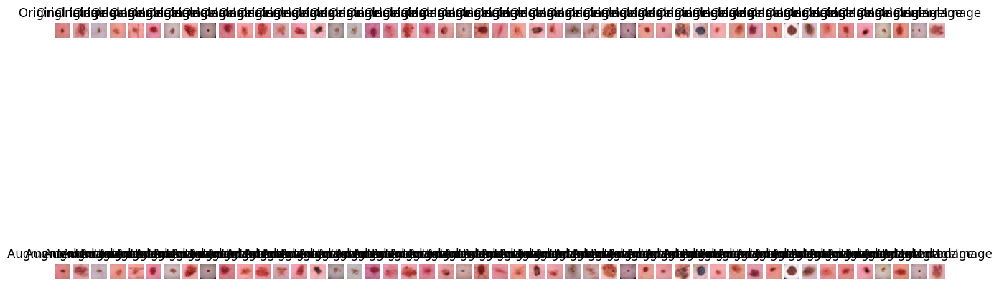

In [185]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/benign/441.jpg',
    '/content/drive/MyDrive/Data/train/benign/442.jpg',
    '/content/drive/MyDrive/Data/train/benign/443.jpg',
    '/content/drive/MyDrive/Data/train/benign/445.jpg',
    '/content/drive/MyDrive/Data/train/benign/446.jpg',
    '/content/drive/MyDrive/Data/train/benign/447.jpg',
    '/content/drive/MyDrive/Data/train/benign/448.jpg',
    '/content/drive/MyDrive/Data/train/benign/450.jpg',
    '/content/drive/MyDrive/Data/train/benign/451.jpg',
    '/content/drive/MyDrive/Data/train/benign/452.jpg',
    '/content/drive/MyDrive/Data/train/benign/453.jpg',
    '/content/drive/MyDrive/Data/train/benign/455.jpg',
    '/content/drive/MyDrive/Data/train/benign/456.jpg',
    '/content/drive/MyDrive/Data/train/benign/458.jpg',
    '/content/drive/MyDrive/Data/train/benign/459.jpg',
    '/content/drive/MyDrive/Data/train/benign/46.jpg',
    '/content/drive/MyDrive/Data/train/benign/460.jpg',
    '/content/drive/MyDrive/Data/train/benign/461.jpg',
    '/content/drive/MyDrive/Data/train/benign/463.jpg',
    '/content/drive/MyDrive/Data/train/benign/464.jpg',
    '/content/drive/MyDrive/Data/train/benign/465.jpg',
    '/content/drive/MyDrive/Data/train/benign/466.jpg',
    '/content/drive/MyDrive/Data/train/benign/467.jpg',
    '/content/drive/MyDrive/Data/train/benign/468.jpg',
    '/content/drive/MyDrive/Data/train/benign/469.jpg',
    '/content/drive/MyDrive/Data/train/benign/47.jpg',
    '/content/drive/MyDrive/Data/train/benign/470.jpg',
    '/content/drive/MyDrive/Data/train/benign/471.jpg',
    '/content/drive/MyDrive/Data/train/benign/472.jpg',
    '/content/drive/MyDrive/Data/train/benign/473.jpg',
    '/content/drive/MyDrive/Data/train/benign/474.jpg',
    '/content/drive/MyDrive/Data/train/benign/476.jpg',
    '/content/drive/MyDrive/Data/train/benign/477.jpg',
    '/content/drive/MyDrive/Data/train/benign/478.jpg',
    '/content/drive/MyDrive/Data/train/benign/48.jpg',
    '/content/drive/MyDrive/Data/train/benign/480.jpg',
    '/content/drive/MyDrive/Data/train/benign/481.jpg',
    '/content/drive/MyDrive/Data/train/benign/482.jpg',
    '/content/drive/MyDrive/Data/train/benign/483.jpg',
    '/content/drive/MyDrive/Data/train/benign/485.jpg',
    '/content/drive/MyDrive/Data/train/benign/486.jpg',
    '/content/drive/MyDrive/Data/train/benign/487.jpg',
    '/content/drive/MyDrive/Data/train/benign/488.jpg',
    '/content/drive/MyDrive/Data/train/benign/489.jpg',
    '/content/drive/MyDrive/Data/train/benign/49.jpg',
    '/content/drive/MyDrive/Data/train/benign/490.jpg',
    '/content/drive/MyDrive/Data/train/benign/491.jpg',
    '/content/drive/MyDrive/Data/train/benign/492.jpg',
    '/content/drive/MyDrive/Data/train/benign/493.jpg',



                #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train benign augmented_images '
plot_images_with_augmentation(image_paths, save_dir)



malignant


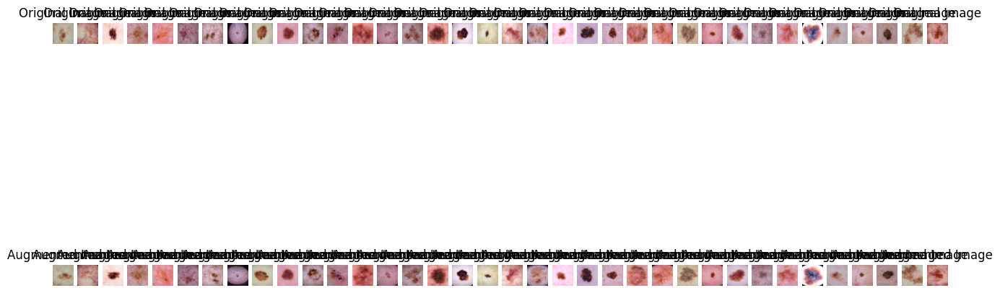

In [186]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/10.jpg',
    '/content/drive/MyDrive/Data/train/malignant/100.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1000.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1001.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1002.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1004.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1006.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1008.jpg',
    '/content/drive/MyDrive/Data/train/malignant/101.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1010.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1011.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1013.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1014.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1015.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1016.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1017.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1018.jpg',
    '/content/drive/MyDrive/Data/train/malignant/102.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1020.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1021.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1023.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1024.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1025.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1028.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1029.jpg',
    '/content/drive/MyDrive/Data/train/malignant/103.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1030.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1031.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1032.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1033.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1034.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1035.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1036.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1039.jpg',
    '/content/drive/MyDrive/Data/train/malignant/104.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1040.jpg',


                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




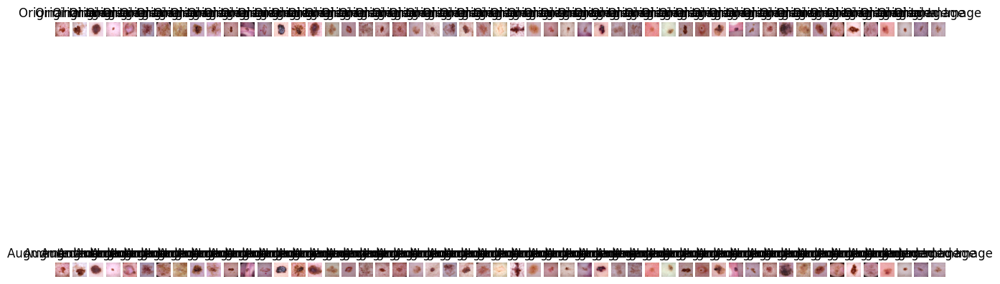

In [187]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1041.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1042.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1043.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1044.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1045.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1047.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1048.jpg',
    '/content/drive/MyDrive/Data/train/malignant/105.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1050.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1051.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1052.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1053.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1054.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1055.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1057.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1059.jpg',
    '/content/drive/MyDrive/Data/train/malignant/106.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1060.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1061.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1062.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1063.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1064.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1066.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1067.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1068.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1069.jpg',
    '/content/drive/MyDrive/Data/train/malignant/107.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1070.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1071.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1072.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1073.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1075.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1076.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1077.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1078.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1079.jpg',
    '/content/drive/MyDrive/Data/train/malignant/108.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1081.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1082.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1084.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1085.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1086.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1087.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1088.jpg',
    '/content/drive/MyDrive/Data/train/malignant/109.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1090.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1092.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1093.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1095.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1096.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1097.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1098.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1099.jpg',




                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




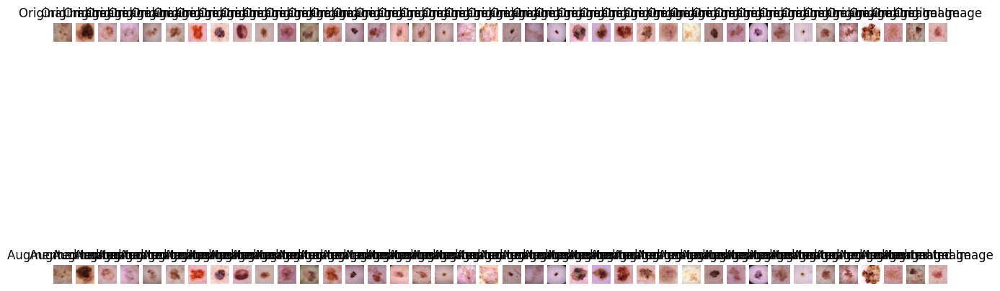

In [188]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/11.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1100.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1101.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1102.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1103.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1104.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1105.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1106.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1107.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1108.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1109.jpg',
    '/content/drive/MyDrive/Data/train/malignant/111.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1110.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1111.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1114.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1115.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1116.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1117.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1118.jpg',
    '/content/drive/MyDrive/Data/train/malignant/112.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1121.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1122.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1123.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1124.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1125.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1126.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1127.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1129.jpg',
    '/content/drive/MyDrive/Data/train/malignant/113.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1130.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1131.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1132.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1133.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1134.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1136.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1137.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1138.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1139.jpg',
    '/content/drive/MyDrive/Data/train/malignant/114.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1140.jpg',

                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




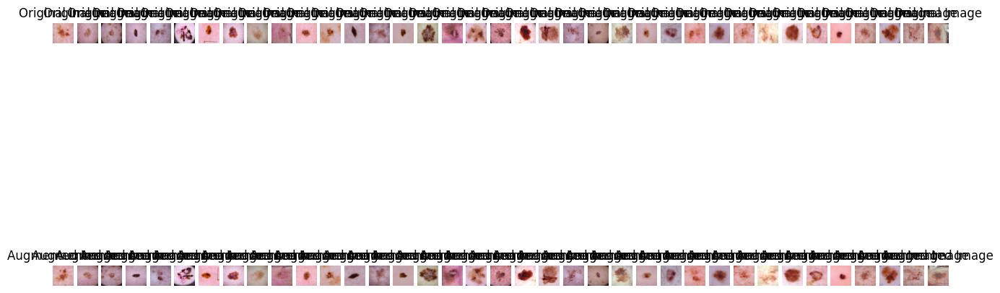

In [189]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1142.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1143.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1144.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1145.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1146.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1147.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1148.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1149.jpg',
    '/content/drive/MyDrive/Data/train/malignant/115.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1152.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1153.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1154.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1157.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1158.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1159.jpg',
    '/content/drive/MyDrive/Data/train/malignant/116.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1161.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1162.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1163.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1165.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1167.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1168.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1169.jpg',
    '/content/drive/MyDrive/Data/train/malignant/117.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1171.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1172.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1177.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1178.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1179.jpg',
    '/content/drive/MyDrive/Data/train/malignant/118.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1180.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1181.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1182.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1183.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1184.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1188.jpg',
    '/content/drive/MyDrive/Data/train/malignant/119.jpg',



                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




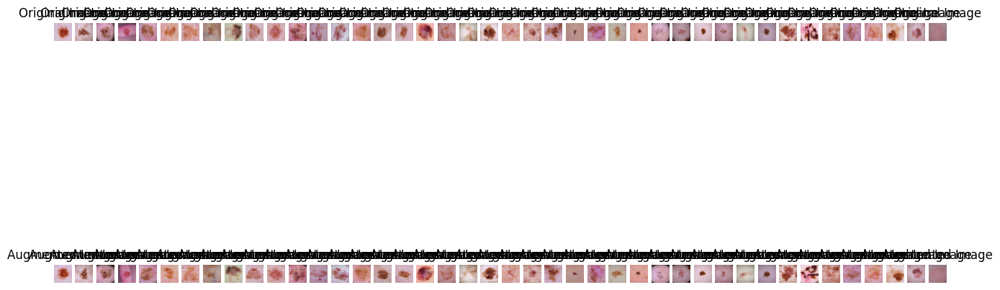

In [190]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1190.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1191.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1192.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1193.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1195.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1196.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1199.jpg',
    '/content/drive/MyDrive/Data/train/malignant/12.jpg',
    '/content/drive/MyDrive/Data/train/malignant/120.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1200.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1201.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1202.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1203.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1204.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1205.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1206.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1207.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1208.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1209.jpg',
    '/content/drive/MyDrive/Data/train/malignant/121.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1210.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1212.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1213.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1214.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1217.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1219.jpg',
    '/content/drive/MyDrive/Data/train/malignant/122.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1222.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1223.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1224.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1225.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1226.jpg',
    '/content/drive/MyDrive/Data/train/malignant/123.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1230.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1231.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1232.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1233.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1235.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1236.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1237.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1239.jpg',
    '/content/drive/MyDrive/Data/train/malignant/124.jpg',





                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




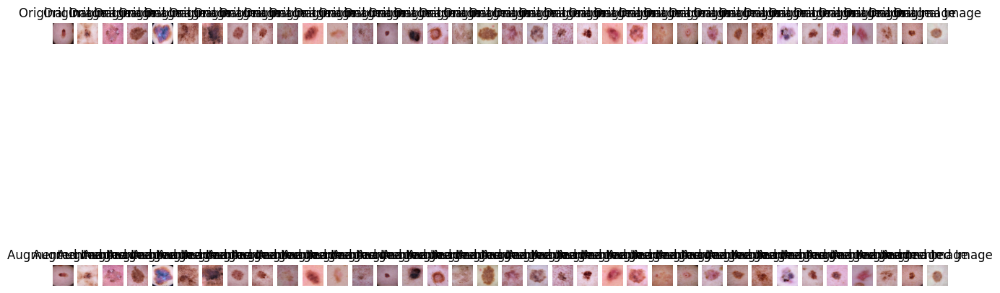

In [191]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1240.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1241.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1243.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1244.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1245.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1246.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1247.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1248.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1249.jpg',
    '/content/drive/MyDrive/Data/train/malignant/125.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1250.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1252.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1253.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1255.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1257.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1258.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1259.jpg',
    '/content/drive/MyDrive/Data/train/malignant/126.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1260.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1261.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1263.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1264.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1265.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1269.jpg',
    '/content/drive/MyDrive/Data/train/malignant/127.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1270.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1271.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1272.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1273.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1274.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1275.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1276.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1277.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1278.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1279.jpg',
    '/content/drive/MyDrive/Data/train/malignant/128.jpg',




                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




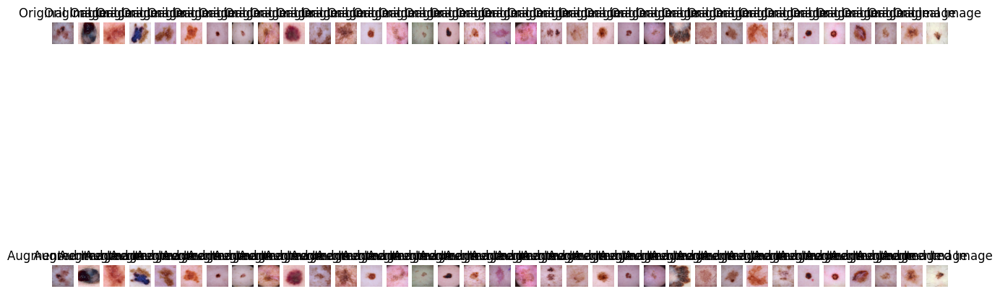

In [192]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1281.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1282.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1283.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1284.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1285.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1287.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1288.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1290.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1291.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1293.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1294.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1296.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1298.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1299.jpg',
    '/content/drive/MyDrive/Data/train/malignant/130.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1301.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1302.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1303.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1304.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1305.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1306.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1307.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1308.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1309.jpg',
    '/content/drive/MyDrive/Data/train/malignant/131.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1311.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1312.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1313.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1314.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1315.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1316.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1317.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1318.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1319.jpg',
    '/content/drive/MyDrive/Data/train/malignant/132.jpg',


                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




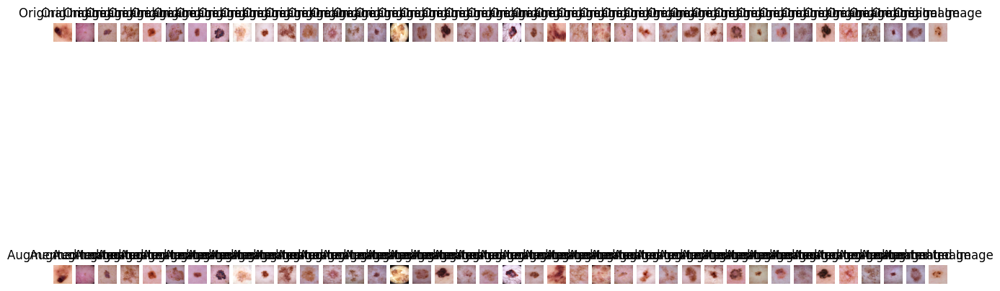

In [193]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1321.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1323.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1324.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1325.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1326.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1327.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1328.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1329.jpg',
    '/content/drive/MyDrive/Data/train/malignant/133.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1331.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1332.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1334.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1335.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1337.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1338.jpg',
    '/content/drive/MyDrive/Data/train/malignant/134.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1340.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1341.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1343.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1344.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1345.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1346.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1348.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1349.jpg',
    '/content/drive/MyDrive/Data/train/malignant/135.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1350.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1351.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1352.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1353.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1356.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1357.jpg',
    '/content/drive/MyDrive/Data/train/malignant/136.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1360.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1361.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1362.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1363.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1365.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1367.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1368.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1369.jpg',



                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




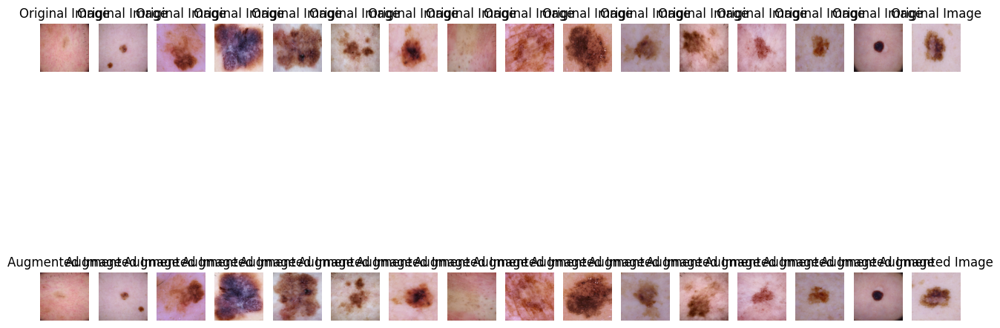

In [194]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/137.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1371.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1372.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1373.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1375.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1376.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1377.jpg',
    '/content/drive/MyDrive/Data/train/malignant/138.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1381.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1384.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1385.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1386.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1387.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1388.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1389.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1390.jpg',



                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




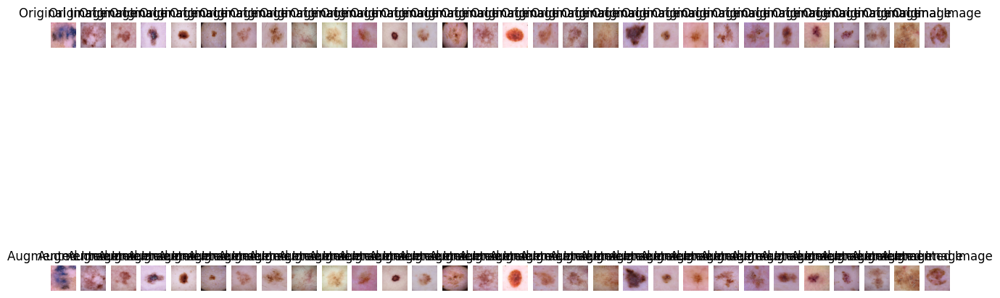

In [195]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1391.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1392.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1393.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1394.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1396.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1397.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1398.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1399.jpg',
    '/content/drive/MyDrive/Data/train/malignant/14.jpg',
    '/content/drive/MyDrive/Data/train/malignant/140.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1400.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1403.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1404.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1405.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1406.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1407.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1408.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1409.jpg',
    '/content/drive/MyDrive/Data/train/malignant/141.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1410.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1411.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1412.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1413.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1414.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1415.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1416.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1418.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1419.jpg',
    '/content/drive/MyDrive/Data/train/malignant/142.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1420.jpg',

                               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




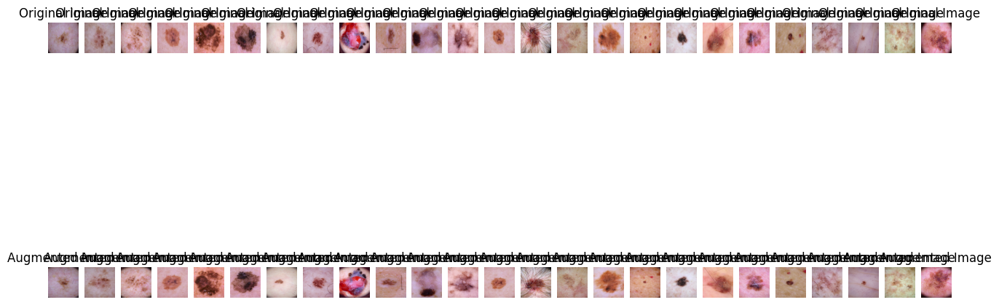

In [196]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1421.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1423.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1424.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1426.jpg',
   '/content/drive/MyDrive/Data/train/malignant/1428.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1429.jpg',
    '/content/drive/MyDrive/Data/train/malignant/143.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1431.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1432.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1433.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1434.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1435.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1437.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1439.jpg',
    '/content/drive/MyDrive/Data/train/malignant/144.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1440.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1441.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1442.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1444.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1445.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1446.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1448.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1449.jpg',
    '/content/drive/MyDrive/Data/train/malignant/145.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1450.jpg',

                #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




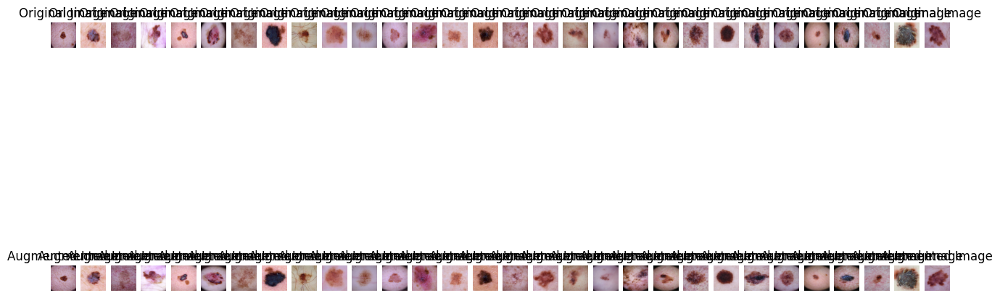

In [197]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1452.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1453.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1454.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1455.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1456.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1457.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1458.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1459.jpg',
    '/content/drive/MyDrive/Data/train/malignant/146.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1460.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1462.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1463.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1465.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1466.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1467.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1468.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1469.jpg',
    '/content/drive/MyDrive/Data/train/malignant/147.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1470.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1471.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1472.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1473.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1474.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1475.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1476.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1477.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1478.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1479.jpg',
    '/content/drive/MyDrive/Data/train/malignant/148.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1480.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




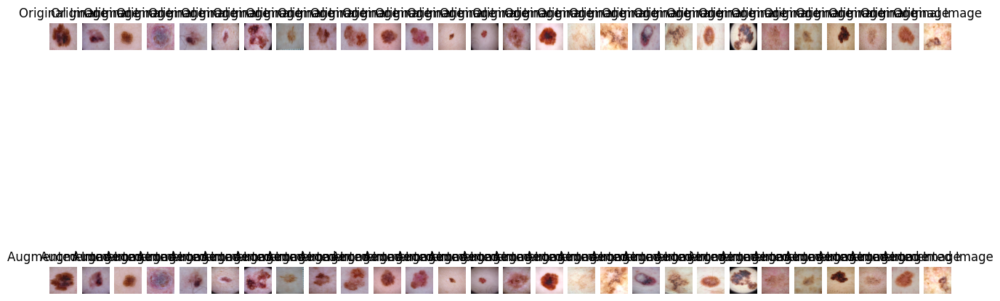

In [198]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/1481.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1482.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1483.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1485.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1486.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1487.jpg',
     '/content/drive/MyDrive/Data/train/malignant/1488.jpg',
    '/content/drive/MyDrive/Data/train/malignant/149.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1490.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1491.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1492.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1493.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1494.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1496.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1497.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1498.jpg',
    '/content/drive/MyDrive/Data/train/malignant/15.jpg',
    '/content/drive/MyDrive/Data/train/malignant/150.jpg',
    '/content/drive/MyDrive/Data/train/malignant/1500.jpg',
    '/content/drive/MyDrive/Data/train/malignant/151.jpg',
    '/content/drive/MyDrive/Data/train/malignant/152.jpg',
    '/content/drive/MyDrive/Data/train/malignant/153.jpg',
    '/content/drive/MyDrive/Data/train/malignant/154.jpg',
    '/content/drive/MyDrive/Data/train/malignant/155.jpg',
    '/content/drive/MyDrive/Data/train/malignant/157.jpg',
    '/content/drive/MyDrive/Data/train/malignant/158.jpg',
    '/content/drive/MyDrive/Data/train/malignant/159.jpg',
    '/content/drive/MyDrive/Data/train/malignant/16.jpg',




                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




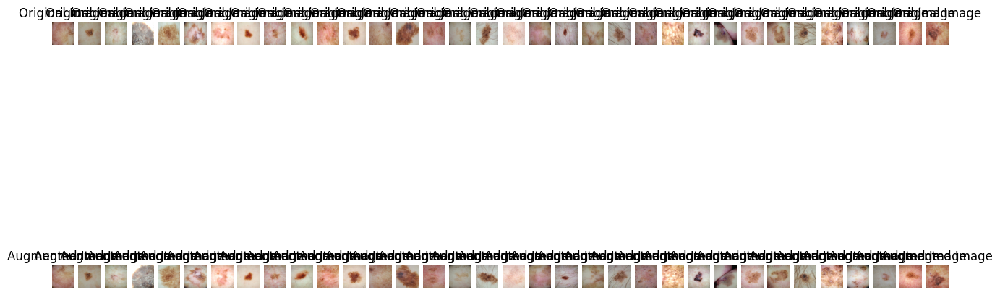

In [199]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/160.jpg',
    '/content/drive/MyDrive/Data/train/malignant/162.jpg',
    '/content/drive/MyDrive/Data/train/malignant/163.jpg',
    '/content/drive/MyDrive/Data/train/malignant/164.jpg',
    '/content/drive/MyDrive/Data/train/malignant/165.jpg',
    '/content/drive/MyDrive/Data/train/malignant/166.jpg',
    '/content/drive/MyDrive/Data/train/malignant/167.jpg',
    '/content/drive/MyDrive/Data/train/malignant/168.jpg',
    '/content/drive/MyDrive/Data/train/malignant/169.jpg',
    '/content/drive/MyDrive/Data/train/malignant/170.jpg',
    '/content/drive/MyDrive/Data/train/malignant/171.jpg',
    '/content/drive/MyDrive/Data/train/malignant/172.jpg',
    '/content/drive/MyDrive/Data/train/malignant/174.jpg',
    '/content/drive/MyDrive/Data/train/malignant/175.jpg',
    '/content/drive/MyDrive/Data/train/malignant/176.jpg',
    '/content/drive/MyDrive/Data/train/malignant/177.jpg',
    '/content/drive/MyDrive/Data/train/malignant/178.jpg',
    '/content/drive/MyDrive/Data/train/malignant/18.jpg',
    '/content/drive/MyDrive/Data/train/malignant/180.jpg',
    '/content/drive/MyDrive/Data/train/malignant/181.jpg',
    '/content/drive/MyDrive/Data/train/malignant/183.jpg',
    '/content/drive/MyDrive/Data/train/malignant/187.jpg',
    '/content/drive/MyDrive/Data/train/malignant/188.jpg',
    '/content/drive/MyDrive/Data/train/malignant/19.jpg',
    '/content/drive/MyDrive/Data/train/malignant/191.jpg',
    '/content/drive/MyDrive/Data/train/malignant/192.jpg',
    '/content/drive/MyDrive/Data/train/malignant/194.jpg',
    '/content/drive/MyDrive/Data/train/malignant/197.jpg',
    '/content/drive/MyDrive/Data/train/malignant/198.jpg',
    '/content/drive/MyDrive/Data/train/malignant/199.jpg',
    '/content/drive/MyDrive/Data/train/malignant/2.jpg',
    '/content/drive/MyDrive/Data/train/malignant/20.jpg',
    '/content/drive/MyDrive/Data/train/malignant/201.jpg',
    '/content/drive/MyDrive/Data/train/malignant/202.jpg',







    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




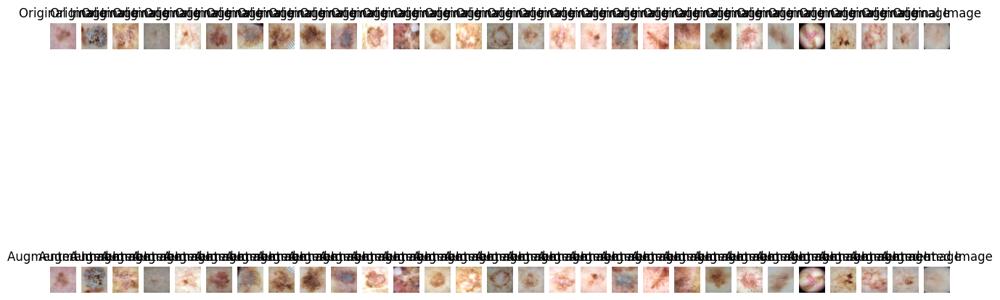

In [200]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/203.jpg',
    '/content/drive/MyDrive/Data/train/malignant/204.jpg',
    '/content/drive/MyDrive/Data/train/malignant/205.jpg',
    '/content/drive/MyDrive/Data/train/malignant/206.jpg',
    '/content/drive/MyDrive/Data/train/malignant/207.jpg',
    '/content/drive/MyDrive/Data/train/malignant/209.jpg',
    '/content/drive/MyDrive/Data/train/malignant/21.jpg',
    '/content/drive/MyDrive/Data/train/malignant/210.jpg',
    '/content/drive/MyDrive/Data/train/malignant/211.jpg',
    '/content/drive/MyDrive/Data/train/malignant/212.jpg',
    '/content/drive/MyDrive/Data/train/malignant/213.jpg',
    '/content/drive/MyDrive/Data/train/malignant/214.jpg',
    '/content/drive/MyDrive/Data/train/malignant/215.jpg',
    '/content/drive/MyDrive/Data/train/malignant/216.jpg',
    '/content/drive/MyDrive/Data/train/malignant/217.jpg',
    '/content/drive/MyDrive/Data/train/malignant/218.jpg',
    '/content/drive/MyDrive/Data/train/malignant/219.jpg',
    '/content/drive/MyDrive/Data/train/malignant/22.jpg',
    '/content/drive/MyDrive/Data/train/malignant/220.jpg',
    '/content/drive/MyDrive/Data/train/malignant/221.jpg',
    '/content/drive/MyDrive/Data/train/malignant/222.jpg',
    '/content/drive/MyDrive/Data/train/malignant/223.jpg',
    '/content/drive/MyDrive/Data/train/malignant/224.jpg',
    '/content/drive/MyDrive/Data/train/malignant/225.jpg',
    '/content/drive/MyDrive/Data/train/malignant/226.jpg',
    '/content/drive/MyDrive/Data/train/malignant/227.jpg',
    '/content/drive/MyDrive/Data/train/malignant/228.jpg',
    '/content/drive/MyDrive/Data/train/malignant/229.jpg',
    '/content/drive/MyDrive/Data/train/malignant/23.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




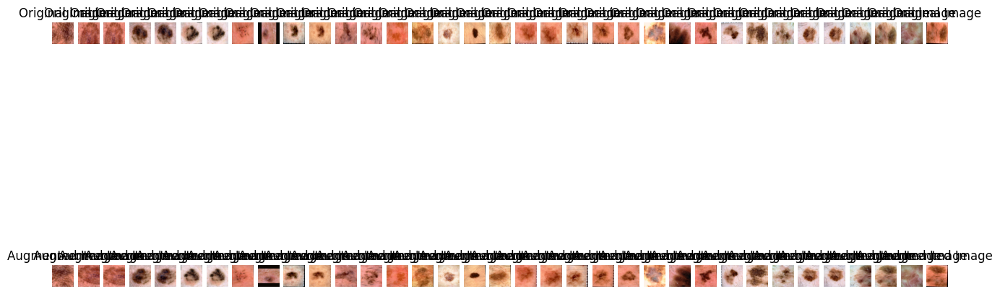

In [201]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/230.jpg',
    '/content/drive/MyDrive/Data/train/malignant/233.jpg',
    '/content/drive/MyDrive/Data/train/malignant/234.jpg',
    '/content/drive/MyDrive/Data/train/malignant/235.jpg',
    '/content/drive/MyDrive/Data/train/malignant/236.jpg',
    '/content/drive/MyDrive/Data/train/malignant/239.jpg',
    '/content/drive/MyDrive/Data/train/malignant/240.jpg',
    '/content/drive/MyDrive/Data/train/malignant/241.jpg',
    '/content/drive/MyDrive/Data/train/malignant/242.jpg',
    '/content/drive/MyDrive/Data/train/malignant/243.jpg',
    '/content/drive/MyDrive/Data/train/malignant/244.jpg',
    '/content/drive/MyDrive/Data/train/malignant/245.jpg',
    '/content/drive/MyDrive/Data/train/malignant/246.jpg',
    '/content/drive/MyDrive/Data/train/malignant/248.jpg',
    '/content/drive/MyDrive/Data/train/malignant/249.jpg',
    '/content/drive/MyDrive/Data/train/malignant/25.jpg',
    '/content/drive/MyDrive/Data/train/malignant/250.jpg',
    '/content/drive/MyDrive/Data/train/malignant/251.jpg',
    '/content/drive/MyDrive/Data/train/malignant/252.jpg',
    '/content/drive/MyDrive/Data/train/malignant/253.jpg',
    '/content/drive/MyDrive/Data/train/malignant/254.jpg',
    '/content/drive/MyDrive/Data/train/malignant/255.jpg',
    '/content/drive/MyDrive/Data/train/malignant/259.jpg',
    '/content/drive/MyDrive/Data/train/malignant/26.jpg',
    '/content/drive/MyDrive/Data/train/malignant/261.jpg',
    '/content/drive/MyDrive/Data/train/malignant/262.jpg',
    '/content/drive/MyDrive/Data/train/malignant/263.jpg',
    '/content/drive/MyDrive/Data/train/malignant/264.jpg',
    '/content/drive/MyDrive/Data/train/malignant/265.jpg',
    '/content/drive/MyDrive/Data/train/malignant/266.jpg',
    '/content/drive/MyDrive/Data/train/malignant/267.jpg',
    '/content/drive/MyDrive/Data/train/malignant/268.jpg',
    '/content/drive/MyDrive/Data/train/malignant/269.jpg',
    '/content/drive/MyDrive/Data/train/malignant/27.jpg',
    '/content/drive/MyDrive/Data/train/malignant/270.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




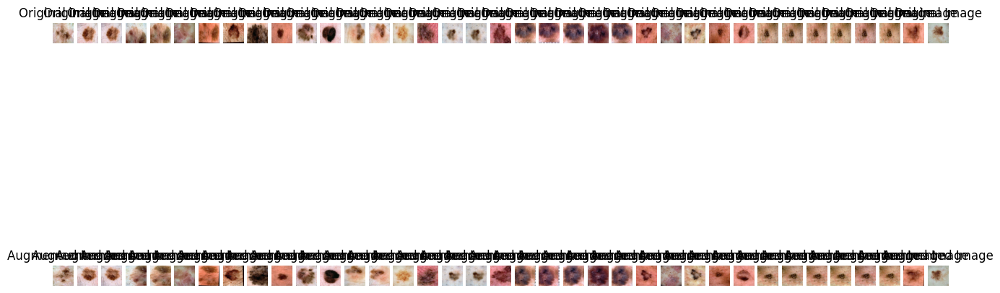

In [202]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/265.jpg',
    '/content/drive/MyDrive/Data/train/malignant/266.jpg',
    '/content/drive/MyDrive/Data/train/malignant/267.jpg',
    '/content/drive/MyDrive/Data/train/malignant/268.jpg',
    '/content/drive/MyDrive/Data/train/malignant/269.jpg',
    '/content/drive/MyDrive/Data/train/malignant/27.jpg',
    '/content/drive/MyDrive/Data/train/malignant/270.jpg',
    '/content/drive/MyDrive/Data/train/malignant/271.jpg',
    '/content/drive/MyDrive/Data/train/malignant/272.jpg',
    '/content/drive/MyDrive/Data/train/malignant/273.jpg',
    '/content/drive/MyDrive/Data/train/malignant/274.jpg',
    '/content/drive/MyDrive/Data/train/malignant/277.jpg',
    '/content/drive/MyDrive/Data/train/malignant/278.jpg',
    '/content/drive/MyDrive/Data/train/malignant/279.jpg',
    '/content/drive/MyDrive/Data/train/malignant/28.jpg',
    '/content/drive/MyDrive/Data/train/malignant/280.jpg',
    '/content/drive/MyDrive/Data/train/malignant/281.jpg',
    '/content/drive/MyDrive/Data/train/malignant/282.jpg',
    '/content/drive/MyDrive/Data/train/malignant/283.jpg',
    '/content/drive/MyDrive/Data/train/malignant/284.jpg',
    '/content/drive/MyDrive/Data/train/malignant/285.jpg',
    '/content/drive/MyDrive/Data/train/malignant/286.jpg',
    '/content/drive/MyDrive/Data/train/malignant/287.jpg',
    '/content/drive/MyDrive/Data/train/malignant/288.jpg',
    '/content/drive/MyDrive/Data/train/malignant/289.jpg',
    '/content/drive/MyDrive/Data/train/malignant/29.jpg',
    '/content/drive/MyDrive/Data/train/malignant/290.jpg',
    '/content/drive/MyDrive/Data/train/malignant/291.jpg',
    '/content/drive/MyDrive/Data/train/malignant/292.jpg',
    '/content/drive/MyDrive/Data/train/malignant/293.jpg',
    '/content/drive/MyDrive/Data/train/malignant/294.jpg',
    '/content/drive/MyDrive/Data/train/malignant/295.jpg',
    '/content/drive/MyDrive/Data/train/malignant/296.jpg',
    '/content/drive/MyDrive/Data/train/malignant/297.jpg',
    '/content/drive/MyDrive/Data/train/malignant/298.jpg',
    '/content/drive/MyDrive/Data/train/malignant/299.jpg',
    '/content/drive/MyDrive/Data/train/malignant/30.jpg',


                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




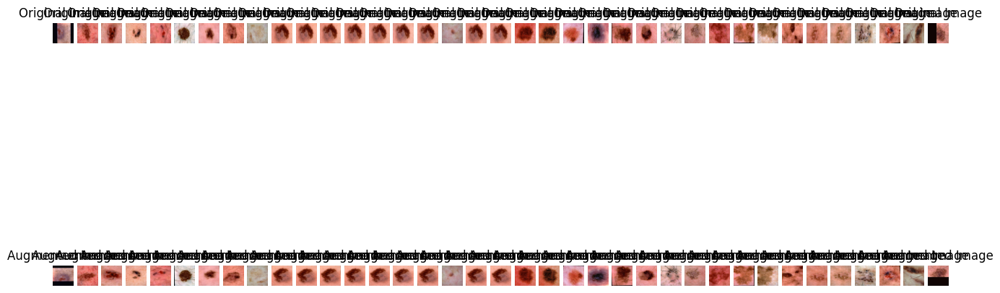

In [203]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/300.jpg',
    '/content/drive/MyDrive/Data/train/malignant/301.jpg',
    '/content/drive/MyDrive/Data/train/malignant/302.jpg',
    '/content/drive/MyDrive/Data/train/malignant/304.jpg',
    '/content/drive/MyDrive/Data/train/malignant/305.jpg',
    '/content/drive/MyDrive/Data/train/malignant/306.jpg',
    '/content/drive/MyDrive/Data/train/malignant/308.jpg',
    '/content/drive/MyDrive/Data/train/malignant/309.jpg',
    '/content/drive/MyDrive/Data/train/malignant/31.jpg',
    '/content/drive/MyDrive/Data/train/malignant/311.jpg',
    '/content/drive/MyDrive/Data/train/malignant/312.jpg',
    '/content/drive/MyDrive/Data/train/malignant/313.jpg',
    '/content/drive/MyDrive/Data/train/malignant/314.jpg',
    '/content/drive/MyDrive/Data/train/malignant/315.jpg',
    '/content/drive/MyDrive/Data/train/malignant/316.jpg',
    '/content/drive/MyDrive/Data/train/malignant/319.jpg',
    '/content/drive/MyDrive/Data/train/malignant/32.jpg',
    '/content/drive/MyDrive/Data/train/malignant/320.jpg',
    '/content/drive/MyDrive/Data/train/malignant/321.jpg',
    '/content/drive/MyDrive/Data/train/malignant/323.jpg',
    '/content/drive/MyDrive/Data/train/malignant/324.jpg',
    '/content/drive/MyDrive/Data/train/malignant/325.jpg',
    '/content/drive/MyDrive/Data/train/malignant/326.jpg',
    '/content/drive/MyDrive/Data/train/malignant/327.jpg',
    '/content/drive/MyDrive/Data/train/malignant/328.jpg',
    '/content/drive/MyDrive/Data/train/malignant/329.jpg',
    '/content/drive/MyDrive/Data/train/malignant/330.jpg',
    '/content/drive/MyDrive/Data/train/malignant/331.jpg',
    '/content/drive/MyDrive/Data/train/malignant/332.jpg',
    '/content/drive/MyDrive/Data/train/malignant/333.jpg',
    '/content/drive/MyDrive/Data/train/malignant/334.jpg',
    '/content/drive/MyDrive/Data/train/malignant/335.jpg',
    '/content/drive/MyDrive/Data/train/malignant/336.jpg',
    '/content/drive/MyDrive/Data/train/malignant/337.jpg',
    '/content/drive/MyDrive/Data/train/malignant/339.jpg',
    '/content/drive/MyDrive/Data/train/malignant/34.jpg',
    '/content/drive/MyDrive/Data/train/malignant/340.jpg',







                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




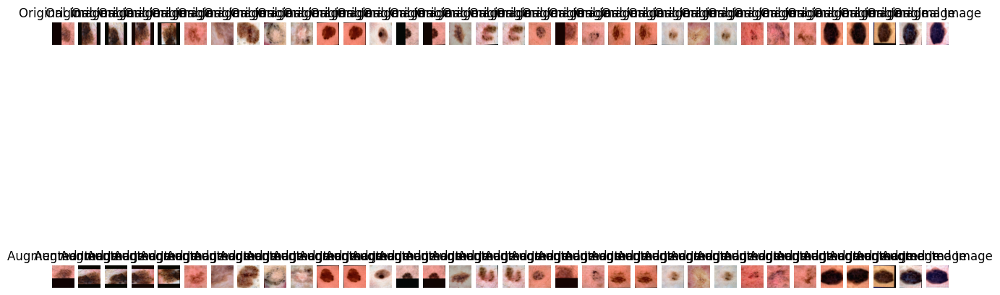

In [204]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/341.jpg',
    '/content/drive/MyDrive/Data/train/malignant/344.jpg',
    '/content/drive/MyDrive/Data/train/malignant/345.jpg',
    '/content/drive/MyDrive/Data/train/malignant/346.jpg',
    '/content/drive/MyDrive/Data/train/malignant/347.jpg',
    '/content/drive/MyDrive/Data/train/malignant/349.jpg',
    '/content/drive/MyDrive/Data/train/malignant/35.jpg',
    '/content/drive/MyDrive/Data/train/malignant/350.jpg',
    '/content/drive/MyDrive/Data/train/malignant/351.jpg',
    '/content/drive/MyDrive/Data/train/malignant/352.jpg',
    '/content/drive/MyDrive/Data/train/malignant/353.jpg',
    '/content/drive/MyDrive/Data/train/malignant/354.jpg',
    '/content/drive/MyDrive/Data/train/malignant/357.jpg',
    '/content/drive/MyDrive/Data/train/malignant/358.jpg',
    '/content/drive/MyDrive/Data/train/malignant/359.jpg',
    '/content/drive/MyDrive/Data/train/malignant/36.jpg',
    '/content/drive/MyDrive/Data/train/malignant/361.jpg',
    '/content/drive/MyDrive/Data/train/malignant/362.jpg',
    '/content/drive/MyDrive/Data/train/malignant/363.jpg',
    '/content/drive/MyDrive/Data/train/malignant/365.jpg',
    '/content/drive/MyDrive/Data/train/malignant/366.jpg',
    '/content/drive/MyDrive/Data/train/malignant/367.jpg',
    '/content/drive/MyDrive/Data/train/malignant/368.jpg',
    '/content/drive/MyDrive/Data/train/malignant/369.jpg',
    '/content/drive/MyDrive/Data/train/malignant/37.jpg',
    '/content/drive/MyDrive/Data/train/malignant/370.jpg',
    '/content/drive/MyDrive/Data/train/malignant/371.jpg',
    '/content/drive/MyDrive/Data/train/malignant/372.jpg',
    '/content/drive/MyDrive/Data/train/malignant/373.jpg',
    '/content/drive/MyDrive/Data/train/malignant/374.jpg',
    '/content/drive/MyDrive/Data/train/malignant/376.jpg',
    '/content/drive/MyDrive/Data/train/malignant/377.jpg',
    '/content/drive/MyDrive/Data/train/malignant/378.jpg',
    '/content/drive/MyDrive/Data/train/malignant/379.jpg',



                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




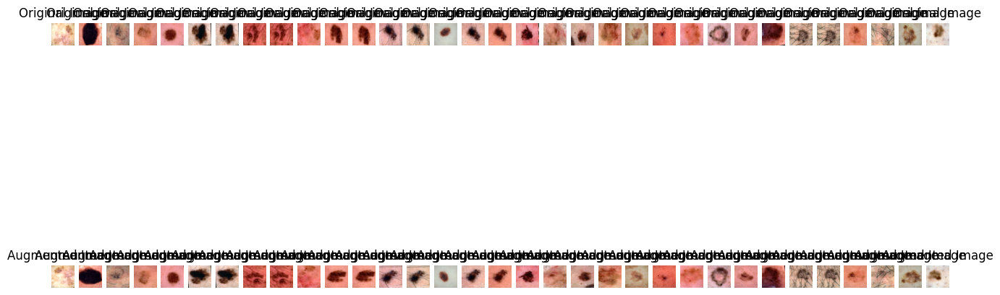

In [205]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/38.jpg',
    '/content/drive/MyDrive/Data/train/malignant/380.jpg',
    '/content/drive/MyDrive/Data/train/malignant/383.jpg',
    '/content/drive/MyDrive/Data/train/malignant/385.jpg',
    '/content/drive/MyDrive/Data/train/malignant/386.jpg',
    '/content/drive/MyDrive/Data/train/malignant/387.jpg',
    '/content/drive/MyDrive/Data/train/malignant/388.jpg',
    '/content/drive/MyDrive/Data/train/malignant/391.jpg',
    '/content/drive/MyDrive/Data/train/malignant/392.jpg',
    '/content/drive/MyDrive/Data/train/malignant/393.jpg',
    '/content/drive/MyDrive/Data/train/malignant/395.jpg',
    '/content/drive/MyDrive/Data/train/malignant/396.jpg',
    '/content/drive/MyDrive/Data/train/malignant/397.jpg',
    '/content/drive/MyDrive/Data/train/malignant/398.jpg',
    '/content/drive/MyDrive/Data/train/malignant/40.jpg',
    '/content/drive/MyDrive/Data/train/malignant/400.jpg',
    '/content/drive/MyDrive/Data/train/malignant/401.jpg',
    '/content/drive/MyDrive/Data/train/malignant/403.jpg',
    '/content/drive/MyDrive/Data/train/malignant/404.jpg',
    '/content/drive/MyDrive/Data/train/malignant/406.jpg',
    '/content/drive/MyDrive/Data/train/malignant/408.jpg',
    '/content/drive/MyDrive/Data/train/malignant/41.jpg',
    '/content/drive/MyDrive/Data/train/malignant/410.jpg',
    '/content/drive/MyDrive/Data/train/malignant/411.jpg',
    '/content/drive/MyDrive/Data/train/malignant/412.jpg',
    '/content/drive/MyDrive/Data/train/malignant/413.jpg',
    '/content/drive/MyDrive/Data/train/malignant/414.jpg',
    '/content/drive/MyDrive/Data/train/malignant/415.jpg',
    '/content/drive/MyDrive/Data/train/malignant/416.jpg',
    '/content/drive/MyDrive/Data/train/malignant/417.jpg',
    '/content/drive/MyDrive/Data/train/malignant/418.jpg',
    '/content/drive/MyDrive/Data/train/malignant/42.jpg',
    '/content/drive/MyDrive/Data/train/malignant/420.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




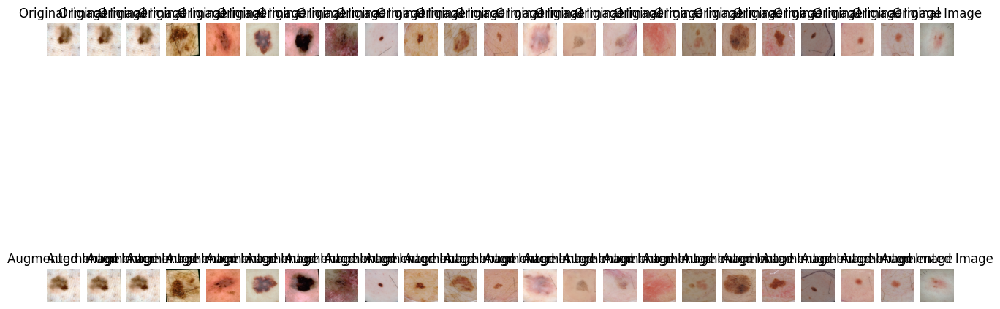

In [206]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/422.jpg',
    '/content/drive/MyDrive/Data/train/malignant/423.jpg',
    '/content/drive/MyDrive/Data/train/malignant/425.jpg',
    '/content/drive/MyDrive/Data/train/malignant/427.jpg',
    '/content/drive/MyDrive/Data/train/malignant/429.jpg',
    '/content/drive/MyDrive/Data/train/malignant/43.jpg',
    '/content/drive/MyDrive/Data/train/malignant/431.jpg',
    '/content/drive/MyDrive/Data/train/malignant/432.jpg',
    '/content/drive/MyDrive/Data/train/malignant/433.jpg',
    '/content/drive/MyDrive/Data/train/malignant/434.jpg',
    '/content/drive/MyDrive/Data/train/malignant/435.jpg',
    '/content/drive/MyDrive/Data/train/malignant/438.jpg',
    '/content/drive/MyDrive/Data/train/malignant/439.jpg',
    '/content/drive/MyDrive/Data/train/malignant/440.jpg',
    '/content/drive/MyDrive/Data/train/malignant/441.jpg',
    '/content/drive/MyDrive/Data/train/malignant/442.jpg',
    '/content/drive/MyDrive/Data/train/malignant/443.jpg',
    '/content/drive/MyDrive/Data/train/malignant/444.jpg',
    '/content/drive/MyDrive/Data/train/malignant/446.jpg',
    '/content/drive/MyDrive/Data/train/malignant/447.jpg',
    '/content/drive/MyDrive/Data/train/malignant/448.jpg',
    '/content/drive/MyDrive/Data/train/malignant/449.jpg',
    '/content/drive/MyDrive/Data/train/malignant/45.jpg',
                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




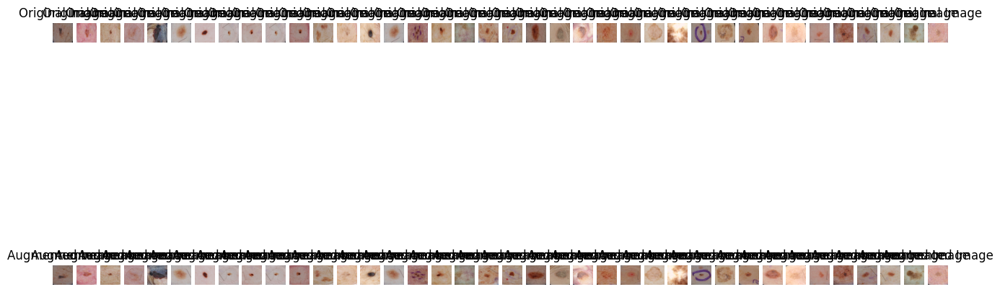

In [207]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/451.jpg',
    '/content/drive/MyDrive/Data/train/malignant/452.jpg',
    '/content/drive/MyDrive/Data/train/malignant/453.jpg',
    '/content/drive/MyDrive/Data/train/malignant/454.jpg',
    '/content/drive/MyDrive/Data/train/malignant/455.jpg',
    '/content/drive/MyDrive/Data/train/malignant/456.jpg',
    '/content/drive/MyDrive/Data/train/malignant/457.jpg',
    '/content/drive/MyDrive/Data/train/malignant/458.jpg',
    '/content/drive/MyDrive/Data/train/malignant/460.jpg',
    '/content/drive/MyDrive/Data/train/malignant/461.jpg',
    '/content/drive/MyDrive/Data/train/malignant/462.jpg',
    '/content/drive/MyDrive/Data/train/malignant/464.jpg',
    '/content/drive/MyDrive/Data/train/malignant/465.jpg',
    '/content/drive/MyDrive/Data/train/malignant/466.jpg',
    '/content/drive/MyDrive/Data/train/malignant/467.jpg',
    '/content/drive/MyDrive/Data/train/malignant/468.jpg',
    '/content/drive/MyDrive/Data/train/malignant/469.jpg',
    '/content/drive/MyDrive/Data/train/malignant/47.jpg',
    '/content/drive/MyDrive/Data/train/malignant/470.jpg',
    '/content/drive/MyDrive/Data/train/malignant/471.jpg',
    '/content/drive/MyDrive/Data/train/malignant/472.jpg',
    '/content/drive/MyDrive/Data/train/malignant/473.jpg',
    '/content/drive/MyDrive/Data/train/malignant/475.jpg',
    '/content/drive/MyDrive/Data/train/malignant/476.jpg',
    '/content/drive/MyDrive/Data/train/malignant/477.jpg',
    '/content/drive/MyDrive/Data/train/malignant/478.jpg',
    '/content/drive/MyDrive/Data/train/malignant/48.jpg',
    '/content/drive/MyDrive/Data/train/malignant/480.jpg',
    '/content/drive/MyDrive/Data/train/malignant/481.jpg',
    '/content/drive/MyDrive/Data/train/malignant/482.jpg',
    '/content/drive/MyDrive/Data/train/malignant/484.jpg',
    '/content/drive/MyDrive/Data/train/malignant/485.jpg',
    '/content/drive/MyDrive/Data/train/malignant/486.jpg',
    '/content/drive/MyDrive/Data/train/malignant/487.jpg',
    '/content/drive/MyDrive/Data/train/malignant/488.jpg',
    '/content/drive/MyDrive/Data/train/malignant/489.jpg',
    '/content/drive/MyDrive/Data/train/malignant/49.jpg',
    '/content/drive/MyDrive/Data/train/malignant/490.jpg',




                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




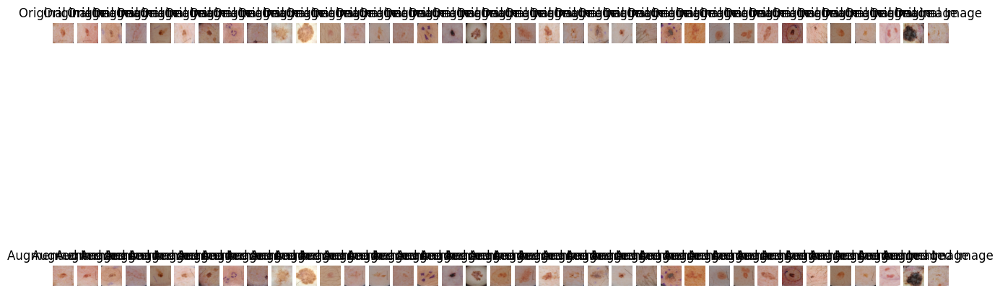

In [208]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/491.jpg',
    '/content/drive/MyDrive/Data/train/malignant/492.jpg',
    '/content/drive/MyDrive/Data/train/malignant/493.jpg',
    '/content/drive/MyDrive/Data/train/malignant/494.jpg',
    '/content/drive/MyDrive/Data/train/malignant/495.jpg',
    '/content/drive/MyDrive/Data/train/malignant/496.jpg',
    '/content/drive/MyDrive/Data/train/malignant/497.jpg',
    '/content/drive/MyDrive/Data/train/malignant/498.jpg',
    '/content/drive/MyDrive/Data/train/malignant/499.jpg',
    '/content/drive/MyDrive/Data/train/malignant/5.jpg',
    '/content/drive/MyDrive/Data/train/malignant/50.jpg',
    '/content/drive/MyDrive/Data/train/malignant/500.jpg',
    '/content/drive/MyDrive/Data/train/malignant/502.jpg',
    '/content/drive/MyDrive/Data/train/malignant/503.jpg',
    '/content/drive/MyDrive/Data/train/malignant/505.jpg',
    '/content/drive/MyDrive/Data/train/malignant/506.jpg',
    '/content/drive/MyDrive/Data/train/malignant/509.jpg',
    '/content/drive/MyDrive/Data/train/malignant/51.jpg',
    '/content/drive/MyDrive/Data/train/malignant/510.jpg',
    '/content/drive/MyDrive/Data/train/malignant/512.jpg',
    '/content/drive/MyDrive/Data/train/malignant/513.jpg',
    '/content/drive/MyDrive/Data/train/malignant/514.jpg',
    '/content/drive/MyDrive/Data/train/malignant/515.jpg',
    '/content/drive/MyDrive/Data/train/malignant/516.jpg',
    '/content/drive/MyDrive/Data/train/malignant/517.jpg',
    '/content/drive/MyDrive/Data/train/malignant/518.jpg',
    '/content/drive/MyDrive/Data/train/malignant/520.jpg',
    '/content/drive/MyDrive/Data/train/malignant/521.jpg',
    '/content/drive/MyDrive/Data/train/malignant/522.jpg',
    '/content/drive/MyDrive/Data/train/malignant/523.jpg',
    '/content/drive/MyDrive/Data/train/malignant/524.jpg',
    '/content/drive/MyDrive/Data/train/malignant/525.jpg',
    '/content/drive/MyDrive/Data/train/malignant/526.jpg',
    '/content/drive/MyDrive/Data/train/malignant/527.jpg',
    '/content/drive/MyDrive/Data/train/malignant/529.jpg',
    '/content/drive/MyDrive/Data/train/malignant/53.jpg',
    '/content/drive/MyDrive/Data/train/malignant/530.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




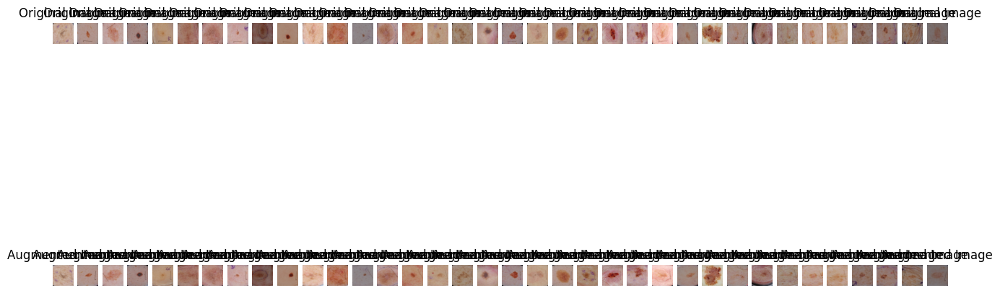

In [209]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/531.jpg',
    '/content/drive/MyDrive/Data/train/malignant/532.jpg',
    '/content/drive/MyDrive/Data/train/malignant/533.jpg',
    '/content/drive/MyDrive/Data/train/malignant/534.jpg',
    '/content/drive/MyDrive/Data/train/malignant/535.jpg',
    '/content/drive/MyDrive/Data/train/malignant/537.jpg',
    '/content/drive/MyDrive/Data/train/malignant/538.jpg',
    '/content/drive/MyDrive/Data/train/malignant/539.jpg',
    '/content/drive/MyDrive/Data/train/malignant/540.jpg',
    '/content/drive/MyDrive/Data/train/malignant/541.jpg',
    '/content/drive/MyDrive/Data/train/malignant/542.jpg',
    '/content/drive/MyDrive/Data/train/malignant/543.jpg',
    '/content/drive/MyDrive/Data/train/malignant/544.jpg',
    '/content/drive/MyDrive/Data/train/malignant/545.jpg',
    '/content/drive/MyDrive/Data/train/malignant/547.jpg',
    '/content/drive/MyDrive/Data/train/malignant/548.jpg',
    '/content/drive/MyDrive/Data/train/malignant/549.jpg',
    '/content/drive/MyDrive/Data/train/malignant/55.jpg',
    '/content/drive/MyDrive/Data/train/malignant/550.jpg',
    '/content/drive/MyDrive/Data/train/malignant/551.jpg',
    '/content/drive/MyDrive/Data/train/malignant/552.jpg',
    '/content/drive/MyDrive/Data/train/malignant/553.jpg',
    '/content/drive/MyDrive/Data/train/malignant/555.jpg',
    '/content/drive/MyDrive/Data/train/malignant/557.jpg',
    '/content/drive/MyDrive/Data/train/malignant/558.jpg',
    '/content/drive/MyDrive/Data/train/malignant/559.jpg',
    '/content/drive/MyDrive/Data/train/malignant/56.jpg',
    '/content/drive/MyDrive/Data/train/malignant/560.jpg',
    '/content/drive/MyDrive/Data/train/malignant/561.jpg',
    '/content/drive/MyDrive/Data/train/malignant/563.jpg',
    '/content/drive/MyDrive/Data/train/malignant/564.jpg',
    '/content/drive/MyDrive/Data/train/malignant/565.jpg',
    '/content/drive/MyDrive/Data/train/malignant/566.jpg',
    '/content/drive/MyDrive/Data/train/malignant/567.jpg',
    '/content/drive/MyDrive/Data/train/malignant/569.jpg',
    '/content/drive/MyDrive/Data/train/malignant/571.jpg',


                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




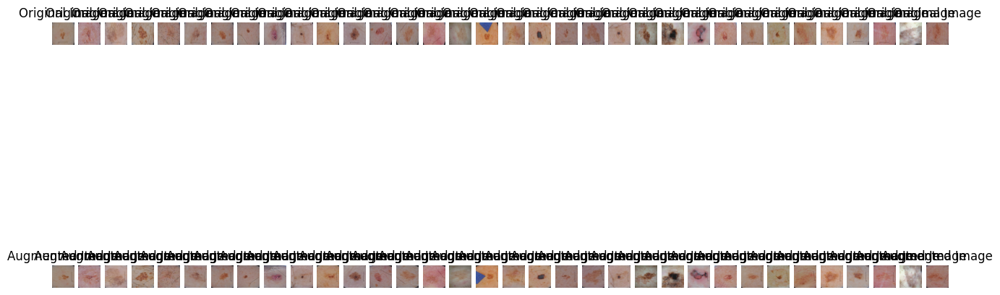

In [210]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/574.jpg',
    '/content/drive/MyDrive/Data/train/malignant/576.jpg',
    '/content/drive/MyDrive/Data/train/malignant/577.jpg',
    '/content/drive/MyDrive/Data/train/malignant/578.jpg',
    '/content/drive/MyDrive/Data/train/malignant/579.jpg',
    '/content/drive/MyDrive/Data/train/malignant/580.jpg',
    '/content/drive/MyDrive/Data/train/malignant/581.jpg',
    '/content/drive/MyDrive/Data/train/malignant/582.jpg',
    '/content/drive/MyDrive/Data/train/malignant/583.jpg',
    '/content/drive/MyDrive/Data/train/malignant/584.jpg',
    '/content/drive/MyDrive/Data/train/malignant/585.jpg',
    '/content/drive/MyDrive/Data/train/malignant/586.jpg',
    '/content/drive/MyDrive/Data/train/malignant/587.jpg',
    '/content/drive/MyDrive/Data/train/malignant/588.jpg',
    '/content/drive/MyDrive/Data/train/malignant/589.jpg',
    '/content/drive/MyDrive/Data/train/malignant/59.jpg',
    '/content/drive/MyDrive/Data/train/malignant/591.jpg',
    '/content/drive/MyDrive/Data/train/malignant/594.jpg',
    '/content/drive/MyDrive/Data/train/malignant/595.jpg',
    '/content/drive/MyDrive/Data/train/malignant/597.jpg',
    '/content/drive/MyDrive/Data/train/malignant/598.jpg',
    '/content/drive/MyDrive/Data/train/malignant/599.jpg',
    '/content/drive/MyDrive/Data/train/malignant/6.jpg',
    '/content/drive/MyDrive/Data/train/malignant/60.jpg',
    '/content/drive/MyDrive/Data/train/malignant/600.jpg',
    '/content/drive/MyDrive/Data/train/malignant/601.jpg',
    '/content/drive/MyDrive/Data/train/malignant/604.jpg',
    '/content/drive/MyDrive/Data/train/malignant/605.jpg',
    '/content/drive/MyDrive/Data/train/malignant/606.jpg',
    '/content/drive/MyDrive/Data/train/malignant/607.jpg',
    '/content/drive/MyDrive/Data/train/malignant/608.jpg',
    '/content/drive/MyDrive/Data/train/malignant/609.jpg',
    '/content/drive/MyDrive/Data/train/malignant/61.jpg',
    '/content/drive/MyDrive/Data/train/malignant/610.jpg',
                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




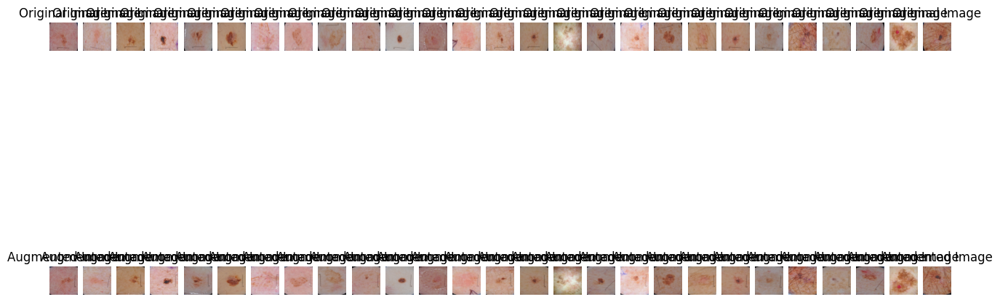

In [211]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/611.jpg',
    '/content/drive/MyDrive/Data/train/malignant/612.jpg',
    '/content/drive/MyDrive/Data/train/malignant/613.jpg',
    '/content/drive/MyDrive/Data/train/malignant/616.jpg',
    '/content/drive/MyDrive/Data/train/malignant/617.jpg',
    '/content/drive/MyDrive/Data/train/malignant/618.jpg',
    '/content/drive/MyDrive/Data/train/malignant/620.jpg',
    '/content/drive/MyDrive/Data/train/malignant/621.jpg',
    '/content/drive/MyDrive/Data/train/malignant/622.jpg',
    '/content/drive/MyDrive/Data/train/malignant/623.jpg',
    '/content/drive/MyDrive/Data/train/malignant/624.jpg',
    '/content/drive/MyDrive/Data/train/malignant/625.jpg',
    '/content/drive/MyDrive/Data/train/malignant/626.jpg',
    '/content/drive/MyDrive/Data/train/malignant/627.jpg',
    '/content/drive/MyDrive/Data/train/malignant/629.jpg',
    '/content/drive/MyDrive/Data/train/malignant/63.jpg',
    '/content/drive/MyDrive/Data/train/malignant/630.jpg',
    '/content/drive/MyDrive/Data/train/malignant/631.jpg',
    '/content/drive/MyDrive/Data/train/malignant/632.jpg',
    '/content/drive/MyDrive/Data/train/malignant/633.jpg',
    '/content/drive/MyDrive/Data/train/malignant/634.jpg',
    '/content/drive/MyDrive/Data/train/malignant/635.jpg',
    '/content/drive/MyDrive/Data/train/malignant/636.jpg',
    '/content/drive/MyDrive/Data/train/malignant/637.jpg',
    '/content/drive/MyDrive/Data/train/malignant/639.jpg',
    '/content/drive/MyDrive/Data/train/malignant/64.jpg',
    '/content/drive/MyDrive/Data/train/malignant/640.jpg',


                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




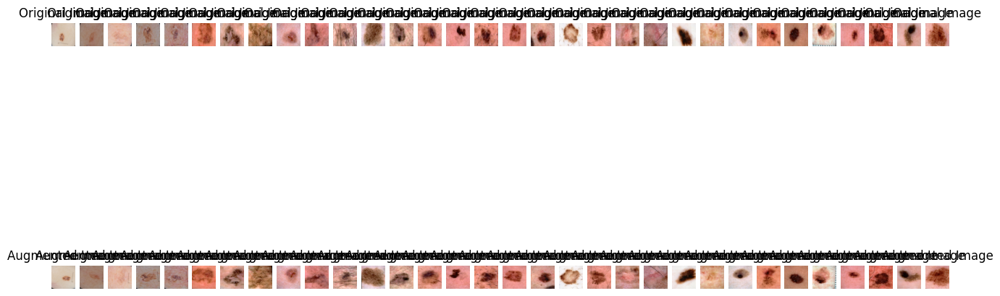

In [212]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/642.jpg',
    '/content/drive/MyDrive/Data/train/malignant/644.jpg',
    '/content/drive/MyDrive/Data/train/malignant/645.jpg',
    '/content/drive/MyDrive/Data/train/malignant/646.jpg',
    '/content/drive/MyDrive/Data/train/malignant/647.jpg',
    '/content/drive/MyDrive/Data/train/malignant/648.jpg',
    '/content/drive/MyDrive/Data/train/malignant/649.jpg',
    '/content/drive/MyDrive/Data/train/malignant/650.jpg',
    '/content/drive/MyDrive/Data/train/malignant/651.jpg',
    '/content/drive/MyDrive/Data/train/malignant/652.jpg',
    '/content/drive/MyDrive/Data/train/malignant/654.jpg',
    '/content/drive/MyDrive/Data/train/malignant/655.jpg',
    '/content/drive/MyDrive/Data/train/malignant/656.jpg',
    '/content/drive/MyDrive/Data/train/malignant/657.jpg',
    '/content/drive/MyDrive/Data/train/malignant/659.jpg',
    '/content/drive/MyDrive/Data/train/malignant/661.jpg',
    '/content/drive/MyDrive/Data/train/malignant/662.jpg',
    '/content/drive/MyDrive/Data/train/malignant/663.jpg',
    '/content/drive/MyDrive/Data/train/malignant/664.jpg',
    '/content/drive/MyDrive/Data/train/malignant/665.jpg',
    '/content/drive/MyDrive/Data/train/malignant/666.jpg',
    '/content/drive/MyDrive/Data/train/malignant/668.jpg',
    '/content/drive/MyDrive/Data/train/malignant/669.jpg',
    '/content/drive/MyDrive/Data/train/malignant/67.jpg',
    '/content/drive/MyDrive/Data/train/malignant/671.jpg',
    '/content/drive/MyDrive/Data/train/malignant/672.jpg',
    '/content/drive/MyDrive/Data/train/malignant/673.jpg',
    '/content/drive/MyDrive/Data/train/malignant/675.jpg',
    '/content/drive/MyDrive/Data/train/malignant/676.jpg',
    '/content/drive/MyDrive/Data/train/malignant/677.jpg',
    '/content/drive/MyDrive/Data/train/malignant/678.jpg',
    '/content/drive/MyDrive/Data/train/malignant/680.jpg',
                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




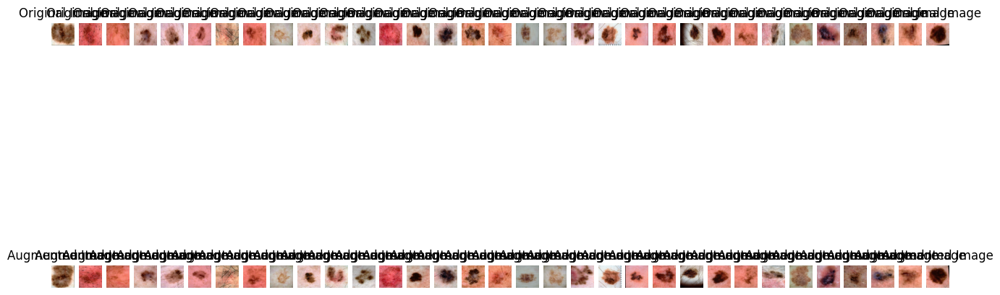

In [213]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/681.jpg',
    '/content/drive/MyDrive/Data/train/malignant/682.jpg',
    '/content/drive/MyDrive/Data/train/malignant/683.jpg',
    '/content/drive/MyDrive/Data/train/malignant/684.jpg',
    '/content/drive/MyDrive/Data/train/malignant/685.jpg',
    '/content/drive/MyDrive/Data/train/malignant/687.jpg',
    '/content/drive/MyDrive/Data/train/malignant/688.jpg',
    '/content/drive/MyDrive/Data/train/malignant/689.jpg',
    '/content/drive/MyDrive/Data/train/malignant/69.jpg',
    '/content/drive/MyDrive/Data/train/malignant/690.jpg',
    '/content/drive/MyDrive/Data/train/malignant/691.jpg',
    '/content/drive/MyDrive/Data/train/malignant/692.jpg',
    '/content/drive/MyDrive/Data/train/malignant/693.jpg',
    '/content/drive/MyDrive/Data/train/malignant/695.jpg',
    '/content/drive/MyDrive/Data/train/malignant/697.jpg',
    '/content/drive/MyDrive/Data/train/malignant/698.jpg',
    '/content/drive/MyDrive/Data/train/malignant/699.jpg',
    '/content/drive/MyDrive/Data/train/malignant/7.jpg',
    '/content/drive/MyDrive/Data/train/malignant/70.jpg',
    '/content/drive/MyDrive/Data/train/malignant/700.jpg',
    '/content/drive/MyDrive/Data/train/malignant/701.jpg',
    '/content/drive/MyDrive/Data/train/malignant/702.jpg',
    '/content/drive/MyDrive/Data/train/malignant/703.jpg',
    '/content/drive/MyDrive/Data/train/malignant/704.jpg',
    '/content/drive/MyDrive/Data/train/malignant/705.jpg',
    '/content/drive/MyDrive/Data/train/malignant/707.jpg',
    '/content/drive/MyDrive/Data/train/malignant/708.jpg',
    '/content/drive/MyDrive/Data/train/malignant/71.jpg',
    '/content/drive/MyDrive/Data/train/malignant/710.jpg',
    '/content/drive/MyDrive/Data/train/malignant/711.jpg',
    '/content/drive/MyDrive/Data/train/malignant/712.jpg',
    '/content/drive/MyDrive/Data/train/malignant/714.jpg',
    '/content/drive/MyDrive/Data/train/malignant/715.jpg',
               #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




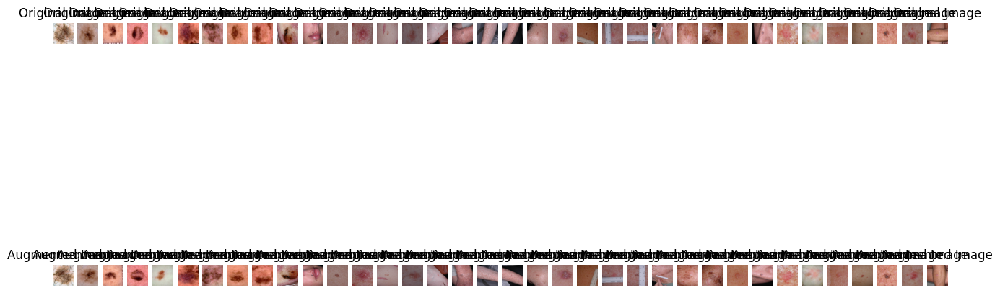

In [214]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/716.jpg',
    '/content/drive/MyDrive/Data/train/malignant/717.jpg',
    '/content/drive/MyDrive/Data/train/malignant/718.jpg',
    '/content/drive/MyDrive/Data/train/malignant/719.jpg',
    '/content/drive/MyDrive/Data/train/malignant/72.jpg',
    '/content/drive/MyDrive/Data/train/malignant/720.jpg',
    '/content/drive/MyDrive/Data/train/malignant/721.jpg',
    '/content/drive/MyDrive/Data/train/malignant/722.jpg',
    '/content/drive/MyDrive/Data/train/malignant/723.jpg',
    '/content/drive/MyDrive/Data/train/malignant/724.jpg',
    '/content/drive/MyDrive/Data/train/malignant/725.jpg',
    '/content/drive/MyDrive/Data/train/malignant/726.jpg',
    '/content/drive/MyDrive/Data/train/malignant/727.jpg',
    '/content/drive/MyDrive/Data/train/malignant/728.jpg',
    '/content/drive/MyDrive/Data/train/malignant/729.jpg',
    '/content/drive/MyDrive/Data/train/malignant/730.jpg',
    '/content/drive/MyDrive/Data/train/malignant/731.jpg',
    '/content/drive/MyDrive/Data/train/malignant/732.jpg',
    '/content/drive/MyDrive/Data/train/malignant/733.jpg',
    '/content/drive/MyDrive/Data/train/malignant/734.jpg',
    '/content/drive/MyDrive/Data/train/malignant/736.jpg',
    '/content/drive/MyDrive/Data/train/malignant/737.jpg',
    '/content/drive/MyDrive/Data/train/malignant/738.jpg',
    '/content/drive/MyDrive/Data/train/malignant/740.jpg',
    '/content/drive/MyDrive/Data/train/malignant/741.jpg',
    '/content/drive/MyDrive/Data/train/malignant/742.jpg',
    '/content/drive/MyDrive/Data/train/malignant/743.jpg',
    '/content/drive/MyDrive/Data/train/malignant/745.jpg',
    '/content/drive/MyDrive/Data/train/malignant/746.jpg',
    '/content/drive/MyDrive/Data/train/malignant/748.jpg',
    '/content/drive/MyDrive/Data/train/malignant/75.jpg',
    '/content/drive/MyDrive/Data/train/malignant/750.jpg',
    '/content/drive/MyDrive/Data/train/malignant/751.jpg',
    '/content/drive/MyDrive/Data/train/malignant/752.jpg',
    '/content/drive/MyDrive/Data/train/malignant/753.jpg',
    '/content/drive/MyDrive/Data/train/malignant/754.jpg',
                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




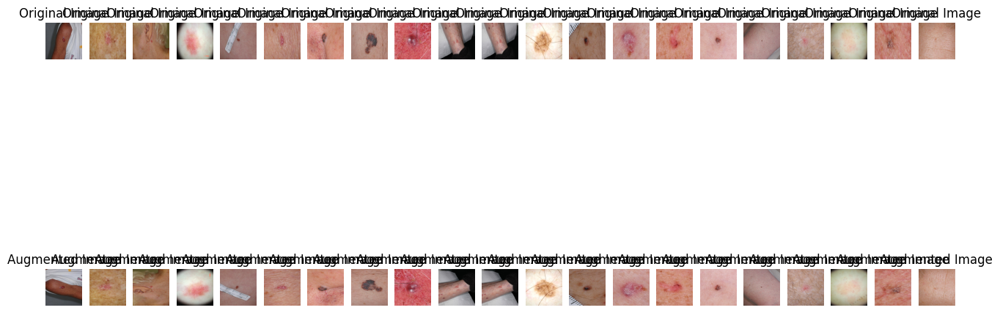

In [215]:
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_images_with_augmentation(image_paths, save_dir=None):
    augmented_images = []

    plt.figure(figsize=(16, 8))

    for i, image_path in enumerate(image_paths):
        original_image = plt.imread(image_path)

        # Perform augmentation on original_image and obtain augmented_image

        # Example of augmentation (rotate by 90 degrees)
        augmented_image = original_image.copy()
        augmented_image = np.rot90(augmented_image)

        plt.subplot(2, len(image_paths), i + 1)
        plt.imshow(original_image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, len(image_paths), len(image_paths) + i + 1)
        plt.imshow(augmented_image)
        plt.title("Augmented Image")
        plt.axis('off')

        augmented_images.append((original_image, augmented_image))

    if save_dir:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, (original_image, augmented_image) in enumerate(augmented_images):
            plt.imsave(os.path.join(save_dir, f"original_{i}.jpg"), original_image)
            plt.imsave(os.path.join(save_dir, f"augmented_{i}.jpg"), augmented_image)

    plt.show()
    # Example usage
image_paths = [
    '/content/drive/MyDrive/Data/train/malignant/755.jpg',
    '/content/drive/MyDrive/Data/train/malignant/756.jpg',
    '/content/drive/MyDrive/Data/train/malignant/758.jpg',
    '/content/drive/MyDrive/Data/train/malignant/76.jpg',
    '/content/drive/MyDrive/Data/train/malignant/760.jpg',
    '/content/drive/MyDrive/Data/train/malignant/761.jpg',
    '/content/drive/MyDrive/Data/train/malignant/764.jpg',
    '/content/drive/MyDrive/Data/train/malignant/765.jpg',
    '/content/drive/MyDrive/Data/train/malignant/766.jpg',
    '/content/drive/MyDrive/Data/train/malignant/768.jpg',
    '/content/drive/MyDrive/Data/train/malignant/769.jpg',
    '/content/drive/MyDrive/Data/train/malignant/77.jpg',
    '/content/drive/MyDrive/Data/train/malignant/770.jpg',
    '/content/drive/MyDrive/Data/train/malignant/772.jpg',
    '/content/drive/MyDrive/Data/train/malignant/774.jpg',
    '/content/drive/MyDrive/Data/train/malignant/775.jpg',
    '/content/drive/MyDrive/Data/train/malignant/777.jpg',
    '/content/drive/MyDrive/Data/train/malignant/779.jpg',
    '/content/drive/MyDrive/Data/train/malignant/78.jpg',
    '/content/drive/MyDrive/Data/train/malignant/780.jpg',
    '/content/drive/MyDrive/Data/train/malignant/781.jpg',

                    #Add more image paths as needed
]

save_dir = '/content/drive/MyDrive/Data/train/train malignant augmented'
plot_images_with_augmentation(image_paths, save_dir)




In [216]:
from sklearn.metrics import accuracy_score

# Assuming y_true contains the actual values and y_pred contains the predicted values
accuracy = accuracy_score(y_true, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8


apply gan

In [217]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Reshape, Flatten, LeakyReLU, BatchNormalization, Conv2DTranspose

def build_generator(noise_dim):
    model = tf.keras.Sequential()
    model.add(Dense(128 * 32 * 32, input_dim=noise_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((32, 32, 128)))
    model.add(BatchNormalization())
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization())
    model.add(Conv2DTranspose(64, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization())
    model.add(Conv2DTranspose(3, (7,7), activation='tanh', padding='same'))

    return model

generator = build_generator(100)  # 100 is the noise dimension
generator.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 131072)            13238272  
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 131072)            0         
                                                                 
 reshape_1 (Reshape)         (None, 32, 32, 128)       0         
                                                                 
 batch_normalization_3 (Bat  (None, 32, 32, 128)       512       
 chNormalization)                                                
                                                                 
 conv2d_transpose_3 (Conv2D  (None, 64, 64, 128)       262272    
 Transpose)                                                      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 64, 64, 128)      

In [218]:
from tensorflow.keras.layers import Conv2D, Dropout

def build_discriminator(img_shape):
    model = tf.keras.Sequential()
    model.add(Conv2D(64, (3, 3), padding='same', input_shape=img_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

discriminator = build_discriminator((128, 128, 3))  # Adjust input shape as needed
discriminator.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 128, 128, 64)      1792      
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 128, 128, 64)      0         
                                                                 
 dropout_7 (Dropout)         (None, 128, 128, 64)      0         
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_11 (LeakyReLU)  (None, 64, 64, 128)       0         
                                                                 
 dropout_8 (Dropout)         (None, 64, 64, 128)       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 128)      

In [219]:
import numpy as np

# GAN Training
def train_gan(generator, discriminator, epochs, batch_size, noise_dim, dataset):
    half_batch = int(batch_size / 2)

    for epoch in range(epochs):
        for _ in range(half_batch):
            # Train Discriminator
            noise = np.random.normal(0, 1, (half_batch, noise_dim))
            gen_images = generator.predict(noise)
            real_images = dataset[np.random.randint(0, dataset.shape[0], half_batch)]

            d_loss_real = discriminator.train_on_batch(real_images, np.ones((half_batch, 1)))
            d_loss_fake = discriminator.train_on_batch(gen_images, np.zeros((half_batch, 1)))
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train Generator
            noise = np.random.normal(0, 1, (batch_size, noise_dim))
            valid_y = np.array([1] * batch_size)
            g_loss = gan.train_on_batch(noise, valid_y)

        # Print the progress
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100*d_loss[1]}] [G loss: {g_loss}]")


1/1 [==============================] - 0s 271ms/step


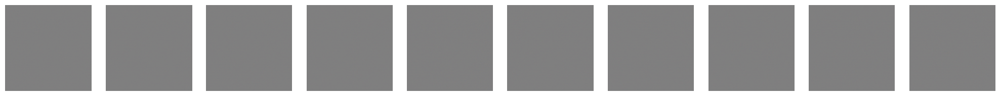

In [220]:
import matplotlib.pyplot as plt

def plot_generated_images(generator, noise_dim, examples=10, dim=(1, 10), figsize=(20, 2)):
    noise = np.random.normal(0, 1, (examples, noise_dim))
    generated_images = generator.predict(noise)
    generated_images = (generated_images + 1) / 2.0  # Rescale to [0, 1]

    plt.figure(figsize=figsize)
    for i in range(examples):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_generated_images(generator, 100)


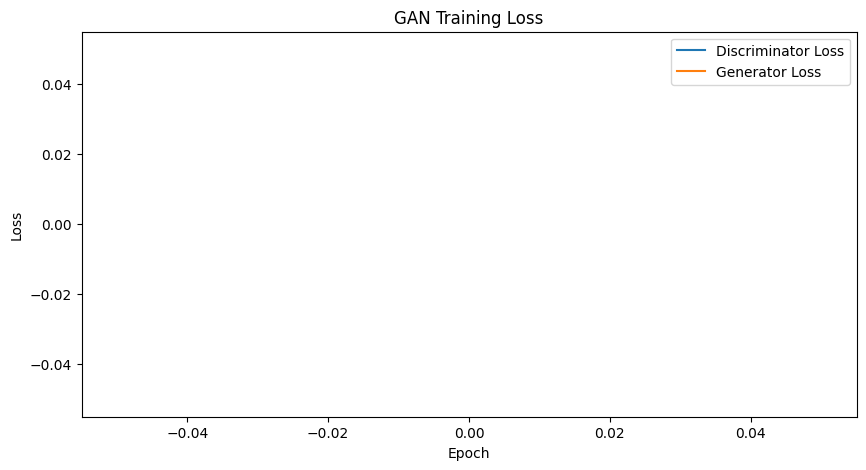

In [221]:
d_losses = []
g_losses = []

def train_gan(generator, discriminator, epochs, batch_size, noise_dim, dataset):
    half_batch = int(batch_size / 2)

    for epoch in range(epochs):
        for _ in range(half_batch):
            # Train Discriminator
            noise = np.random.normal(0, 1, (half_batch, noise_dim))
            gen_images = generator.predict(noise)
            real_images = dataset[np.random.randint(0, dataset.shape[0], half_batch)]

            d_loss_real = discriminator.train_on_batch(real_images, np.ones((half_batch, 1)))
            d_loss_fake = discriminator.train_on_batch(gen_images, np.zeros((half_batch, 1)))
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train Generator
            noise = np.random.normal(0, 1, (batch_size, noise_dim))
            valid_y = np.array([1] * batch_size)
            g_loss = gan.train_on_batch(noise, valid_y)

        # Save losses
        d_losses.append(d_loss[0])
        g_losses.append(g_loss)

        # Print the progress
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100*d_loss[1]}] [G loss: {g_loss}]")

# Plot the loss
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label='Discriminator Loss')
plt.plot(g_losses, label='Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('GAN Training Loss')
plt.show()
